#### This code reproduces the findings of the following scientific article:
### Data-driven analysis of the local current distributions of 316L stainless steel corrosion in NaCl solution
#### _Leonardo Bertolucci Coelho$^{1,2,*}$, Daniel Torres$^{1}$, Miguel Bernal$^{1}$, Gian Marco Paldino$^{3}$, Gianluca Bontempi$^{3}$, Jon Ustarroz$^{1,2}$_ 

_$^{1}$ChemSIN – Chemistry of Surfaces, Interfaces and Nanomaterials, Université libre de Bruxelles (ULB), Brussels, Belgium_ 

_$^{2}$Research Group Electrochemical and Surface Engineering (SURF), Vrije Universiteit Brussel, Brussels, Belgium_

_$^{3}$Machine Learning Group (MLG), Université libre de Bruxelles (ULB), Brussels, Belgium_

_*leonardo.bertolucci.coelho@ulb.be_

In [1]:
# importing the required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

In [2]:
# choosing the directory for uploading the datasets
os.chdir(r"C:\Users\lbertolu\OneDrive - Vrije Universiteit Brussel\ULB\SECCM tests\pitting statistics paper draft\paper1")

# getting the current directory
%pwd

'C:\\Users\\lbertolu\\OneDrive - Vrije Universiteit Brussel\\ULB\\SECCM tests\\pitting statistics paper draft\\paper1'

### Opening the "individual potentiodynamic polarisation curves" into pandas dataframes

The potentials (E (V)) and current densities (j (µA/cm²)) are separetly loaded for each dataset 
- columns = test number
- rows = data points (from 0.05 to ~1.355 V)

In [3]:
j_0005_100=pd.read_csv('j_uA-cm2_0.005_M_NaCl_100_mV_per_s.csv') 
j_0005_100=j_0005_100
j_0005_100

,0,1,2,3,4,5,6,7,8,9,...,277,278,279,280,281,282,283,284,285,286
0,136.000808,145.715152,126.286465,136.000808,126.286465,174.858185,194.286859,77.714748,174.858185,184.572516,...,146.213324,140.461707,48.571714,29.143030,29.143030,38.857374,58.286061,58.286061,77.714748,38.857374
1,174.858185,126.286465,145.715152,165.143842,116.572118,106.857775,136.000808,194.286859,126.286465,145.715152,...,144.832030,134.030767,38.857374,68.000404,87.429094,97.143431,87.429094,68.000404,38.857374,58.286061
2,106.857775,136.000808,136.000808,116.572118,165.143842,204.001206,136.000808,165.143842,145.715152,165.143842,...,145.737796,141.254253,58.286061,58.286061,48.571714,87.429094,38.857374,NaN,48.571714,58.286061
3,155.429498,116.572118,145.715152,155.429498,165.143842,136.000808,204.001206,126.286465,174.858185,126.286465,...,146.054815,137.925560,58.286061,68.000404,68.000404,58.286061,38.857374,68.000404,58.286061,68.000404
4,136.000808,145.715152,126.286465,145.715152,145.715152,136.000808,136.000808,204.001206,155.429498,87.429094,...,145.941594,140.461705,77.714748,58.286061,97.143431,38.857374,38.857374,68.000404,68.000404,77.714748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1103,6333.751760,6246.322857,6226.893858,5935.463650,6887.469633,9160.625572,12570.360436,201086.907075,276781.055305,278393.641837,...,3346.172366,3185.149740,1697.103250,1764.483428,1692.612205,1696.565188,2053.724217,2228.373150,2180.548694,2041.476648
1104,6411.466482,6265.751538,6236.608358,6285.180218,7334.328966,9452.056417,12754.932424,206031.510565,272934.197570,276703.365411,...,3381.327380,3209.435593,1711.203993,1781.520892,1708.319550,1713.087043,2073.862797,2251.201855,2201.763323,2062.280286
1105,6547.467246,6294.894718,6265.751538,6256.037038,7470.329730,10190.346277,11948.642341,210519.530355,284474.831254,275440.502769,...,3408.489009,3236.484032,1725.304736,1798.558356,1724.026895,1729.608898,2094.001377,2274.030560,2222.977953,2083.083924
1106,6644.610649,6362.894940,6217.179677,6372.609121,7023.470078,9306.340835,13289.221616,209431.524882,273245.043090,282813.677001,...,3423.796431,3268.299064,1739.405480,1815.595819,1739.734241,1746.130753,2114.139957,2296.859265,2244.192582,2103.887562


In [4]:
E_0005_100=pd.read_csv('E(V)_0.005_M_NaCl_100_mV_per_s.csv') 
E_0005_100

,E (V)
0,0.500198
1,0.500809
2,0.501724
3,0.502335
4,0.503250
...,...
1103,1.350444
1104,1.351360
1105,1.351970
1106,1.352885


In [5]:
j_001_100=pd.read_csv('j_uA-cm2_0.01_M_NaCl_100_mV_per_s.csv') 
j_001_100=j_001_100
j_001_100

,0,1,2,3,4,5,6,7,8,9,...,367,368,369,370,371,372,373,374,375,376
0,126.286465,165.143842,184.572516,194.286859,145.715152,165.143842,145.715152,145.715152,136.000808,165.143842,...,165.143842,155.429498,155.429498,145.715152,126.286465,174.858185,165.143842,184.572516,155.429498,165.143842
1,155.429498,126.286465,126.286465,233.144239,136.000808,126.286465,145.715152,165.143842,145.715152,136.000808,...,136.000808,174.858185,145.715152,165.143842,184.572516,136.000808,155.429498,155.429498,155.429498,116.572118
2,145.715152,174.858185,145.715152,262.287257,136.000808,174.858185,145.715152,116.572118,136.000808,126.286465,...,155.429498,136.000808,165.143842,165.143842,136.000808,145.715152,174.858185,155.429498,165.143842,165.143842
3,155.429498,136.000808,155.429498,184.572516,155.429498,126.286465,155.429498,136.000808,165.143842,136.000808,...,155.429498,145.715152,145.715152,184.572516,204.001206,155.429498,136.000808,155.429498,194.286859,136.000808
4,165.143842,145.715152,145.715152,204.001206,136.000808,136.000808,116.572118,136.000808,126.286465,145.715152,...,136.000808,165.143842,184.572516,136.000808,126.286465,204.001206,145.715152,145.715152,116.572118,194.286859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1103,6673.753829,6732.039870,6761.183050,49222.578180,7353.757965,8072.618826,8198.905409,8004.618604,8014.333421,8140.620004,...,6945.755356,7276.043243,7412.044007,7674.331353,7431.473006,7208.043021,7072.041939,6498.895704,6460.038343,5576.033220
1104,6819.468773,6906.898313,6693.182827,49756.864507,7470.329730,8373.763534,8402.907032,7926.904518,8150.333867,8072.618826,...,7072.041939,7188.614022,7674.331353,7761.760256,7421.758188,7373.186646,7305.186423,6440.609662,6547.467246,5634.318943
1105,6877.755133,7033.184577,6702.897009,51184.875867,7616.044993,8364.049671,8616.622836,7946.333199,8490.336253,8169.762547,...,7198.328521,7363.472146,7771.474119,8062.904964,7713.188714,7431.473006,7314.900286,6469.752842,6829.183273,5760.605526
1106,7130.327980,6936.040857,6868.040634,53118.029102,7664.616535,8373.763534,8713.765602,8140.620004,8432.049893,8412.620895,...,7198.328521,7285.757424,8189.191546,8121.191323,7888.046839,7781.188937,7470.329730,6722.325371,6829.183273,5964.606830


In [6]:
E_001_100=pd.read_csv('E(V)_0.01_M_NaCl_100_mV_per_s.csv') 
E_001_100

,E (V)
0,0.500198
1,0.501114
2,0.501724
3,0.502640
4,0.503250
...,...
1103,1.350749
1104,1.351360
1105,1.352275
1106,1.352885


In [7]:
j_001_50=pd.read_csv('j_uA-cm2_0.01_M_NaCl_50_mV_per_s.csv') 
j_001_50=j_001_50
j_001_50

,0,1,2,3,4,5,6,7,8,9,...,109,110,111,112,113,114,115,116,117,118
0,660.575361,126.286465,174.858185,165.143842,165.143842,165.143842,155.429498,184.572516,184.572516,165.143842,...,126.286465,174.858185,126.286465,223.429893,281.715947,330.287696,223.429893,155.429498,126.286465,136.000808
1,650.860989,126.286465,155.429498,174.858185,165.143842,204.001206,155.429498,174.858185,136.000808,174.858185,...,126.286465,184.572516,106.857775,213.715549,242.858570,330.287696,155.429498,48.571714,116.572118,184.572516
2,699.432753,184.572516,136.000808,155.429498,184.572516,145.715152,165.143842,165.143842,136.000808,184.572516,...,204.001206,116.572118,184.572516,262.287257,281.715947,310.858993,194.286859,194.286859,194.286859,145.715152
3,660.575361,87.429094,165.143842,136.000808,136.000808,145.715152,165.143842,136.000808,165.143842,116.572118,...,116.572118,126.286465,155.429498,213.715549,281.715947,291.430307,184.572516,184.572516,58.286061,204.001206
4,514.860193,155.429498,145.715152,194.286859,136.000808,145.715152,145.715152,155.429498,136.000808,155.429498,...,97.143431,145.715152,87.429094,155.429498,165.143842,291.430307,165.143842,223.429893,136.000808,106.857775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2213,7888.046839,1923.440008,1816.582202,1729.153044,1573.723663,1136.578161,1136.578161,1049.149035,1466.865857,1360.008050,...,165784.984697,16922.386783,18874.968062,17621.818964,20477.835319,90770.825961,21643.556151,53807.746146,53545.461983,857139.620771
2214,8033.762102,1972.011710,1836.010851,1709.724395,1602.866589,1126.863789,1117.149512,952.005600,1476.580134,1437.722804,...,169126.716474,17048.672411,20536.122316,18000.677757,20759.551028,92616.552202,21730.986009,53176.314825,51981.452724,859446.065831
2215,8179.476728,1952.582934,1855.439531,1797.153553,1583.437940,1107.435140,1097.720736,1020.006109,1457.151485,1369.722454,...,172011.874099,17845.249586,23100.707826,18321.251144,20740.123302,92927.410454,23052.137239,51758.021465,50194.012206,861718.512213
2216,8024.047284,1972.011710,1806.867798,1758.296097,1593.152312,1107.435140,1126.863789,981.148653,1476.580134,1398.865475,...,172876.448313,18010.392574,25373.864402,18398.966503,21332.697580,96609.144936,23129.850688,51563.734660,48814.574934,864277.534576


In [8]:
E_001_50=pd.read_csv('E(V)_0.01_M_NaCl_50_mV_per_s.csv') 
E_001_50

,E (V)
0,0.499893
1,0.500198
2,0.500504
3,0.501114
4,0.501419
...,...
2213,1.352885
2214,1.353191
2215,1.353801
2216,1.354106


In [9]:
j_005_100=pd.read_csv('j_uA-cm2_0.05_M_NaCl_100_mV_per_s.csv') 
j_005_100=j_005_100
j_005_100

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,87.429094,87.429094,97.143431,77.714748,29.143030,68.000404,126.286465,77.714748,233.144239,136.000808,...,68.000404,145.715152,87.429094,58.286061,77.714748,NaN,19.428687,19.428687,68.000404,38.857374
1,58.286061,77.714748,116.572118,106.857775,97.143431,136.000808,87.429094,77.714748,136.000808,145.715152,...,29.143030,NaN,38.857374,NaN,NaN,68.000404,NaN,NaN,NaN,NaN
2,87.429094,136.000808,68.000404,106.857775,87.429094,106.857775,97.143431,116.572118,174.858185,165.143842,...,NaN,58.286061,58.286061,38.857374,87.429094,87.429094,NaN,29.143030,77.714748,NaN
3,58.286061,116.572118,136.000808,145.715152,145.715152,116.572118,145.715152,116.572118,106.857775,165.143842,...,77.714748,NaN,87.429094,136.000808,38.857374,29.143030,126.286465,38.857374,NaN,97.143431
4,116.572118,126.286465,77.714748,106.857775,48.571714,48.571714,48.571714,116.572118,145.715152,155.429498,...,38.857374,77.714748,NaN,NaN,NaN,NaN,87.429094,48.571714,19.428687,48.571714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1102,108373.216245,81347.907950,169068.433934,84971.359891,34524.775157,202252.631090,212112.690434,84475.929652,102437.749093,231240.221157,...,6090.893413,73411.293389,6343.466260,9947.487929,6430.895163,18282.393783,26228.726982,119826.422935,6188.036816,13337.792840
1103,120516.136797,92946.833723,162025.528491,79016.469470,44899.697559,203437.775190,194772.587497,69185.551396,62851.802182,246831.739664,...,6256.037038,76325.595467,5624.604762,11161.780303,8150.333867,17835.534768,21585.270746,95210.278028,10025.202015,4653.170418
1104,139721.398794,93413.122693,160675.232489,74713.018485,57790.630428,286388.564403,227665.346487,69350.693748,52865.456574,280890.248133,...,6149.179136,86418.794521,6168.608135,13590.366005,8412.620895,18379.536868,28171.595353,58907.777171,9082.910532,25509.864848
1105,151563.185461,116941.262127,178539.913301,78589.039772,61365.508281,228617.350878,220496.164329,86292.511440,74343.868144,306196.097352,...,5877.177927,54526.610827,5906.320471,15183.519081,8781.765825,16932.100010,20108.691344,103535.472566,7810.331798,20351.549373


In [10]:
E_005_100=pd.read_csv('E(V)_0.05_M_NaCl_100_mV_per_s.csv') 
E_005_100

,E (V)
0,0.500809
1,0.501724
2,0.502335
3,0.503250
4,0.503861
...,...
1102,1.350444
1103,1.351360
1104,1.351970
1105,1.352885


In [11]:
j_005_50=pd.read_csv('j_uA-cm2_0.05_M_NaCl_50_mV_per_s.csv') 
j_005_50=j_005_50
j_005_50

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
0,126.286465,77.714748,1.068578e+02,116.572118,136.000808,136.000808,1.845725e+02,155.429498,77.714748,145.715152,...,116.572118,106.857775,301.144634,106.857775,174.858185,116.572118,97.143431,145.715152,106.857775,184.572516
1,126.286465,126.286465,1.457152e+02,106.857775,136.000808,106.857775,7.771475e+01,NaN,126.286465,77.714748,...,97.143431,155.429498,573.146266,126.286465,204.001206,145.715152,136.000808,145.715152,116.572118,213.715549
2,145.715152,155.429498,1.068578e+02,126.286465,184.572516,184.572516,1.360008e+02,145.715152,145.715152,116.572118,...,136.000808,184.572516,660.575361,155.429498,126.286465,136.000808,126.286465,97.143431,126.286465,155.429498
3,184.572516,155.429498,1.360008e+02,126.286465,58.286061,87.429094,1.457152e+02,126.286465,155.429498,126.286465,...,136.000808,87.429094,NaN,106.857775,136.000808,116.572118,145.715152,145.715152,136.000808,184.572516
4,116.572118,106.857775,1.457152e+02,145.715152,155.429498,136.000808,1.554295e+02,310.858993,97.143431,145.715152,...,174.858185,136.000808,223.429893,136.000808,174.858185,106.857775,126.286465,145.715152,155.429498,194.286859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2212,331072.198847,509439.514952,2.129422e+06,526928.518383,317610.444772,371690.291149,1.440826e+06,589730.141418,48066.572166,466468.736179,...,1224.007191,2282.870725,295296.606624,1262.864648,4225.739128,922.862611,1437.722804,1301.721945,582.860607,961.720004
2213,334184.032131,512877.459322,2.141799e+06,530900.348134,317561.873867,375855.681112,1.447526e+06,590225.403644,49708.296784,472066.950212,...,1175.435490,2273.156353,296132.033202,1262.864648,4245.168127,903.433899,1466.865857,1292.007669,582.860607,961.720004
2214,337266.716188,516281.408196,2.154177e+06,535124.756778,317532.726230,379938.504675,1.454134e+06,590676.944415,51670.591289,477747.716322,...,1185.149894,2321.728055,297657.199106,1272.579020,4206.310447,961.720004,1457.151485,1340.579402,582.860607,952.005600
2215,340174.539891,519476.499630,2.166720e+06,539145.159026,317561.873867,384016.464462,1.460722e+06,591045.917194,52447.738510,483336.218721,...,1204.578543,2253.727577,297064.627056,1253.150244,4216.024947,932.576952,1447.437208,1292.007669,602.289255,990.863057


In [12]:
E_005_50=pd.read_csv('E(V)_0.05_M_NaCl_50_mV_per_s.csv') 
E_005_50

,E (V)
0,0.500198
1,0.500504
2,0.500809
3,0.501114
4,0.501724
...,...
2212,1.352885
2213,1.353191
2214,1.353496
2215,1.353801


### Potentiodynamic polarisation curves (j Vs E) 

(10, 4800000)

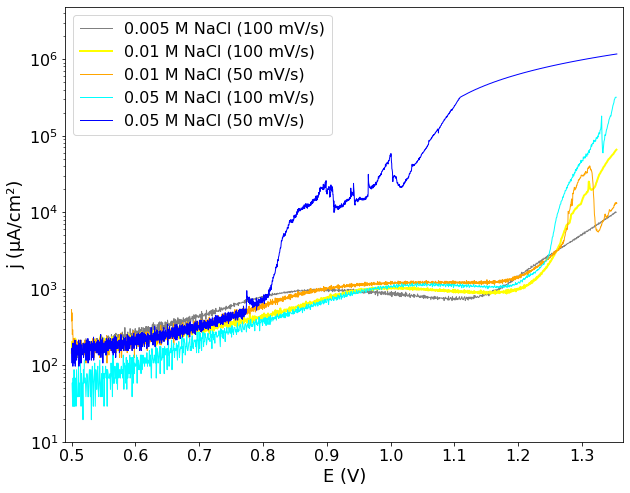

In [13]:
fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(E_0005_100,j_0005_100["84"], color="grey",linewidth=1,label="0.005 M NaCl (100 mV/s)")
ax.plot(E_001_100,j_001_100["253"], color="yellow",linewidth=2,label="0.01 M NaCl (100 mV/s)")
ax.plot(E_001_50,j_001_50["67"], color="orange",linewidth=1,label="0.01 M NaCl (50 mV/s)")
ax.plot(E_005_100,j_005_100["72"], color="cyan",linewidth=1,label="0.05 M NaCl (100 mV/s)")
ax.plot(E_005_50,j_005_50["21"], color="blue",linewidth=1,label="0.05 M NaCl (50 mV/s)")

ax.legend(loc ="upper left",prop={'size': 16})
ax.set_yscale('log')
ax.set_ylabel("j (µA/cm²)")
ax.set_xlabel("E (V)")
ax.tick_params(axis='both', which='major', labelsize=16)
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.set_xticks(np.arange(0.5,1.3544115,0.1)) 
ax.set_xlim(0.5-0.01,1.3544115+0.01) 
ax.set_ylim(10, 4800000) 

## Experimental distributions of log(j) (μA/cm²) as a function of E (V) represented by frequency histograms (%)

In [14]:
def frequency_histogram_3D(j,E,title=None):

    colors = cm.rainbow(np.linspace(0, 1, E.shape[0]))

    fig = plt.figure()
    fig.set_size_inches(12, 30)
    ax = plt.axes(projection='3d')
    for (i, row),(c) in zip(j.iterrows(),colors):
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN
        sel_E=E.loc[i]
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: # in case a row has only NaN values
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)
            ax.scatter(unique, np.repeat(sel_E,len(unique)), 100*counts/counts.sum(), color=c,marker='.',s=40,alpha=0.1) 
            idx1=np.where(counts==counts.max())  # the mode value might appear multiple times
            ax.scatter(unique[idx1], np.repeat(sel_E,len(unique[idx1])), 100*counts[idx1]/counts.sum(),marker='o', color="k",s=20,alpha=0.1)  
        
    ax.set_xlabel("log(j) (µA/cm²)",labelpad=8)
    ax.set_ylabel("E (V)",labelpad=-33)
    ax.set_zlabel("Frequency (%)",labelpad=-33)
    ax.set_title(title) # optional argument
    ax.set_xlim(1,6.6)
    ax.set_ylim(0.5,1.36)
    ax.set_zlim(0,19)
    ax.tick_params(axis='x', labelsize=17,pad=1)
    ax.tick_params(axis='y', labelsize=18,pad=1)
    ax.tick_params(axis='z', labelsize=17,pad=7)
    ax.xaxis.label.set_size(24) 
    ax.yaxis.label.set_size(24) 
    ax.zaxis.label.set_size(24) 

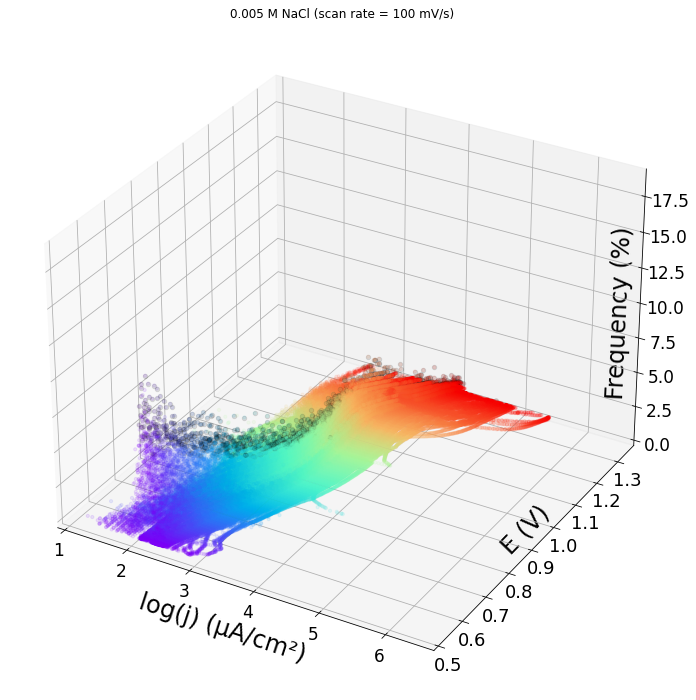

In [15]:
frequency_histogram_3D(j_0005_100,E_0005_100,"0.005 M NaCl (scan rate = 100 mV/s)")

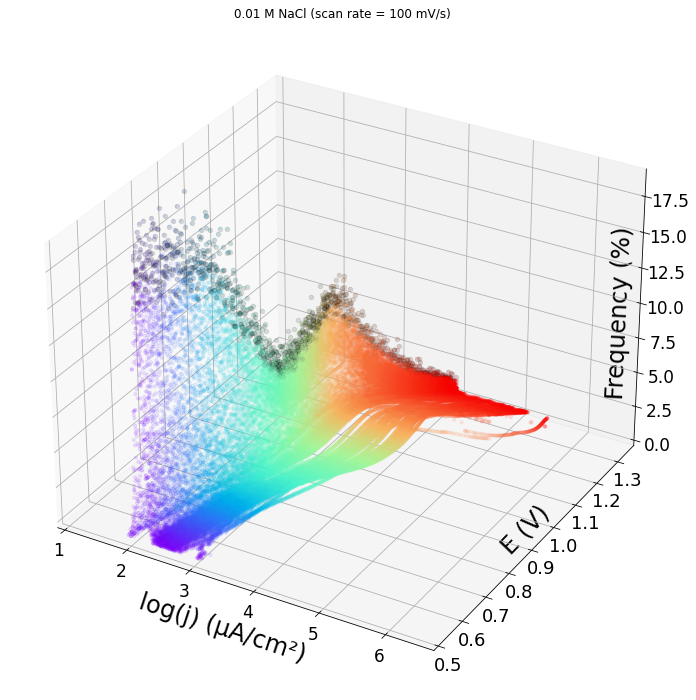

In [16]:
frequency_histogram_3D(j_001_100,E_001_100,"0.01 M NaCl (scan rate = 100 mV/s)")

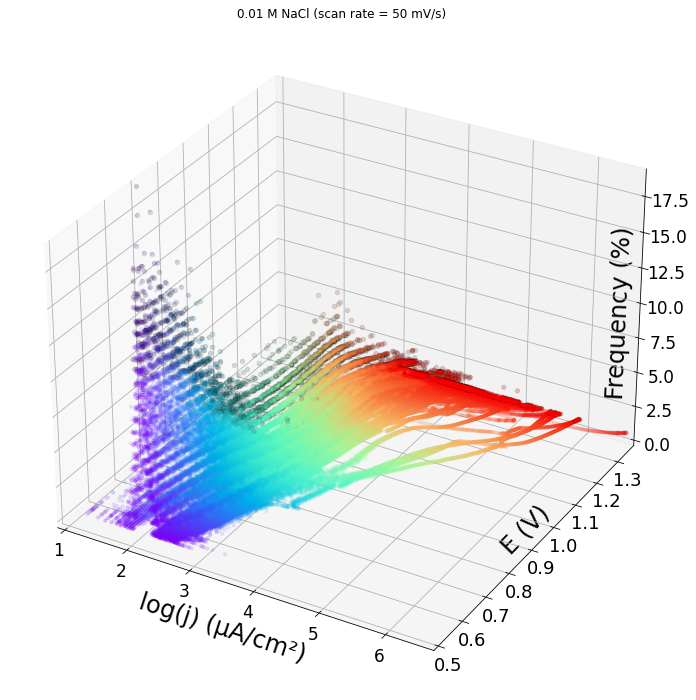

In [17]:
frequency_histogram_3D(j_001_50,E_001_50,"0.01 M NaCl (scan rate = 50 mV/s)")

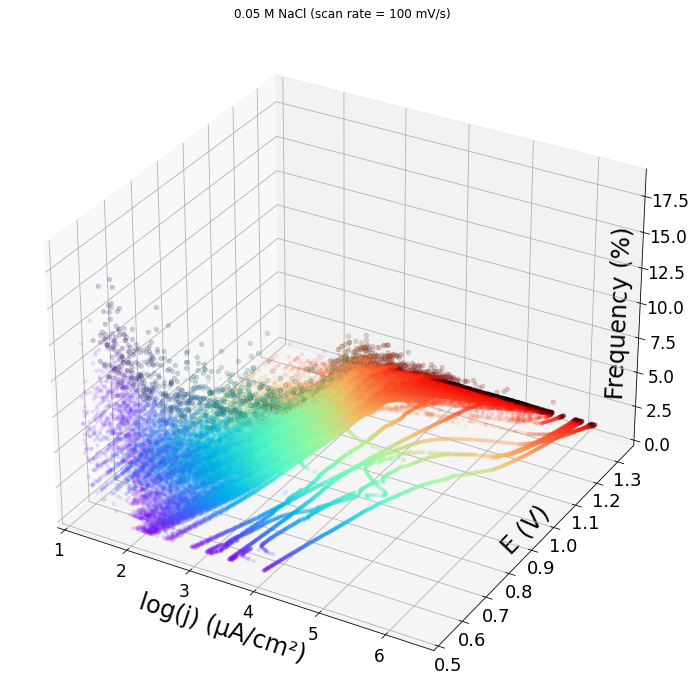

In [18]:
frequency_histogram_3D(j_005_100,E_005_100,"0.05 M NaCl (scan rate = 100 mV/s)")

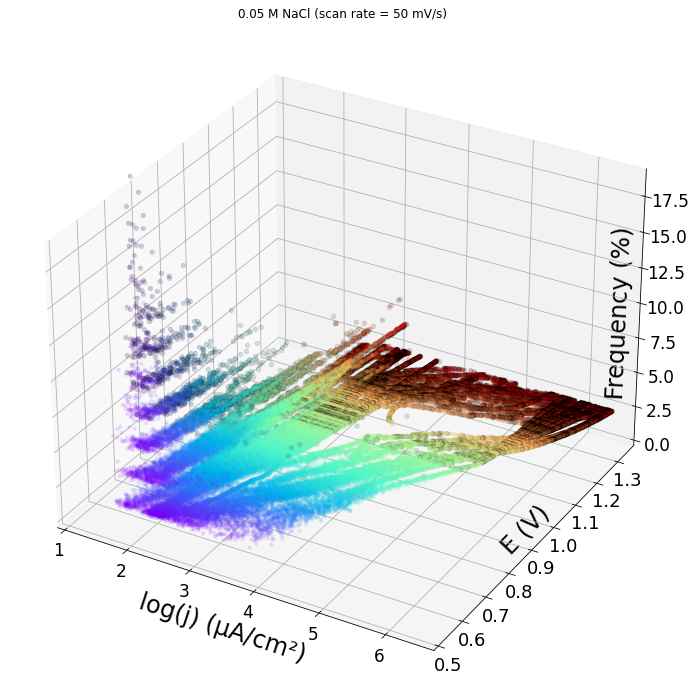

In [19]:
frequency_histogram_3D(j_005_50,E_005_50,"0.05 M NaCl (scan rate = 50 mV/s)")

## Normality testing

### checking if log(j) could be considered as normally distributed

In [20]:
# importing the Anderson-Darling test
from scipy.stats import anderson
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.anderson.html#:~:text=Anderson%2DDarling%20test%20for%20data,distribution%20is%20being%20tested%20against.

In [21]:
def normality_plot(j,E,title=None):

    fig, ax = plt.subplots(figsize=(15,7.5))

    stat=[]
    cv=[]
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN
        sel_E_tempo=E.loc[i]
        sel_j=row.iloc[idx]
        sel_E=np.repeat(sel_E_tempo,sel_j.shape)
        if sel_j.shape[0] != 0: # in case a row has only NaN values
            jsort=np.sort(np.log10(sel_j))
        
            result = anderson(jsort)
            stat.append(result.statistic)
  
            for i in range(len(result.critical_values)):
                slevel, cvalues = result.significance_level[i], result.critical_values[i]
                if i == 2: # α=0.05
                    cv.append(cvalues)
                else:
                    continue
                
    stat=np.asarray(stat)
    cv=np.asarray(cv)

    ax.scatter(E,cv,marker="_",color='r',label="critical value (α=0.05)") 
    ax.scatter(E,stat,marker="o",color='black',s=20,alpha=0.3,label="not normal")
    idx=np.where(stat < cv)
    ax.scatter(E.iloc[idx],stat[idx],marker="x",color='lime', s=80,label="normal")

    ax.set_title(title,fontsize = 20) # optional argument
    ax.set_xlabel("E (V)")
    ax.set_ylabel("test statistic")
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.set_xticks(np.arange(0.5,1.3544115,0.05))
    ax.set_xlim(0.5-0.01,1.3544115+0.01)
    ax.legend(fontsize=18)
    
    plt.savefig('normal.tif', bbox_inches='tight')

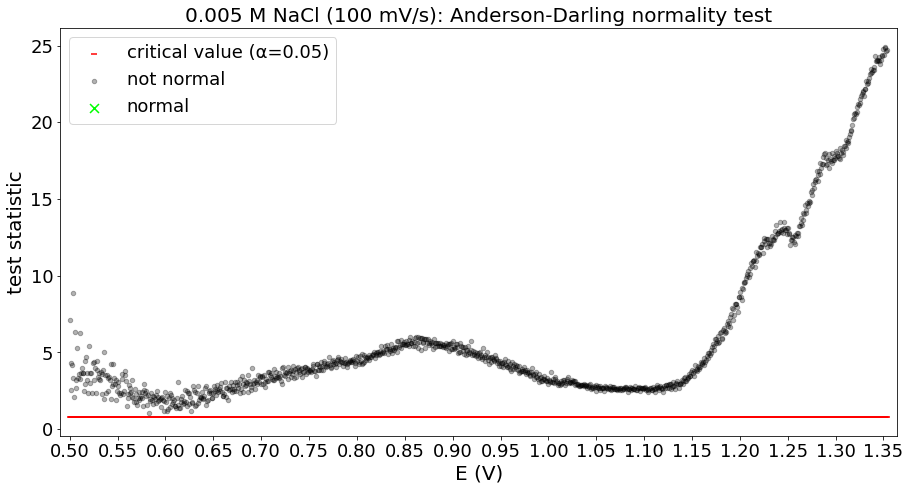

In [22]:
normality_plot(j_0005_100,E_0005_100,"0.005 M NaCl (100 mV/s): Anderson-Darling normality test")

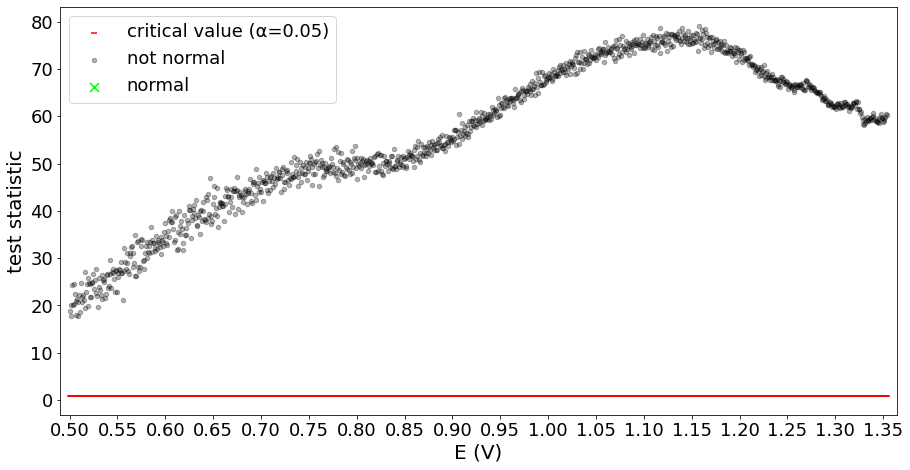

In [23]:
normality_plot(j_001_100,E_001_100)

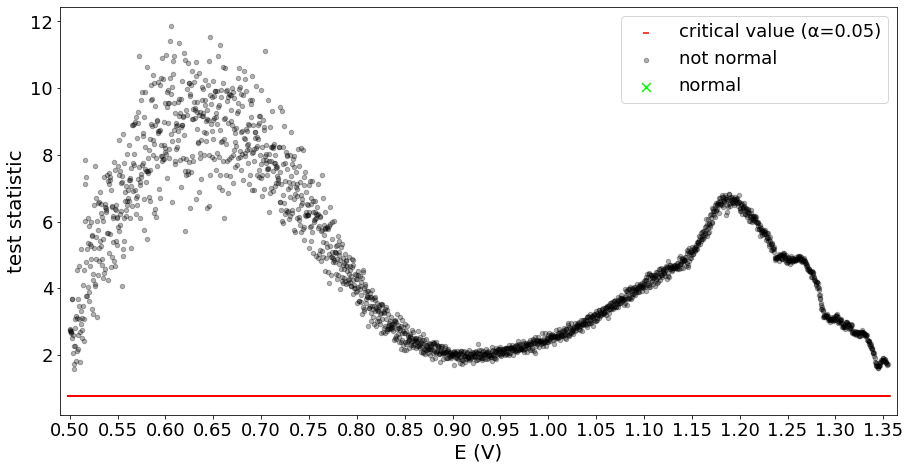

In [24]:
normality_plot(j_001_50,E_001_50)

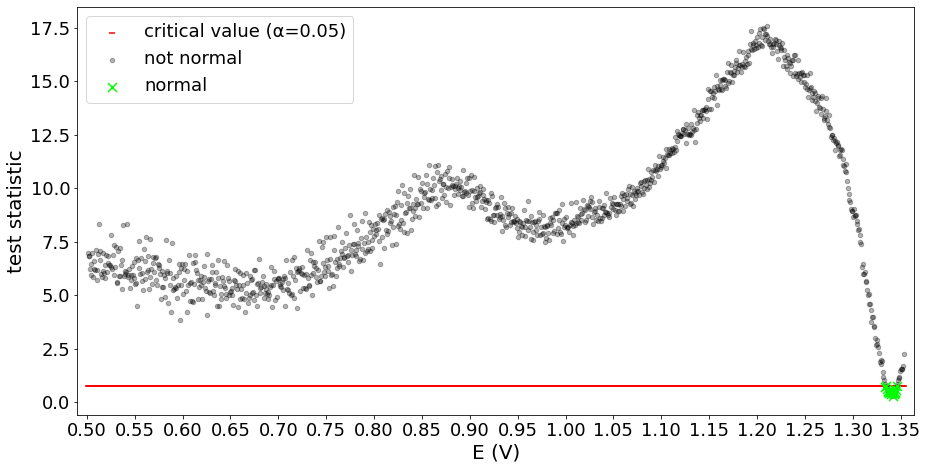

In [25]:
normality_plot(j_005_100,E_005_100)

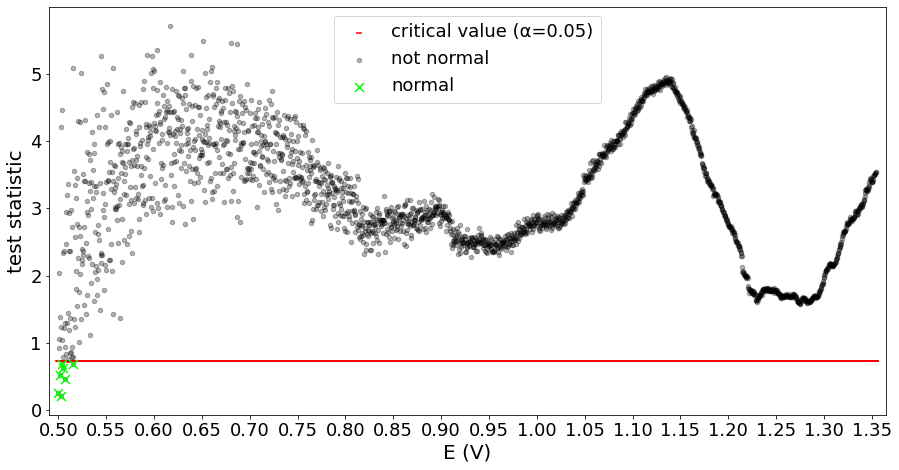

In [26]:
normality_plot(j_005_50,E_005_50)

## Fitting the log(j) distributions with theoretical functions

In [27]:
# importing the distfit package
from distfit import distfit
# https://pypi.org/project/distfit/

In [28]:
# importing the continuous distributions
from scipy.stats import (alpha,anglit,arcsine,beta,betaprime,bradford,burr,cauchy,chi,chi2,cosine,dgamma,dweibull,erlang,
expon,exponweib,exponpow,f,fatiguelife,fisk,foldcauchy,foldnorm,frechet_r,frechet_l,genlogistic,genpareto,genexpon,genextreme,
gausshyper,gamma,gengamma,genhalflogistic,gilbrat,gompertz,gumbel_r,gumbel_l,halfcauchy,halflogistic,halfnorm,hypsecant,levy,
invgamma,invgauss,invweibull,johnsonsb,johnsonsu,ksone,kstwobign,laplace,logistic,loggamma,loglaplace,lognorm,lomax,maxwell,
mielke,nakagami,ncx2,ncf,nct,norm,pareto,pearson3,powerlaw,powerlognorm,powernorm,rdist,reciprocal,rayleigh,rice,recipinvgauss,
semicircular,t,triang,truncexpon,truncnorm,tukeylambda,uniform,vonmises,vonmises_line,wald,weibull_min,weibull_max,wrapcauchy)
# https://docs.scipy.org/doc/scipy/reference/stats.html

### 1) fitting with the full set of functions

The "smooth" and "bins" parameters of distfit were individually fine tuned
- one optimised value of smoothing (20) was determined and applied to all datasets
- the optimised bin size was either static (bins=20 for the uniform distribution) or dynamic (len(unique log(j) values)/2, for all distributions)

In [29]:
def fitting_full(j,E):
    scores=[] # list with: the best function name + the fitting score (RSS)  

    for (i, row) in j.iterrows():
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN 
        sel_E_tempo=E.loc[i]
        sel_j=row.iloc[idx]
        sel_E=np.repeat(sel_E_tempo,sel_j.shape)
        if sel_j.shape[0] != 0: # in case a row has only NaN values
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)
            jsort=np.sort(np.log10(sel_j))

            if counts.max() <= 2 and sel_E[0] > 0.75: # log(j) outliers eventually induce "clearly not-uniform" distributions (specially at E<0.75V) to be fitted as uniform (limiting the max number of counts to 2 solved this issue)
                dist = distfit(distr=["uniform"],smooth=20,bins=20) # fitting to the uniform distribution   
                dist.fit_transform(jsort, verbose=1) # verbose=1: lesser results printed 
         
            else:   
                dist = distfit(distr=["alpha","anglit","arcsine","beta","betaprime","bradford","burr","cauchy","chi","chi2",
"cosine","dgamma","dweibull","erlang","expon","exponweib","exponpow","f","fatiguelife","fisk","foldcauchy","foldnorm","frechet_r"
,"frechet_l","genlogistic","genpareto","genexpon","genextreme","gausshyper","gamma","gengamma","genhalflogistic","gilbrat",
"gompertz","gumbel_r","gumbel_l","halfcauchy","halflogistic","halfnorm","hypsecant","invgamma","levy","invgauss","invweibull",
"johnsonsb","johnsonsu","ksone","kstwobign","laplace","logistic","loggamma","loglaplace","lognorm","lomax","maxwell","mielke",
"nakagami","ncx2","ncf","nct","norm","pareto","pearson3","powerlaw","powerlognorm","powernorm","rdist","reciprocal","rayleigh",
"rice","recipinvgauss","semicircular","t","triang","truncexpon","truncnorm","tukeylambda","vonmises","vonmises_line","wald",
"weibull_min","weibull_max","wrapcauchy"],smooth=20,bins=round(len(unique)/2)) # fitting with the full set of distributions (except uniform)   
                dist.fit_transform(jsort, verbose=1) # determines the best-fitting probability distributions 
            
            scores.append([dist.model['name'],dist.model['score']]) 
    return(scores)

In [30]:
scores_0005_100=fitting_full(j_0005_100,E_0005_100)

In [31]:
scores_001_100=fitting_full(j_001_100,E_001_100)

In [32]:
scores_001_50=fitting_full(j_001_50,E_001_50)

In [33]:
scores_005_100=fitting_full(j_005_100,E_005_100)

In [34]:
scores_005_50=fitting_full(j_005_50,E_005_50)

#### Plotting the outputed best fitting functions of log(j) and the corresponding RSS

In [35]:
def best_fit_function_RSS_plot(scores,E,title):
    best_function=[]
    RSS=[]
    for i in scores:
        best_function.append(i[0])
        RSS.append(i[1])

    fig, ax = plt.subplots(figsize=(15,7.5))
    ax.scatter(E,best_function,marker="|",linewidths=0.5,s=400)
    ax.set_xlabel("E (V)")
    ax.set_ylabel("Best fitting function")
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.xaxis.label.set_size(16)
    ax.yaxis.label.set_size(16)
    ax.set_title(title+": distributions of log(j)",fontsize = 16)

    ax2 = ax.twinx() # instantiate a second axes that shares the same x-axis
    ax2.scatter(E,RSS,facecolors='none', edgecolors='brown',alpha=0.2)
    ax2.set_ylabel("RSS")
    ax2.yaxis.label.set_size(16)
    ax2.tick_params(axis='both', which='major', labelsize=14)

    ax.set_xticks(np.arange(0.5,1.3544115,0.05))
    ax.set_xlim(0.5-0.01,1.3544115+0.01)
    
    return(best_function,RSS)

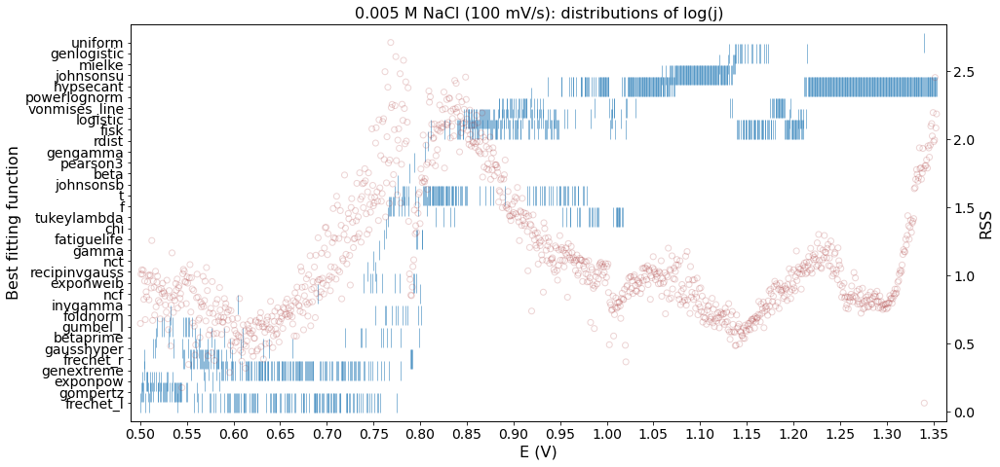

In [36]:
best_function_0005_100,RSS_0005_100=best_fit_function_RSS_plot(scores_0005_100,E_0005_100,"0.005 M NaCl (100 mV/s)")

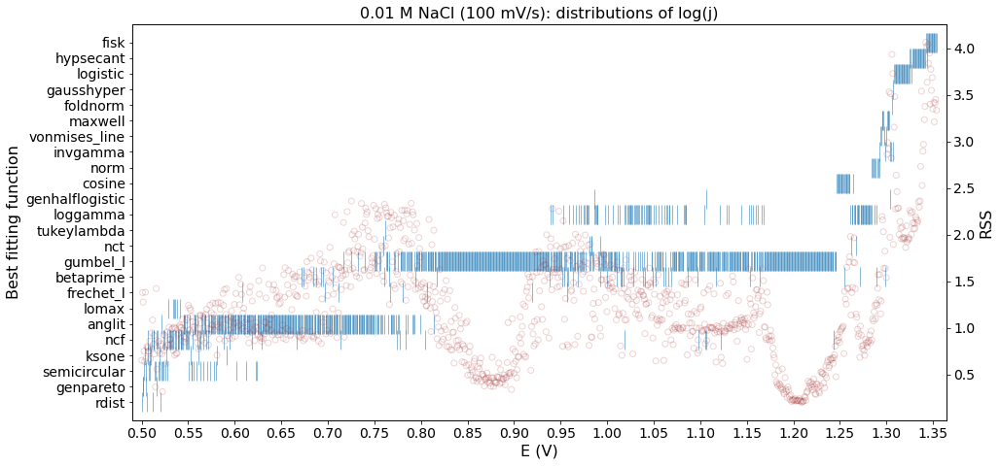

In [37]:
best_function_001_100,RSS_001_100=best_fit_function_RSS_plot(scores_001_100,E_001_100,"0.01 M NaCl (100 mV/s)")

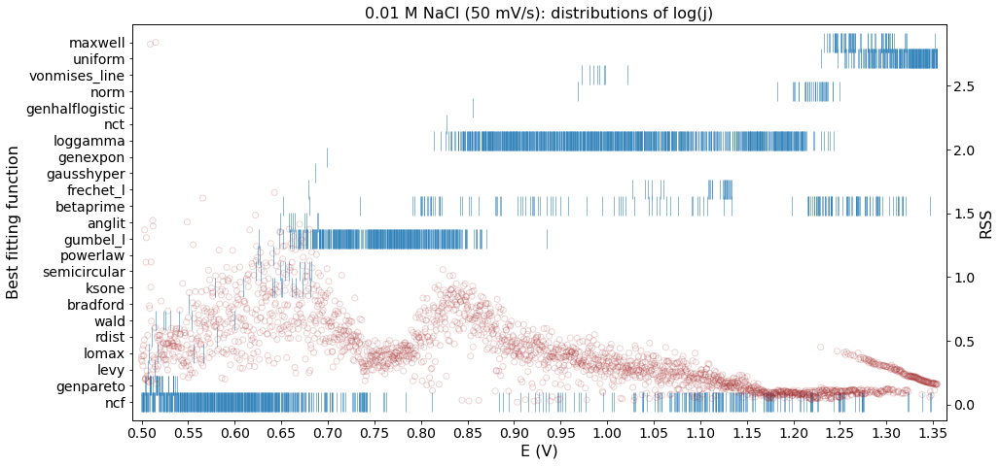

In [38]:
best_function_001_50,RSS_001_50=best_fit_function_RSS_plot(scores_001_50,E_001_50,"0.01 M NaCl (50 mV/s)")

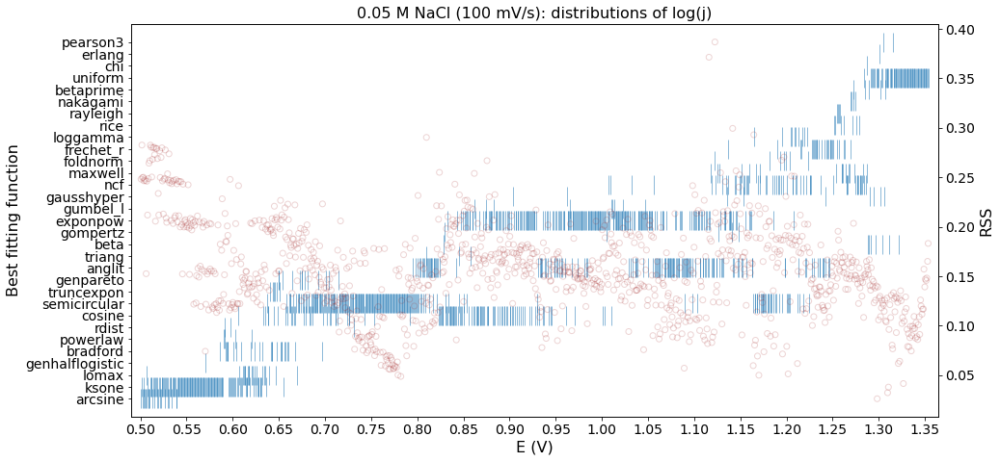

In [39]:
best_function_005_100,RSS_005_100=best_fit_function_RSS_plot(scores_005_100,E_005_100,"0.05 M NaCl (100 mV/s)")

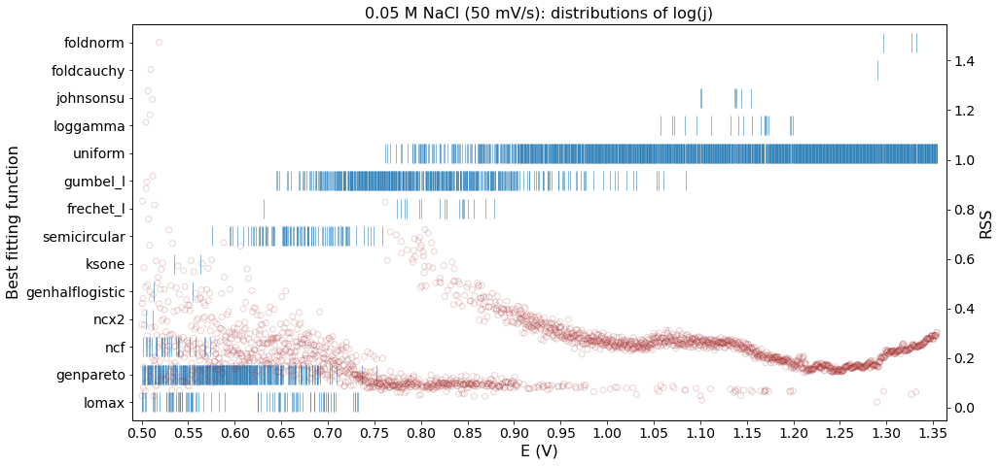

In [40]:
best_function_005_50,RSS_005_50=best_fit_function_RSS_plot(scores_005_50,E_005_50,"0.05 M NaCl (50 mV/s)")

#### Screening the outputed best fitting functions of log(j) 

Despite the resulting best fitting functions outputed by distfit, their goodness of fit should be visually checked by plotting the fitting curve with the experimental distribution.
This was an additional (and final) criterium for selecting the "final" best fitting functions.

##### Plotting the histograms of log(j) fitted by the different functions at increasing potentials 

In [41]:
# creating lists with: the first E where a particular function was outputed + the function name
def E_function_lists(E,functions_list):
    lE=[]
    lf=[]
    for (E,bf) in zip(E.values,functions_list):
        if bf in list(np.unique(functions_list)):
            if bf not in lf: # first occurrence of each function
                print("E="+str(np.around(E[0],4))+" V, "+bf)
                lE.append(E[0])
                lf.append(bf)
                continue
    return(lE,lf)

In [42]:
lE_0005_100,lf_0005_100=E_function_lists(E_0005_100,best_function_0005_100)

E=0.5002 V, frechet_l
E=0.5008 V, gompertz
E=0.5023 V, exponpow
E=0.5039 V, genextreme
E=0.5048 V, frechet_r
E=0.5133 V, gausshyper
E=0.517 V, betaprime
E=0.5179 V, gumbel_l
E=0.5325 V, foldnorm
E=0.6043 V, invgamma
E=0.6906 V, ncf
E=0.7398 V, exponweib
E=0.7437 V, recipinvgauss
E=0.7498 V, nct
E=0.7559 V, gamma
E=0.7608 V, fatiguelife
E=0.7639 V, chi
E=0.7654 V, tukeylambda
E=0.766 V, f
E=0.773 V, t
E=0.7755 V, johnsonsb
E=0.7886 V, beta
E=0.7938 V, pearson3
E=0.8048 V, gengamma
E=0.8084 V, rdist
E=0.8115 V, fisk
E=0.8472 V, logistic
E=0.8841 V, vonmises_line
E=0.9195 V, powerlognorm
E=0.9372 V, hypsecant
E=1.059 V, johnsonsu
E=1.1206 V, mielke
E=1.1316 V, genlogistic
E=1.3404 V, uniform


In [43]:
lE_001_100,lf_001_100=E_function_lists(E_001_100,best_function_001_100)

E=0.5002 V, rdist
E=0.5011 V, genpareto
E=0.5026 V, semicircular
E=0.5033 V, ksone
E=0.5063 V, ncf
E=0.5219 V, anglit
E=0.5289 V, lomax
E=0.6082 V, frechet_l
E=0.6723 V, betaprime
E=0.7169 V, gumbel_l
E=0.7593 V, nct
E=0.7617 V, tukeylambda
E=0.9391 V, loggamma
E=0.9867 V, genhalflogistic
E=1.2467 V, cosine
E=1.2836 V, norm
E=1.2922 V, invgamma
E=1.2937 V, vonmises_line
E=1.2952 V, maxwell
E=1.3059 V, foldnorm
E=1.3068 V, gausshyper
E=1.3083 V, logistic
E=1.3251 V, hypsecant
E=1.3422 V, fisk


In [44]:
lE_001_50,lf_001_50=E_function_lists(E_001_50,best_function_001_50)

E=0.4999 V, ncf
E=0.5033 V, genpareto
E=0.5066 V, levy
E=0.5075 V, lomax
E=0.5106 V, rdist
E=0.5148 V, wald
E=0.5502 V, bradford
E=0.5792 V, ksone
E=0.6223 V, semicircular
E=0.6244 V, powerlaw
E=0.6256 V, gumbel_l
E=0.6491 V, anglit
E=0.6516 V, betaprime
E=0.679 V, frechet_l
E=0.6861 V, gausshyper
E=0.6989 V, genexpon
E=0.8136 V, loggamma
E=0.8274 V, nct
E=0.856 V, genhalflogistic
E=0.969 V, norm
E=0.9729 V, vonmises_line
E=1.2293 V, uniform
E=1.2329 V, maxwell


In [45]:
lE_005_100,lf_005_100=E_function_lists(E_005_100,best_function_005_100)

E=0.5008 V, arcsine
E=0.5017 V, ksone
E=0.5063 V, lomax
E=0.5704 V, genhalflogistic
E=0.5866 V, bradford
E=0.5902 V, powerlaw
E=0.5918 V, rdist
E=0.6064 V, cosine
E=0.6372 V, semicircular
E=0.6406 V, truncexpon
E=0.6497 V, genpareto
E=0.7953 V, anglit
E=0.81 V, triang
E=0.8286 V, beta
E=0.8292 V, gompertz
E=0.8325 V, exponpow
E=0.8618 V, gumbel_l
E=0.9033 V, gausshyper
E=1.0074 V, ncf
E=1.1176 V, maxwell
E=1.1225 V, foldnorm
E=1.1362 V, frechet_r
E=1.1646 V, loggamma
E=1.2519 V, rice
E=1.2543 V, rayleigh
E=1.269 V, nakagami
E=1.2726 V, betaprime
E=1.2836 V, uniform
E=1.2867 V, chi
E=1.3004 V, erlang
E=1.305 V, pearson3


In [46]:
lE_005_50,lf_005_50=E_function_lists(E_005_50,best_function_005_50)

E=0.5002 V, lomax
E=0.5008 V, genpareto
E=0.5017 V, ncf
E=0.5051 V, ncx2
E=0.5127 V, genhalflogistic
E=0.5347 V, ksone
E=0.5759 V, semicircular
E=0.6314 V, frechet_l
E=0.6446 V, gumbel_l
E=0.7617 V, uniform
E=1.0575 V, loggamma
E=1.1002 V, johnsonsu
E=1.29 V, foldcauchy
E=1.297 V, foldnorm


In [47]:
def hist_fit_curve_plot(j,E,lE):
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN 
        sel_E_tempo=E.loc[i]
        if sel_E_tempo[0] in lE:
            sel_j=row.iloc[idx]
            sel_E=np.repeat(sel_E_tempo,sel_j.shape)
            if sel_j.shape[0] != 0:  # in case a row has only NaN values
                fig, ax = plt.subplots()
            
                unique, counts = np.unique(np.log10(sel_j), return_counts=True) 
                jsort=np.sort(np.log10(sel_j))
                x=np.linspace(jsort[0],jsort[-1],len(unique)) # len(unique) match "bins" in distr
            
                bin_edges = np.histogram_bin_edges(unique, bins=len(unique))
                ax.bar(unique, 100*counts/counts.sum(),width=np.diff(bin_edges),label="experimental",color="C0", alpha=0.5)

                if counts.max() <= 2 and sel_E[0] > 0.75: 
                    dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                    dist.fit_transform(jsort, verbose=1) 
                    
                else:
                    dist = distfit(distr=["alpha","anglit","arcsine","beta","betaprime","bradford","burr","cauchy","chi","chi2",
"cosine","dgamma","dweibull","erlang","expon","exponweib","exponpow","f","fatiguelife","fisk","foldcauchy","foldnorm","frechet_r"
,"frechet_l","genlogistic","genpareto","genexpon","genextreme","gausshyper","gamma","gengamma","genhalflogistic","gilbrat",
"gompertz","gumbel_r","gumbel_l","halfcauchy","halflogistic","halfnorm","hypsecant","invgamma","levy","invgauss","invweibull",
"johnsonsb","johnsonsu","ksone","kstwobign","laplace","logistic","loggamma","loglaplace","lognorm","lomax","maxwell","mielke",
"nakagami","ncx2","ncf","nct","norm","pareto","pearson3","powerlaw","powerlognorm","powernorm","rdist","reciprocal","rayleigh",
"rice","recipinvgauss","semicircular","t","triang","truncexpon","truncnorm","tukeylambda","vonmises","vonmises_line","wald",
"weibull_min","weibull_max","wrapcauchy"],smooth=20,bins=round(len(unique)/2)) #['norm','t']
                    dist.fit_transform(jsort, verbose=1) 
                    
                parameters=[]
                for p in dist.model['params']:
                    parameters.append(p)
                
                print("E="+str(np.around(sel_E[0],4))+" V, "+dist.model['name']+", RSS="+str(np.around(dist.model['score'],2)))
       
                if dist.model["name"]=="t":
                    tmodel=t.pdf(x, *parameters)
                    ax.plot(x,100*tmodel/tmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  # best fit model is given in cumulative fashion 
                elif dist.model["name"]=="genextreme":
                    genextrememodel=genextreme.pdf(x, *parameters)
                    ax.plot(x,100*genextrememodel/genextrememodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))
                elif dist.model["name"]=="wald":
                    waldmodel=wald.pdf(x, *parameters)
                    ax.plot(x,100*waldmodel/waldmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2))) 
                elif dist.model["name"]=="norm":
                    normmodel=norm.pdf(x, *parameters)
                    ax.plot(x, 100* normmodel/normmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  # best fit model is given in cumulative fashion
                elif dist.model["name"]=="beta":
                    betamodel=beta.pdf(x, *parameters)
                    ax.plot(x, 100* betamodel/betamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  # best             
                elif dist.model["name"]=="lognorm":
                    lognormmodel=lognorm.pdf(x, *parameters)
                    ax.plot(x, 100* lognormmodel/lognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="fisk":                    
                    fiskmodel=fisk.pdf(x, *parameters)
                    ax.plot(x, 100* fiskmodel/fiskmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="hypsecant":
                    hypsecantmodel= hypsecant.pdf(x, *parameters)
                    ax.plot(x, 100* hypsecantmodel/ hypsecantmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="logistic":
                    logisticmodel=logistic.pdf(x, *parameters)
                    ax.plot(x, 100* logisticmodel/logisticmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="foldnorm":
                    foldnormmodel=foldnorm.pdf(x, *parameters)
                    ax.plot(x, 100* foldnormmodel/foldnormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="halfnorm":
                    halfnormmodel=halfnorm.pdf(x, *parameters)
                    ax.plot(x, 100* halfnormmodel/halfnormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="betaprime":
                    betaprimemodel=betaprime.pdf(x, *parameters)
                    ax.plot(x, 100* betaprimemodel/betaprimemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="maxwell":
                    maxwellmodel=maxwell.pdf(x, *parameters)
                    ax.plot(x, 100* maxwellmodel/maxwellmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="genhalflogistic":
                    genhalflogisticmodel=genhalflogistic.pdf(x, *parameters)
                    ax.plot(x, 100* genhalflogisticmodel/genhalflogisticmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="loggamma":
                    loggammamodel=loggamma.pdf(x, *parameters)
                    ax.plot(x, 100* loggammamodel/loggammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="weibull_max":
                    weibull_maxmodel=weibull_max.pdf(x, *parameters)
                    ax.plot(x, 100* weibull_maxmodel/weibull_maxmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="gumbel_l":
                    gumbel_lmodel=gumbel_l.pdf(x, *parameters)
                    ax.plot(x, 100* gumbel_lmodel/gumbel_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))      
                elif dist.model["name"]=="genpareto":
                    genparetomodel=genpareto.pdf(x, *parameters)
                    ax.plot(x, 100* genparetomodel/genparetomodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))        
                elif dist.model["name"]=="bradford":
                    bradfordmodel=bradford.pdf(x, *parameters)
                    ax.plot(x, 100* bradfordmodel/bradfordmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="pareto":
                    paretomodel=pareto.pdf(x, *parameters)
                    ax.plot(x, 100* paretomodel/paretomodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))         
                elif dist.model["name"]=="anglit":
                    anglitmodel=anglit.pdf(x, *parameters)
                    ax.plot(x, 100* anglitmodel/anglitmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="powerlaw":
                    powerlawmodel=powerlaw.pdf(x, *parameters)
                    ax.plot(x, 100* powerlawmodel/powerlawmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="semicircular":
                    semicircularmodel=semicircular.pdf(x, *parameters)
                    ax.plot(x, 100* semicircularmodel/semicircularmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="rdist":
                    rdistmodel=rdist.pdf(x, *parameters)
                    ax.plot(x, 100* rdistmodel/rdistmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="rayleigh":
                    rayleighmodel=rayleigh.pdf(x, *parameters)
                    ax.plot(x, 100* rayleighmodel/rayleighmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="triang":                    
                    triangmodel=triang.pdf(x, *parameters)
                    ax.plot(x, 100* triangmodel/triangmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="gausshyper":
                    gausshypermodel=gausshyper.pdf(x, *parameters)
                    ax.plot(x, 100* gausshypermodel/gausshypermodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="cosine":
                    cosinemodel=cosine.pdf(x, *parameters)
                    ax.plot(x, 100* cosinemodel/cosinemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="burr":
                    burrmodel=burr .pdf(x, *parameters)
                    ax.plot(x, 100* burrmodel/burrmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="gengamma":
                    gengammamodel=gengamma.pdf(x, *parameters)
                    ax.plot(x, 100* gengammamodel/gengammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="exponweib":
                    exponweibmodel=exponweib.pdf(x, *parameters)
                    ax.plot(x, 100* exponweibmodel/exponweibmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="vonmises_line":
                    vonmises_linemodel=vonmises_line.pdf(x, *parameters)
                    ax.plot(x, 100* vonmises_linemodel/vonmises_linemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="powernorm":
                    powernormmodel=powernorm.pdf(x, *parameters)
                    ax.plot(x, 100* powernormmodel/powernormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="pearson3":
                    pearson3model=pearson3.pdf(x, *parameters)
                    ax.plot(x, 100* pearson3model/pearson3model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))         
                elif dist.model["name"]=="fatiguelife":
                    fatiguelifemodel=fatiguelife.pdf(x, *parameters)
                    ax.plot(x, 100* fatiguelifemodel/fatiguelifemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="johnsonsb":
                    johnsonsbmodel=johnsonsb.pdf(x, *parameters)
                    ax.plot(x, 100* johnsonsbmodel/johnsonsbmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="erlang":
                    erlangmodel=erlang.pdf(x, *parameters)
                    ax.plot(x, 100* erlangmodel/erlangmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="exponpow":
                    exponpowmodel=exponpow.pdf(x, *parameters)
                    ax.plot(x, 100* exponpowmodel/exponpowmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="mielke":
                    mielkemodel=mielke.pdf(x, *parameters)
                    ax.plot(x, 100* mielkemodel/mielkemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="gompertz":
                    gompertzmodel=gompertz.pdf(x, *parameters)
                    ax.plot(x, 100* gompertzmodel/gompertzmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                                                                         
                elif dist.model["name"]=="recipinvgauss":
                    recipinvgaussmodel=recipinvgauss.pdf(x, *parameters)
                    ax.plot(x, 100* recipinvgaussmodel/recipinvgaussmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="chi":
                    chimodel=chi.pdf(x, *parameters)
                    ax.plot(x, 100* chimodel/chimodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                      
                elif dist.model["name"]=="f":
                    fmodel=f.pdf(x, *parameters)
                    ax.plot(x, 100* fmodel/fmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))          
                elif dist.model["name"]=="tukeylambda":
                    tukeylambdamodel=tukeylambda.pdf(x, *parameters)
                    ax.plot(x, 100* tukeylambdamodel/tukeylambdamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="rice":
                    ricemodel=rice.pdf(x, *parameters)
                    ax.plot(x, 100* ricemodel/ricemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))       
                elif dist.model["name"]=="powerlognorm":
                    powerlognormmodel=powerlognorm.pdf(x, *parameters)
                    ax.plot(x, 100* powerlognormmodel/powerlognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="johnsonsu":
                    johnsonsumodel=johnsonsu.pdf(x, *parameters)
                    ax.plot(x, 100* johnsonsumodel/johnsonsumodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="gennorm":
                    gennormmodel=gennorm.pdf(x, *parameters)
                    ax.plot(x, 100* gennormmodel/gennormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="gamma":
                    gammamodel=gamma.pdf(x, *parameters)
                    ax.plot(x, 100* gammamodel/gammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))    
                elif dist.model["name"]=="nakagami":
                    nakagamimodel=nakagami.pdf(x, *parameters)
                    ax.plot(x, 100* nakagamimodel/nakagamimodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))           
                elif dist.model["name"]=="truncnorm":
                    truncnormmodel=truncnorm.pdf(x, *parameters)
                    ax.plot(x, 100* truncnormmodel/truncnormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="truncexpon":
                    truncexponmodel=truncexpon.pdf(x, *parameters)
                    ax.plot(x, 100* truncexponmodel/truncexponmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="arcsine":
                    arcsinemodel=arcsine.pdf(x, *parameters)
                    ax.plot(x, 100* arcsinemodel/arcsinemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="weibull_min":
                    weibull_minmodel=weibull_min.pdf(x, *parameters)
                    ax.plot(x, 100* weibull_minmodel/weibull_minmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="invweibull":
                    invweibullmodel=invweibull.pdf(x, *parameters)
                    ax.plot(x, 100* invweibullmodel/invweibullmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))     
                elif dist.model["name"]=="levy":
                    levymodel=levy.pdf(x, *parameters)
                    ax.plot(x, 100* levymodel/levymodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                 
                elif dist.model["name"]=="loglaplace":
                    loglaplacemodel=loglaplace.pdf(x, *parameters)
                    ax.plot(x, 100* loglaplacemodel/loglaplacemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="chi2":
                    chi2model=chi2.pdf(x, *parameters)
                    ax.plot(x, 100* chi2model/chi2model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="genexpon":
                    genexponmodel=genexpon.pdf(x, *parameters)
                    ax.plot(x, 100*genexponmodel/genexponmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="foldcauchy":
                    foldcauchymodel=foldcauchy.pdf(x, *parameters)
                    ax.plot(x, 100*foldcauchymodel/foldcauchymodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="genlogistic":
                    genlogisticmodel=genlogistic.pdf(x, *parameters)
                    ax.plot(x, 100*genlogisticmodel/genlogisticmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="lomax":
                    lomaxmodel=lomax.pdf(x, *parameters)
                    ax.plot(x, 100* lomaxmodel/lomaxmodel.sum(),"red",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="invgamma":
                    invgammamodel=invgamma.pdf(x, *parameters)
                    ax.plot(x, 100*invgammamodel/invgammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="ncf":
                    ncfmodel=ncf.pdf(x, *parameters)
                    ax.plot(x, 100*ncfmodel/ncfmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="nct":
                    nctmodel=nct.pdf(x, *parameters)
                    ax.plot(x, 100*nctmodel/nctmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="frechet_l":
                    frechet_lmodel=frechet_l.pdf(x, *parameters)
                    ax.plot(x, 100*frechet_lmodel/frechet_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="frechet_r":
                    frechet_rmodel=frechet_r.pdf(x, *parameters)
                    ax.plot(x, 100*frechet_rmodel/frechet_rmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="ncx2":
                    ncx2model=ncx2.pdf(x, *parameters)
                    ax.plot(x, 100*ncx2model/ncx2model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="ksone":
                    ksonemodel=ksone.pdf(x, *parameters)
                    ax.plot(x, 100*ksonemodel/ksonemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                                                                                                                
                elif dist.model["name"]=="uniform":
                    uniformmodel=uniform.pdf(x, *parameters)
                    ax.plot(x, 100* uniformmodel/uniformmodel.sum(),"red",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                else:
                    continue
                
                ax.set_title("E = "+str(np.around(sel_E[0],4))+" V")
                ax.set_xlabel("log(j) (µA/cm²)")
                ax.set_ylabel("frequency (%)")
                ax.legend()

E=0.5002 V, frechet_l, RSS=0.65
E=0.5008 V, gompertz, RSS=1.01
E=0.5023 V, exponpow, RSS=1.01
E=0.5039 V, genextreme, RSS=0.83
E=0.5048 V, frechet_r, RSS=0.96
E=0.5133 V, gausshyper, RSS=0.67
E=0.517 V, betaprime, RSS=0.77
E=0.5179 V, gumbel_l, RSS=0.95
E=0.5325 V, foldnorm, RSS=0.48
E=0.6043 V, invgamma, RSS=0.69
E=0.6906 V, ncf, RSS=1.28
E=0.7398 V, exponweib, RSS=1.68
E=0.7437 V, recipinvgauss, RSS=1.62
E=0.7498 V, nct, RSS=1.51
E=0.7559 V, gamma, RSS=2.14
E=0.7608 V, fatiguelife, RSS=2.15
E=0.7639 V, chi, RSS=1.68
E=0.7654 V, tukeylambda, RSS=2.38
E=0.766 V, f, RSS=1.83
E=0.773 V, t, RSS=2.25
E=0.7755 V, johnsonsb, RSS=1.59
E=0.7886 V, beta, RSS=1.01
E=0.7938 V, pearson3, RSS=1.48
E=0.8048 V, gengamma, RSS=1.69
E=0.8084 V, rdist, RSS=1.83
E=0.8115 V, fisk, RSS=2.03
E=0.8472 V, logistic, RSS=2.22
E=0.8841 V, vonmises_line, RSS=1.54
E=0.9195 V, powerlognorm, RSS=0.74
E=0.9372 V, hypsecant, RSS=1.28
E=1.059 V, johnsonsu, RSS=0.85
E=1.1206 V, mielke, RSS=0.62
E=1.1316 V, genlogistic, R

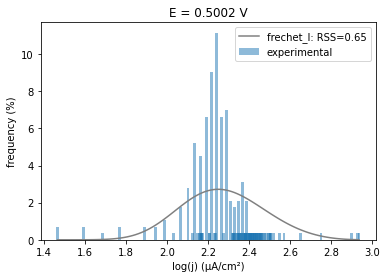

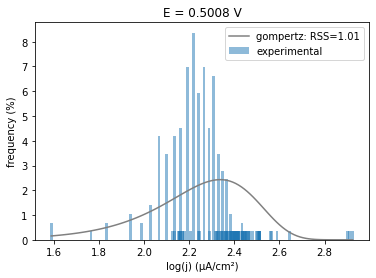

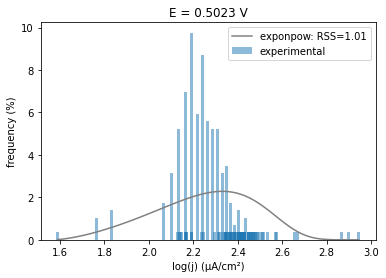

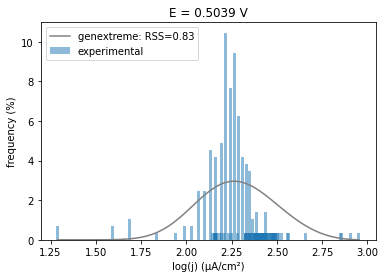

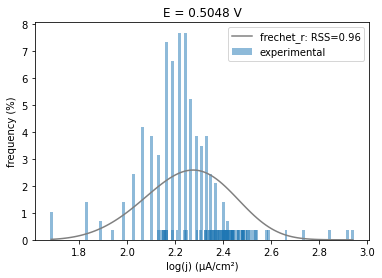

...

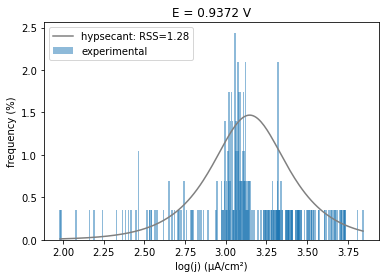

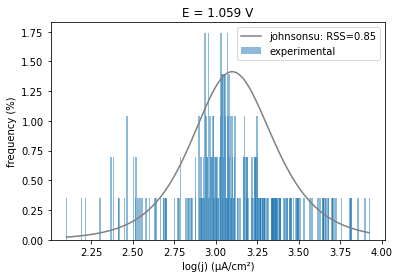

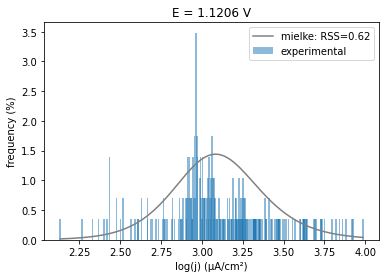

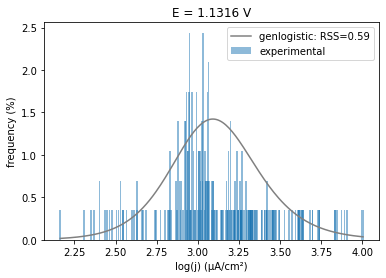

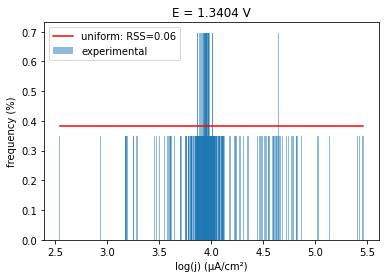

In [48]:
hist_fit_curve_plot(j_0005_100,E_0005_100,lE_0005_100)

E=0.5002 V, rdist, RSS=0.65
E=0.5011 V, genpareto, RSS=1.38
E=0.5026 V, semicircular, RSS=0.75
E=0.5033 V, ksone, RSS=0.64
E=0.5063 V, ncf, RSS=0.79
E=0.5219 V, anglit, RSS=0.72
E=0.5289 V, lomax, RSS=0.81
E=0.6082 V, frechet_l, RSS=0.99
E=0.6723 V, betaprime, RSS=0.93
E=0.7169 V, gumbel_l, RSS=2.13
E=0.7593 V, nct, RSS=1.56
E=0.7617 V, tukeylambda, RSS=1.88
E=0.9391 V, loggamma, RSS=1.87
E=0.9867 V, genhalflogistic, RSS=1.09
E=1.2467 V, cosine, RSS=0.86
E=1.2836 V, norm, RSS=0.96
E=1.2922 V, invgamma, RSS=1.3
E=1.2937 V, vonmises_line, RSS=1.15
E=1.2952 V, maxwell, RSS=2.19
E=1.3059 V, foldnorm, RSS=3.93
E=1.3068 V, gausshyper, RSS=3.73
E=1.3083 V, logistic, RSS=3.15
E=1.3251 V, hypsecant, RSS=2.26
E=1.3422 V, fisk, RSS=4.06


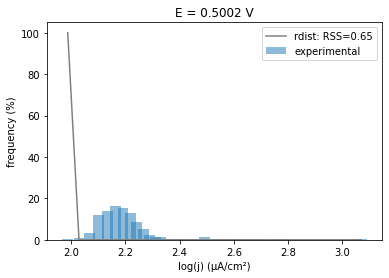

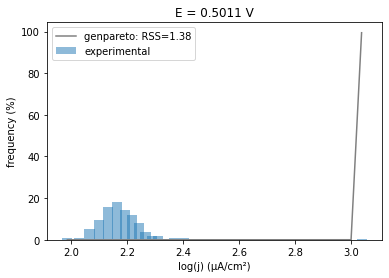

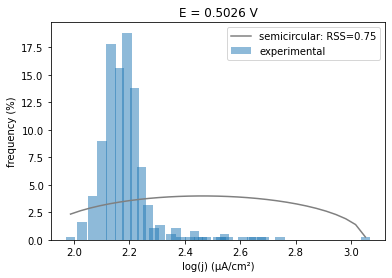

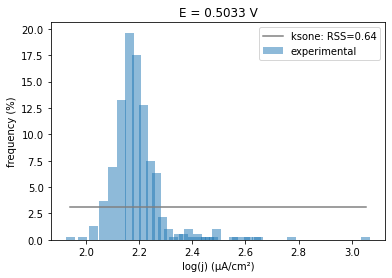

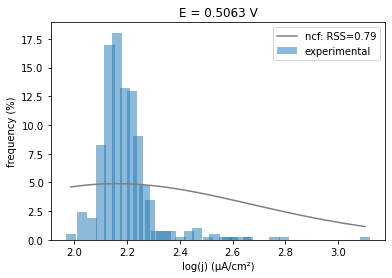

...

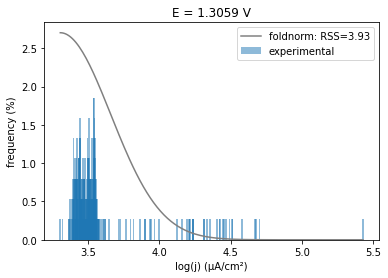

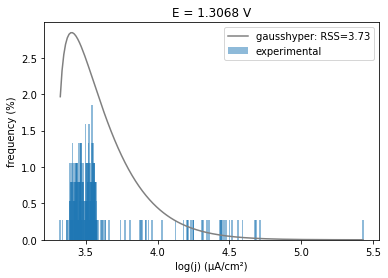

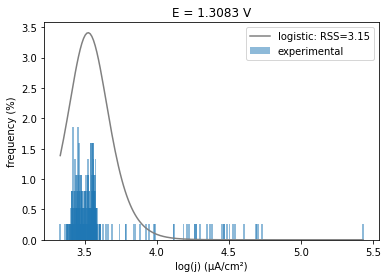

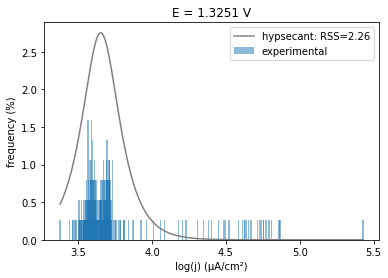

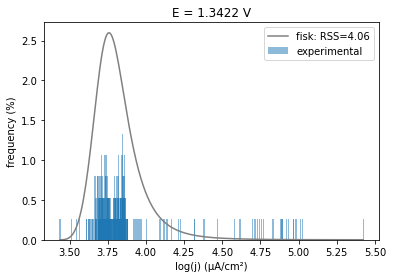

In [49]:
hist_fit_curve_plot(j_001_100,E_001_100,lE_001_100)

E=0.4999 V, ncf, RSS=0.35
E=0.5033 V, genpareto, RSS=1.37
E=0.5066 V, levy, RSS=0.54
E=0.5075 V, lomax, RSS=0.44
E=0.5106 V, rdist, RSS=0.65
E=0.5148 V, wald, RSS=0.6
E=0.5502 V, bradford, RSS=0.21
E=0.5792 V, ksone, RSS=0.75
E=0.6223 V, semicircular, RSS=1.49
E=0.6244 V, powerlaw, RSS=1.15
E=0.6256 V, gumbel_l, RSS=0.96
E=0.6491 V, anglit, RSS=1.36
E=0.6516 V, betaprime, RSS=1.14
E=0.679 V, frechet_l, RSS=0.85
E=0.6861 V, gausshyper, RSS=0.65
E=0.6989 V, genexpon, RSS=0.67
E=0.8136 V, loggamma, RSS=0.76
E=0.8274 V, nct, RSS=0.22
E=0.856 V, genhalflogistic, RSS=0.45
E=0.969 V, norm, RSS=0.42
E=0.9729 V, vonmises_line, RSS=0.31
E=1.2293 V, uniform, RSS=0.45
E=1.2329 V, maxwell, RSS=0.12


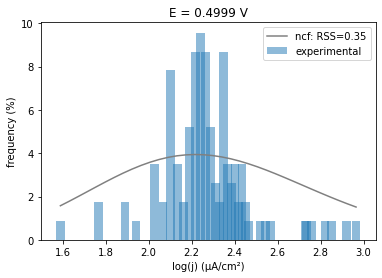

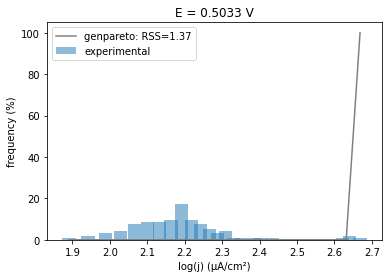

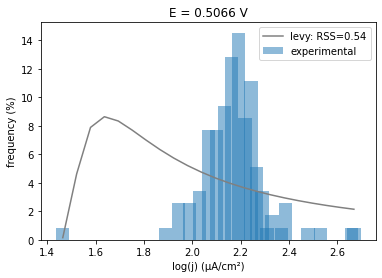

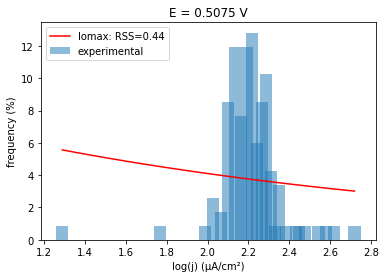

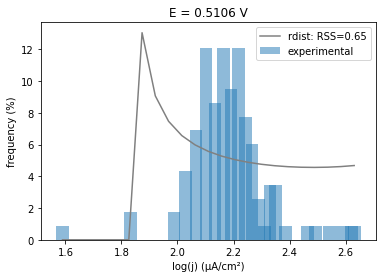

...

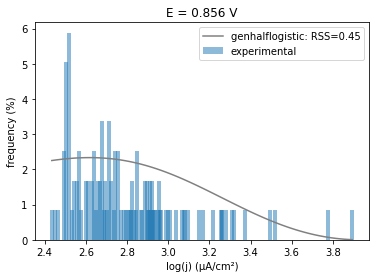

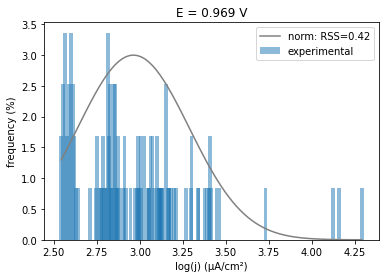

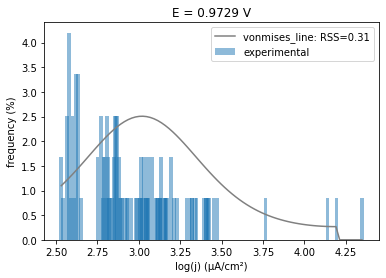

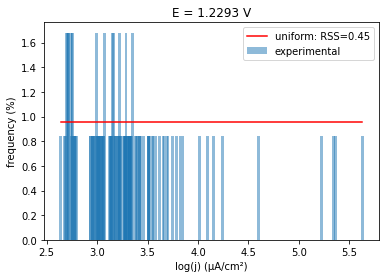

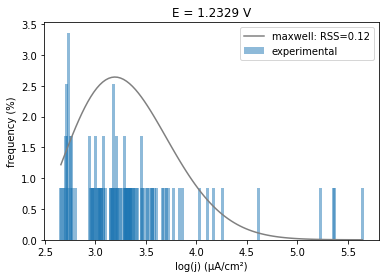

In [50]:
hist_fit_curve_plot(j_001_50,E_001_50,lE_001_50)

E=0.5008 V, arcsine, RSS=0.25
E=0.5017 V, ksone, RSS=0.28
E=0.5063 V, lomax, RSS=0.15
E=0.5704 V, genhalflogistic, RSS=0.07
E=0.5866 V, bradford, RSS=0.18
E=0.5902 V, powerlaw, RSS=0.13
E=0.5918 V, rdist, RSS=0.21
E=0.6064 V, cosine, RSS=0.24
E=0.6372 V, semicircular, RSS=0.2
E=0.6406 V, truncexpon, RSS=0.2
E=0.6497 V, genpareto, RSS=0.16
E=0.7953 V, anglit, RSS=0.11
E=0.81 V, triang, RSS=0.29
E=0.8286 V, beta, RSS=0.15
E=0.8292 V, gompertz, RSS=0.16
E=0.8325 V, exponpow, RSS=0.18
E=0.8618 V, gumbel_l, RSS=0.25
E=0.9033 V, gausshyper, RSS=0.12
E=1.0074 V, ncf, RSS=0.17
E=1.1176 V, maxwell, RSS=0.21
E=1.1225 V, foldnorm, RSS=0.39
E=1.1362 V, frechet_r, RSS=0.22
E=1.1646 V, loggamma, RSS=0.29
E=1.2519 V, rice, RSS=0.16
E=1.2543 V, rayleigh, RSS=0.16
E=1.269 V, nakagami, RSS=0.17
E=1.2726 V, betaprime, RSS=0.2
E=1.2836 V, uniform, RSS=0.11
E=1.2867 V, chi, RSS=0.16
E=1.3004 V, erlang, RSS=0.13
E=1.305 V, pearson3, RSS=0.12


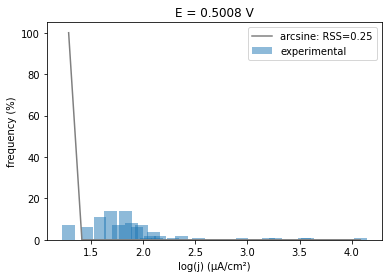

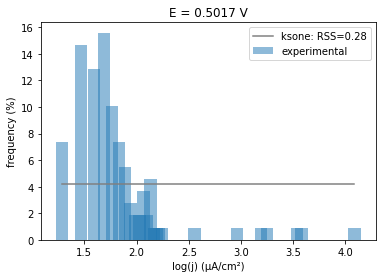

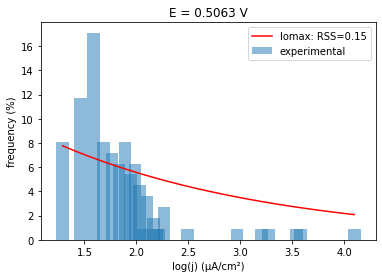

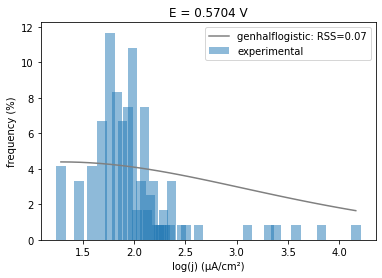

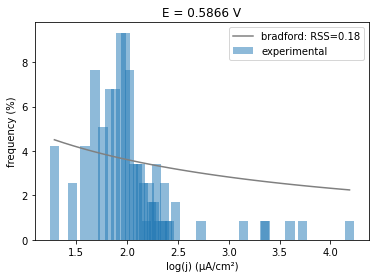

...

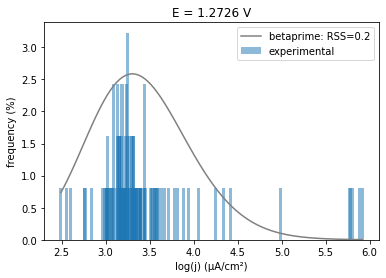

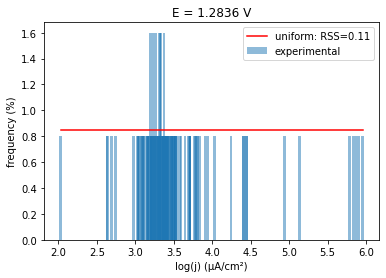

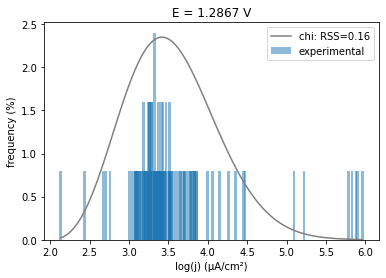

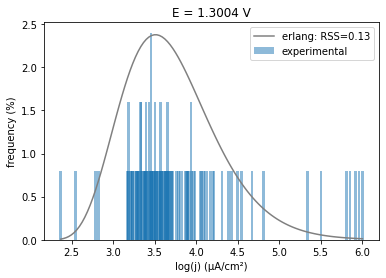

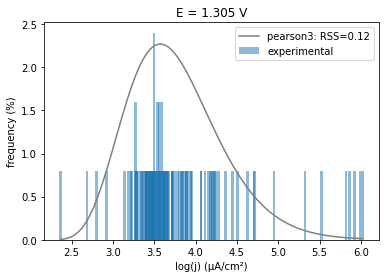

In [51]:
hist_fit_curve_plot(j_005_100,E_005_100,lE_005_100)

E=0.5002 V, lomax, RSS=0.33
E=0.5008 V, genpareto, RSS=0.42
E=0.5017 V, ncf, RSS=0.44
E=0.5051 V, ncx2, RSS=0.88
E=0.5127 V, genhalflogistic, RSS=0.17
E=0.5347 V, ksone, RSS=0.39
E=0.5759 V, semicircular, RSS=0.27
E=0.6314 V, frechet_l, RSS=0.12
E=0.6446 V, gumbel_l, RSS=0.14
E=0.7617 V, uniform, RSS=0.83
E=1.0575 V, loggamma, RSS=0.09
E=1.1002 V, johnsonsu, RSS=0.05
E=1.29 V, foldcauchy, RSS=0.02
E=1.297 V, foldnorm, RSS=0.06


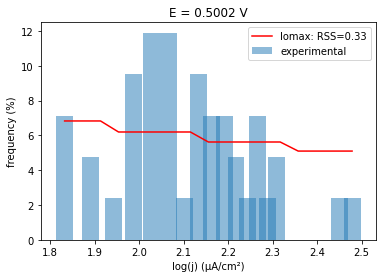

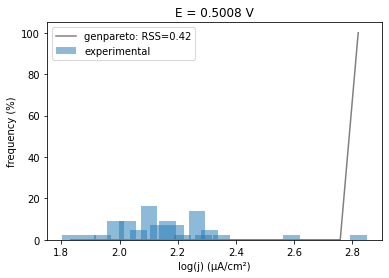

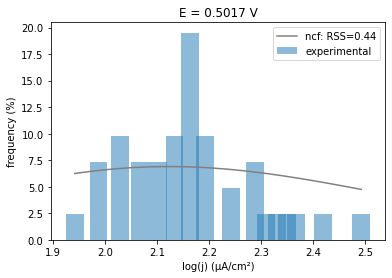

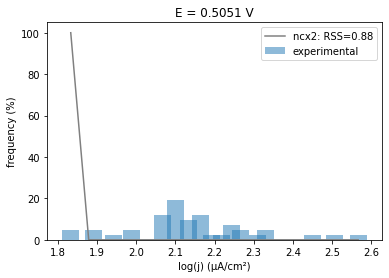

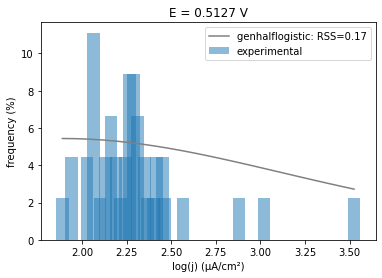

...

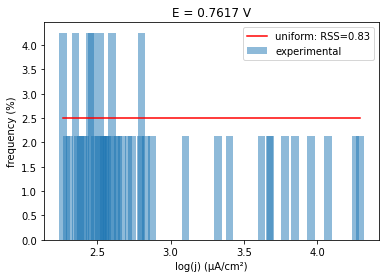

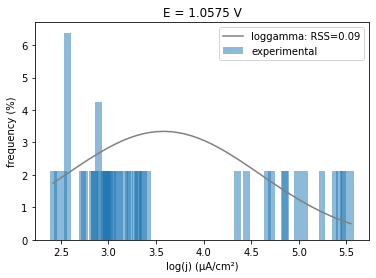

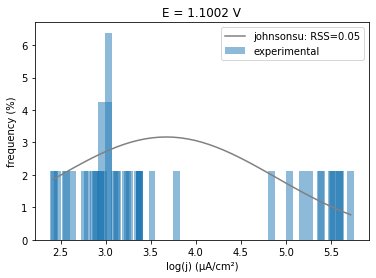

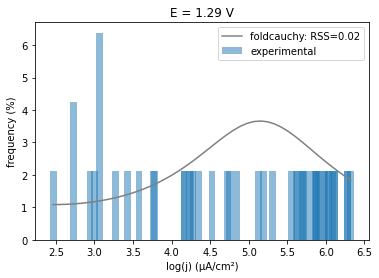

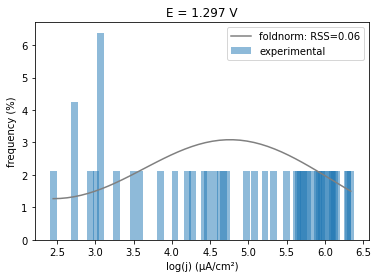

In [52]:
hist_fit_curve_plot(j_005_50,E_005_50,lE_005_50)

#### Lists of the selected best funtions

In [53]:
sel_func_0005_100=["fisk","hypsecant","logistic","foldnorm","betaprime","weibull_max","gumbel_l","t","lognorm","exponpow",
"mielke","burr","pearson3","fatiguelife","gompertz","recipinvgauss","f","tukeylambda","rice","powerlognorm","johnsonsu",
"exponweib"] 

In [54]:
sel_func_001_100=["fisk","hypsecant","logistic","foldnorm","maxwell","gumbel_l"] 

In [55]:
sel_func_001_50=["uniform","gumbel_l","loggamma","maxwell"] 

In [56]:
sel_func_005_100=["uniform","rayleigh","maxwell","rice","gengamma","pearson3"] 

In [57]:
sel_func_005_50=["uniform","gumbel_l"]

### 2) fitting with the selected best functions

As the RSS is an absolute error measure, a “normalised” version of the metric was preferred to account for 
the different data intervals as a function of E.

In [58]:
# importing a function for normalisation between 0 and 1
from sklearn import preprocessing
from sklearn.preprocessing import minmax_scale

In [59]:
def fitting_selected(j,E,sel_func_list): # unimodal functions
    scores=[] # list with: the best function name + the fitting score (RSS)  

    for (i, row) in j.iterrows():
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN
        sel_E_tempo=E.loc[i]
        sel_j=row.iloc[idx]
        sel_E=np.repeat(sel_E_tempo,sel_j.shape)
        if sel_j.shape[0] != 0: # in case a row has only NaN values
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)
            jsort=np.sort(np.log10(sel_j))
  
            dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2)) # fitting with the selected distributions    
            dist.fit_transform(minmax_scale(jsort), verbose=1) # determines the best-fitting probability distributions (log(j) values converted to the [0,1] interval)
            
            scores.append([dist.model['name'],dist.model['score']/len(jsort)]) # rescaled to the jsort sample size for higher accuracy
    return(scores)

In [60]:
def fitting_selected_uniform(j,E,sel_func_list): # unimodal functions + uniform distribution
    scores=[] # list with: the best function name + the fitting score (RSS)  
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')
    for (i, row) in j.iterrows():
        idx=np.where(~np.isnan(row)) # selecting only idx where not NaN
        sel_E_tempo=E.loc[i]
        sel_j=row.iloc[idx]
        sel_E=np.repeat(sel_E_tempo,sel_j.shape)
        if sel_j.shape[0] != 0: # in case a row has only NaN values
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)
            jsort=np.sort(np.log10(sel_j))

            if counts.max() <= 2 and sel_E[0] > 0.75: # log(j) outliers eventually induce "clearly not-uniform" distributions (specially at E<0.75V) to be fitted as uniform (limiting the max number of counts to 2 solved this issue)
                dist = distfit(distr=["uniform"],smooth=20,bins=20) # fitting to the uniform distribution   
                dist.fit_transform(minmax_scale(jsort), verbose=1) # log(j) values converted to the [0,1] interval
         
            else:   
                dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) # fitting with the selected distributions  
                dist.fit_transform(minmax_scale(jsort), verbose=1) # determines the best-fitting probability distributions (log(j) values converted to the [0,1] interval) 
            
            scores.append([dist.model['name'],dist.model['score']/len(jsort)]) # rescaled to the jsort sample size for higher accuracy
    return(scores)

In [61]:
scores_sel_0005_100=fitting_selected(j_0005_100,E_0005_100,sel_func_0005_100)

In [62]:
scores_sel_001_100=fitting_selected(j_001_100,E_001_100,sel_func_001_100)

In [63]:
scores_sel_001_50=fitting_selected_uniform(j_001_50,E_001_50,sel_func_001_50)

In [64]:
scores_sel_005_100=fitting_selected_uniform(j_005_100,E_005_100,sel_func_005_100)

In [65]:
scores_sel_005_50=fitting_selected_uniform(j_005_50,E_005_50,sel_func_005_50)

#### Plotting the best theoretical functions for fitting log(j), and the corresponding RSS

In [66]:
def sel_best_fit_function_RSS_plot(scores,E,title=None):
    best_function=[]
    RSS=[]
    for i in scores:
        best_function.append(i[0])
        RSS.append(i[1])

    fig, ax = plt.subplots(figsize=(15,7.5))
    ax.scatter(E,best_function,marker="|",linewidths=0.5,s=400,label="function")
    ax.set_xlabel("E (V)")
    ax.set_ylabel("Best fitting function")
    ax.tick_params(axis='x', which='major', labelsize=17)
    ax.tick_params(axis='y', which='major', labelsize=17)
    ax.xaxis.label.set_size(17)
    ax.yaxis.label.set_size(18)
    ax.set_title(title+": distributions of log(j)",fontsize = 16) # optional argument

    ax2 = ax.twinx() # instantiate a second axes that shares the same x-axis
    ax2.scatter(E,RSS,facecolors='none', edgecolors='brown',alpha=0.4,label="RSS")
    ax2.set_ylabel("RSS (normalised)")
    ax2.yaxis.label.set_size(17)
    ax2.tick_params(axis='both', which='major', labelsize=17)

    ax.set_xticks(np.arange(0.5,1.3544115,0.1))
    ax.set_xlim(0.5-0.01,1.3544115+0.01)
    ax.legend(fontsize=16,loc="upper left")
    ax2.legend(fontsize=16,loc='upper center')  
    
    return(best_function,RSS)

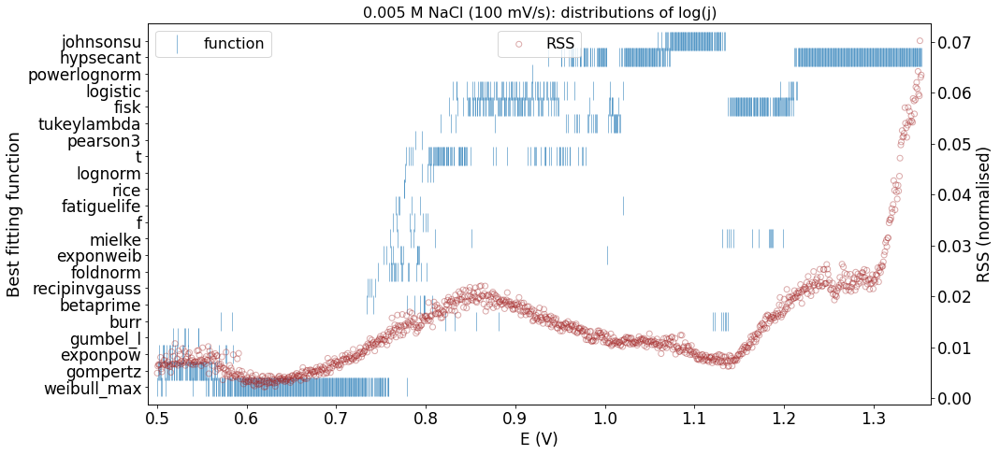

In [67]:
sel_best_function_0005_100,sel_RSS_0005_100=sel_best_fit_function_RSS_plot(scores_sel_0005_100,E_0005_100,"0.005 M NaCl (100 mV/s)")

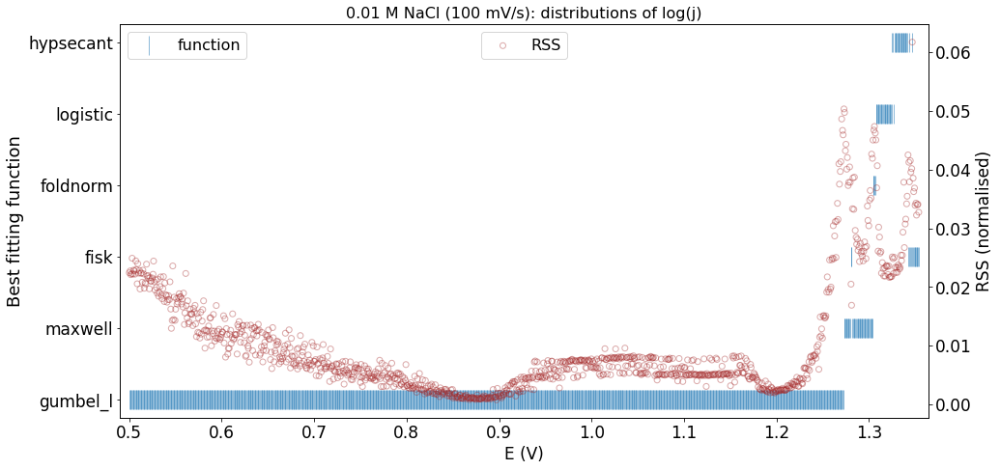

In [68]:
sel_best_function_001_100,sel_RSS_001_100=sel_best_fit_function_RSS_plot(scores_sel_001_100,E_001_100,"0.01 M NaCl (100 mV/s)")

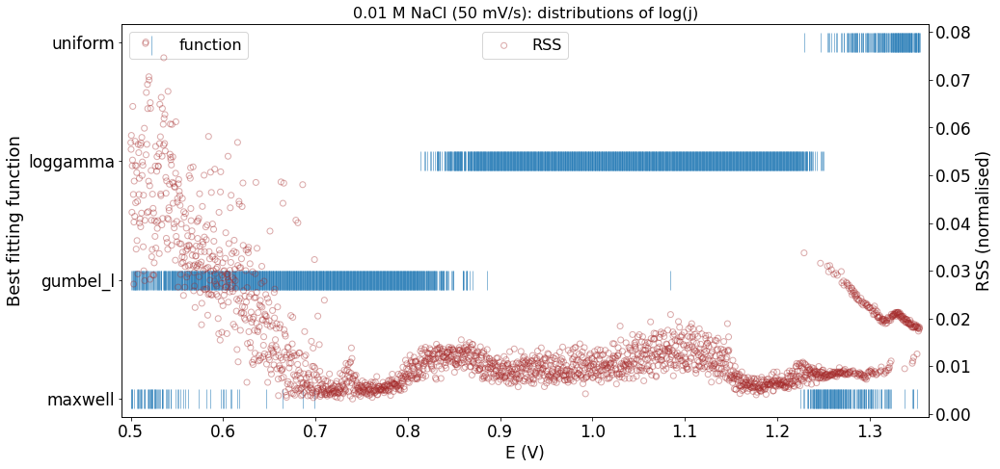

In [69]:
sel_best_function_001_50,sel_RSS_001_50=sel_best_fit_function_RSS_plot(scores_sel_001_50,E_001_50,"0.01 M NaCl (50 mV/s)")

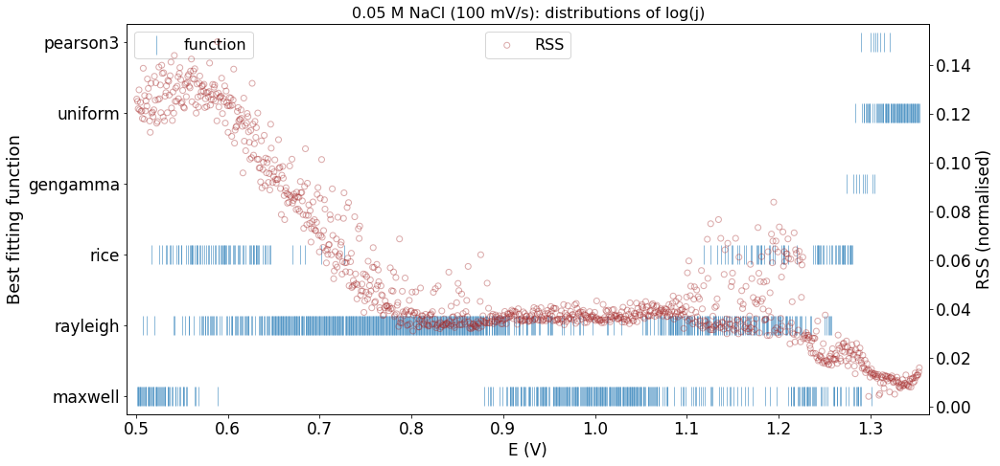

In [70]:
sel_best_function_005_100,sel_RSS_005_100=sel_best_fit_function_RSS_plot(scores_sel_005_100,E_005_100,"0.05 M NaCl (100 mV/s)")

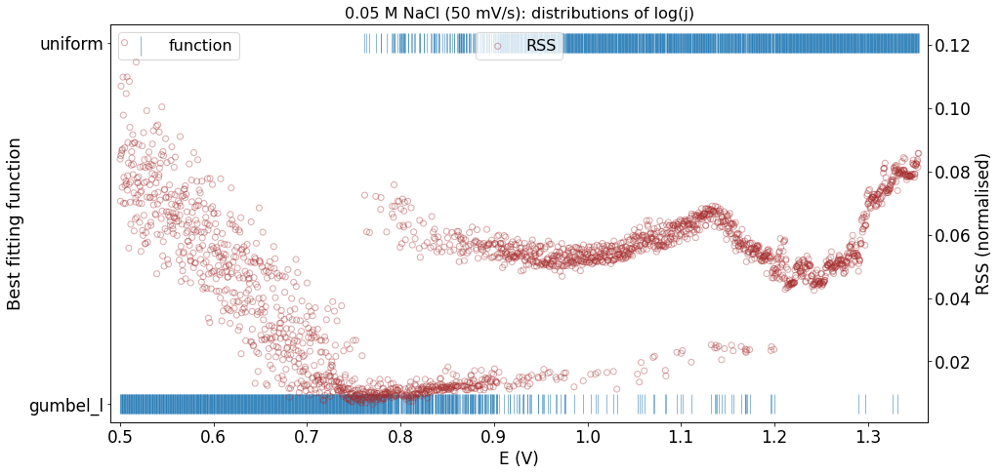

In [71]:
sel_best_function_005_50,sel_RSS_005_50=sel_best_fit_function_RSS_plot(scores_sel_005_50,E_005_50,"0.05 M NaCl (50 mV/s)")

##### Creating lists with: the first E where a selected function was outputed + the function name

In [72]:
lEs_0005_100,lfs_0005_100=[E for (E,m) in zip(lE_0005_100,lf_0005_100) if m in sel_func_0005_100],[m for (E,m) in zip(lE_0005_100,lf_0005_100) if m in sel_func_0005_100]
for e,m in zip(lEs_0005_100,lfs_0005_100):
    print("E="+str(np.around(e,4))+" V, "+m)

E=0.5008 V, gompertz
E=0.5023 V, exponpow
E=0.517 V, betaprime
E=0.5179 V, gumbel_l
E=0.5325 V, foldnorm
E=0.7398 V, exponweib
E=0.7437 V, recipinvgauss
E=0.7608 V, fatiguelife
E=0.7654 V, tukeylambda
E=0.766 V, f
E=0.773 V, t
E=0.7938 V, pearson3
E=0.8115 V, fisk
E=0.8472 V, logistic
E=0.9195 V, powerlognorm
E=0.9372 V, hypsecant
E=1.059 V, johnsonsu
E=1.1206 V, mielke


In [73]:
lEs_001_100,lfs_001_100=[E for (E,m) in zip(lE_001_100,lf_001_100) if m in sel_func_001_100],[m for (E,m) in zip(lE_001_100,lf_001_100) if m in sel_func_001_100]
for e,m in zip(lEs_001_100,lfs_001_100):
    print("E="+str(np.around(e,4))+" V, "+m)

E=0.7169 V, gumbel_l
E=1.2952 V, maxwell
E=1.3059 V, foldnorm
E=1.3083 V, logistic
E=1.3251 V, hypsecant
E=1.3422 V, fisk


In [74]:
lEs_001_50,lfs_001_50=[E for (E,m) in zip(lE_001_50,lf_001_50) if m in sel_func_001_50],[m for (E,m) in zip(lE_001_50,lf_001_50) if m in sel_func_001_50]
for e,m in zip(lEs_001_50,lfs_001_50):
    print("E="+str(np.around(e,4))+" V, "+m)

E=0.6256 V, gumbel_l
E=0.8136 V, loggamma
E=1.2293 V, uniform
E=1.2329 V, maxwell


In [75]:
lEs_005_100,lfs_005_100=E_function_lists(E_005_100,sel_best_function_005_100)

E=0.5008 V, maxwell
E=0.5078 V, rayleigh
E=0.5164 V, rice
E=1.2741 V, gengamma
E=1.2836 V, uniform
E=1.2903 V, pearson3


In [76]:
lEs_005_50,lfs_005_50=[E for (E,m) in zip(lE_005_50,lf_005_50) if m in sel_func_005_50],[m for (E,m) in zip(lE_005_50,lf_005_50) if m in sel_func_005_50]
for e,m in zip(lEs_005_50,lfs_005_50):
    print("E="+str(np.around(e,4))+" V, "+m)

E=0.6446 V, gumbel_l
E=0.7617 V, uniform


##### Plotting the histograms of log(j) fitted by the selected functions at increasing potentials 

In [77]:
def hist_sel_fit_curve_plot(j,E,lEs,sel_func_list):
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E_tempo=E.loc[i]
        if sel_E_tempo[0] in lEs:
            sel_j=row.iloc[idx]
            sel_E=np.repeat(sel_E_tempo,sel_j.shape)
            if sel_j.shape[0] != 0:  
                fig, ax = plt.subplots()
            
                unique, counts = np.unique(np.log10(sel_j), return_counts=True) 
                jsort=np.sort(np.log10(sel_j))
                x=np.linspace(jsort[0],jsort[-1],len(unique)) 
            
                bin_edges = np.histogram_bin_edges(unique, bins=len(unique))
                ax.bar(unique, 100*counts/counts.sum(),width=np.diff(bin_edges),label="experimental",color="C0", alpha=0.5)

                dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2)) 
                dist.fit_transform(jsort, verbose=1) 
             
                parameters=[]
                for p in dist.model['params']:
                    parameters.append(p)
                
                print("E="+str(np.around(sel_E[0],4))+" V, "+dist.model['name']+", RSS="+str(np.around(dist.model['score'],2)))
       
                if dist.model["name"]=="t":
                    tmodel=t.pdf(x, *parameters)
                    ax.plot(x,100*tmodel/tmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="lognorm":
                    lognormmodel=lognorm.pdf(x, *parameters)
                    ax.plot(x, 100* lognormmodel/lognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="fisk":
                    fiskmodel=fisk.pdf(x, *parameters)
                    ax.plot(x, 100* fiskmodel/fiskmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="hypsecant":
                    hypsecantmodel= hypsecant.pdf(x, *parameters)
                    ax.plot(x, 100* hypsecantmodel/ hypsecantmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="logistic":
                    logisticmodel=logistic.pdf(x, *parameters)
                    ax.plot(x, 100* logisticmodel/logisticmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="foldnorm":
                    foldnormmodel=foldnorm.pdf(x, *parameters)
                    ax.plot(x, 100* foldnormmodel/foldnormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="betaprime":
                    betaprimemodel=betaprime.pdf(x, *parameters)
                    ax.plot(x, 100* betaprimemodel/betaprimemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="maxwell":
                    maxwellmodel=maxwell.pdf(x, *parameters)
                    ax.plot(x, 100* maxwellmodel/maxwellmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="weibull_max":
                    weibull_maxmodel=weibull_max.pdf(x, *parameters)
                    ax.plot(x, 100* weibull_maxmodel/weibull_maxmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="gumbel_l":
                    gumbel_lmodel=gumbel_l.pdf(x, *parameters)
                    ax.plot(x, 100* gumbel_lmodel/gumbel_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))      
                elif dist.model["name"]=="burr":
                    burrmodel=burr .pdf(x, *parameters)
                    ax.plot(x, 100* burrmodel/burrmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))            
                elif dist.model["name"]=="exponweib":
                    exponweibmodel=exponweib.pdf(x, *parameters)
                    ax.plot(x, 100* exponweibmodel/exponweibmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="pearson3":
                    pearson3model=pearson3.pdf(x, *parameters)
                    ax.plot(x, 100* pearson3model/pearson3model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="fatiguelife":
                    fatiguelifemodel=fatiguelife.pdf(x, *parameters)
                    ax.plot(x, 100* fatiguelifemodel/fatiguelifemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="exponpow":
                    exponpowmodel=exponpow.pdf(x, *parameters)
                    ax.plot(x, 100* exponpowmodel/exponpowmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))          
                elif dist.model["name"]=="mielke":
                    mielkemodel=mielke.pdf(x, *parameters)
                    ax.plot(x, 100* mielkemodel/mielkemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))         
                elif dist.model["name"]=="gompertz":
                    gompertzmodel=gompertz.pdf(x, *parameters)
                    ax.plot(x, 100* gompertzmodel/gompertzmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                                                                          
                elif dist.model["name"]=="recipinvgauss":
                    recipinvgaussmodel=recipinvgauss.pdf(x, *parameters)
                    ax.plot(x, 100* recipinvgaussmodel/recipinvgaussmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="f":
                    fmodel=f.pdf(x, *parameters)
                    ax.plot(x, 100* fmodel/fmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="tukeylambda":
                    tukeylambdamodel=tukeylambda.pdf(x, *parameters)
                    ax.plot(x, 100* tukeylambdamodel/tukeylambdamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="rice":
                    ricemodel=rice.pdf(x, *parameters)
                    ax.plot(x, 100* ricemodel/ricemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="powerlognorm":
                    powerlognormmodel=powerlognorm.pdf(x, *parameters)
                    ax.plot(x, 100* powerlognormmodel/powerlognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="johnsonsu":
                    johnsonsumodel=johnsonsu.pdf(x, *parameters)
                    ax.plot(x, 100* johnsonsumodel/johnsonsumodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))       
                else:
                    continue
                
                ax.set_title("E = "+str(np.around(sel_E[0],4))+" V")
                ax.set_xlabel("log(j) (µA/cm²)")
                ax.set_ylabel("frequency (%)")
                ax.legend(fontsize=12,loc="best")
                ax.yaxis.label.set_size(16)
                ax.xaxis.label.set_size(16)
                ax.title.set_size(16)
                ax.tick_params(axis='both', which='major', labelsize=14)

In [78]:
def hist_sel_fit_curve_plot_uniform(j,E,lEs,sel_func_list):
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E_tempo=E.loc[i]
        if sel_E_tempo[0] in lEs:
            sel_j=row.iloc[idx]
            sel_E=np.repeat(sel_E_tempo,sel_j.shape)
            if sel_j.shape[0] != 0: 
                fig, ax = plt.subplots()
            
                unique, counts = np.unique(np.log10(sel_j), return_counts=True) 
                jsort=np.sort(np.log10(sel_j))
                x=np.linspace(jsort[0],jsort[-1],len(unique)) 
            
                bin_edges = np.histogram_bin_edges(unique, bins=len(unique))
                ax.bar(unique, 100*counts/counts.sum(),width=np.diff(bin_edges),label="experimental",color="C0", alpha=0.5)

                if counts.max() <= 2 and sel_E[0] > 0.75:
                    dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                    dist.fit_transform(jsort, verbose=1) 
            
                else:
                    dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) 
                    dist.fit_transform(jsort, verbose=1) 
             
                parameters=[]
                for p in dist.model['params']:
                    parameters.append(p)
                
                print("E="+str(np.around(sel_E[0],4))+" V, "+dist.model['name']+", RSS="+str(np.around(dist.model['score'],2)))
       
                if dist.model["name"]=="maxwell":
                    maxwellmodel=maxwell.pdf(x, *parameters)
                    ax.plot(x, 100* maxwellmodel/maxwellmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="loggamma":
                    loggammamodel=loggamma.pdf(x, *parameters)
                    ax.plot(x, 100* loggammamodel/loggammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="gumbel_l":
                    gumbel_lmodel=gumbel_l.pdf(x, *parameters)
                    ax.plot(x, 100* gumbel_lmodel/gumbel_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))      
                elif dist.model["name"]=="rayleigh":
                    rayleighmodel=rayleigh.pdf(x, *parameters)
                    ax.plot(x, 100* rayleighmodel/rayleighmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="gengamma":
                    gengammamodel=gengamma.pdf(x, *parameters)
                    ax.plot(x, 100* gengammamodel/gengammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="pearson3":
                    pearson3model=pearson3.pdf(x, *parameters)
                    ax.plot(x, 100* pearson3model/pearson3model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="rice":
                    ricemodel=rice.pdf(x, *parameters)
                    ax.plot(x, 100* ricemodel/ricemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="uniform":
                    uniformmodel=uniform.pdf(x, *parameters)
                    ax.plot(x, 100* uniformmodel/uniformmodel.sum(),"red",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                else:
                    continue
                
                ax.set_title("E = "+str(np.around(sel_E[0],4))+" V")
                ax.set_xlabel("log(j) (µA/cm²)")
                ax.set_ylabel("frequency (%)")
                ax.legend(fontsize=12,loc="best")
                ax.yaxis.label.set_size(16)
                ax.xaxis.label.set_size(16)
                ax.title.set_size(16)
                ax.tick_params(axis='both', which='major', labelsize=14)

E=0.5008 V, gompertz, RSS=1.01
E=0.5023 V, exponpow, RSS=1.01
E=0.517 V, betaprime, RSS=0.77
E=0.5179 V, gumbel_l, RSS=0.95
E=0.5325 V, foldnorm, RSS=0.48
E=0.7398 V, exponweib, RSS=1.68
E=0.7437 V, recipinvgauss, RSS=1.62
E=0.7608 V, fatiguelife, RSS=2.15
E=0.7654 V, tukeylambda, RSS=2.38
E=0.766 V, f, RSS=1.83
E=0.773 V, t, RSS=2.25
E=0.7938 V, pearson3, RSS=1.48
E=0.8115 V, fisk, RSS=2.03
E=0.8472 V, logistic, RSS=2.22
E=0.9195 V, powerlognorm, RSS=0.74
E=0.9372 V, hypsecant, RSS=1.28
E=1.059 V, johnsonsu, RSS=0.85
E=1.1206 V, mielke, RSS=0.62


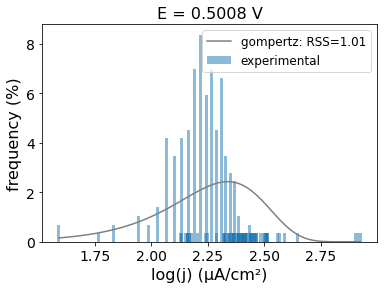

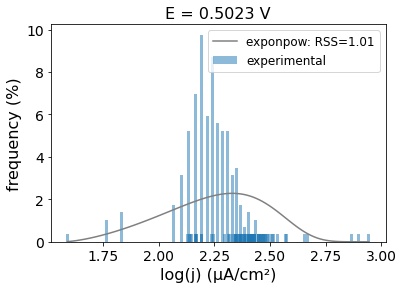

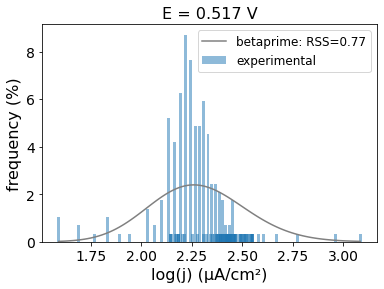

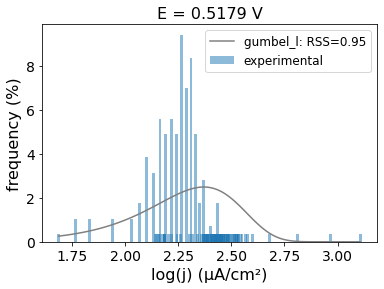

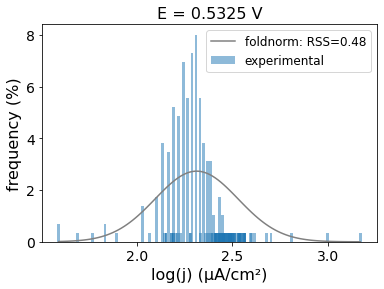

...

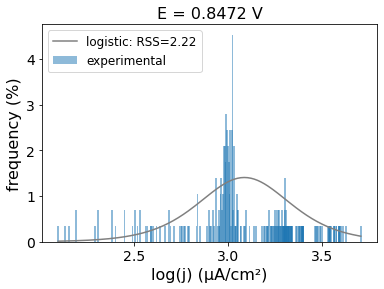

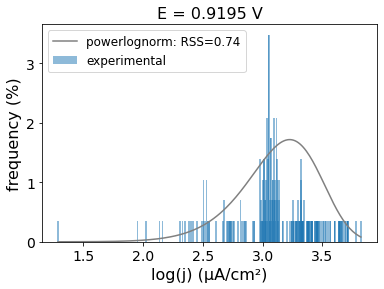

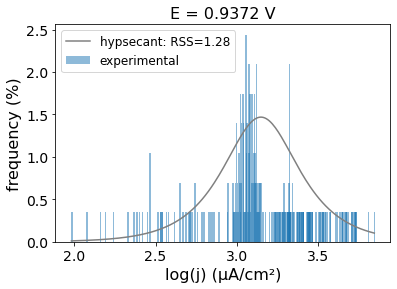

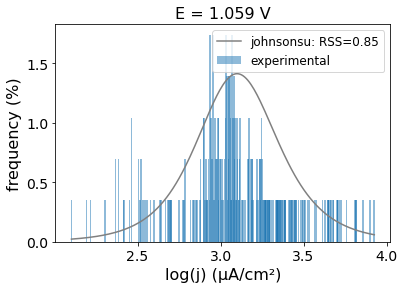

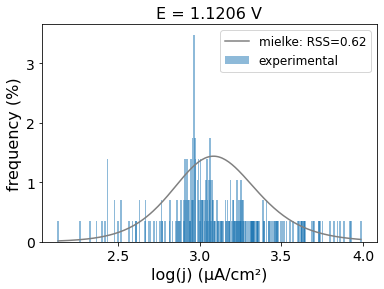

In [79]:
hist_sel_fit_curve_plot(j_0005_100,E_0005_100,lEs_0005_100,lfs_0005_100)

E=0.7169 V, gumbel_l, RSS=2.13
E=1.2952 V, maxwell, RSS=2.19
E=1.3059 V, foldnorm, RSS=3.93
E=1.3083 V, logistic, RSS=3.15
E=1.3251 V, hypsecant, RSS=2.26
E=1.3422 V, fisk, RSS=4.06


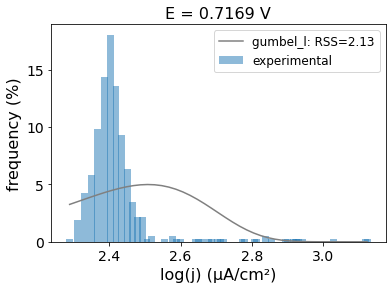

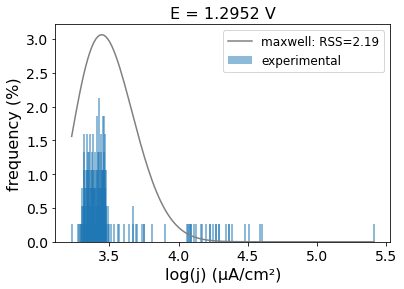

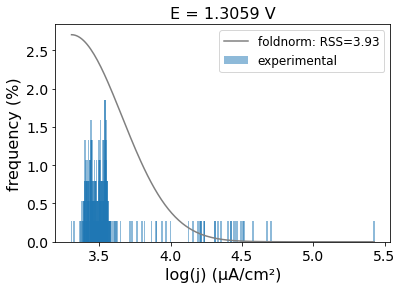

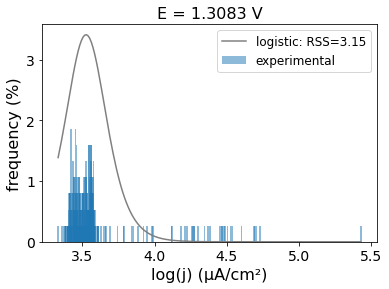

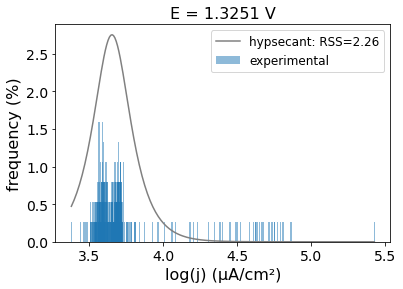

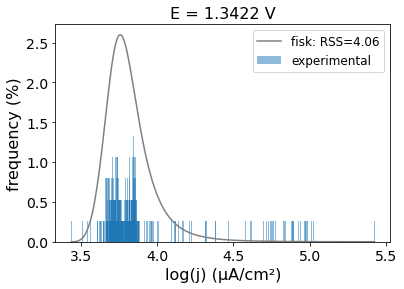

In [80]:
hist_sel_fit_curve_plot(j_001_100,E_001_100,lEs_001_100,lfs_001_100)

E=0.6256 V, gumbel_l, RSS=0.96
E=0.8136 V, loggamma, RSS=0.76
E=1.2293 V, uniform, RSS=0.45
E=1.2329 V, maxwell, RSS=0.12


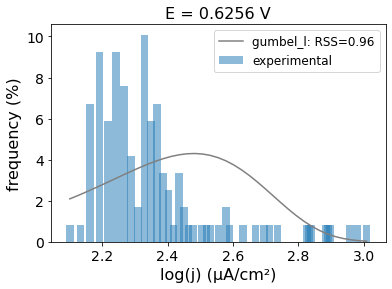

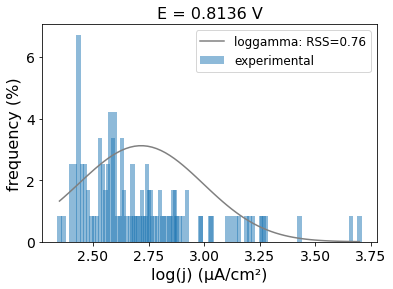

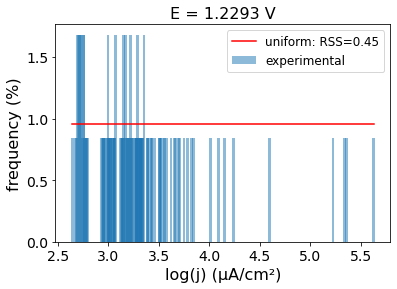

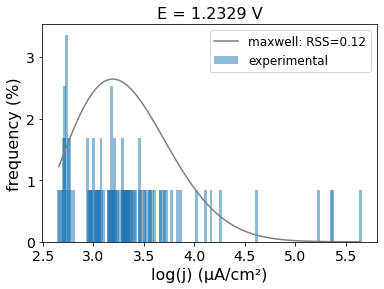

In [81]:
hist_sel_fit_curve_plot_uniform(j_001_50,E_001_50,lEs_001_50,lfs_001_50)

E=0.5008 V, maxwell, RSS=1.76
E=0.5078 V, rayleigh, RSS=1.96
E=0.5164 V, rice, RSS=1.86
E=1.2741 V, gengamma, RSS=0.21
E=1.2836 V, uniform, RSS=0.11
E=1.2903 V, pearson3, RSS=0.15


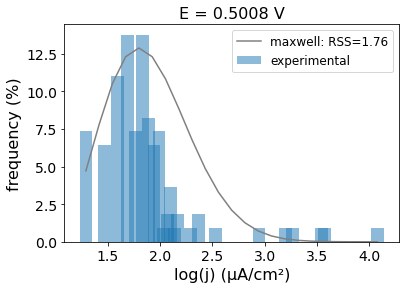

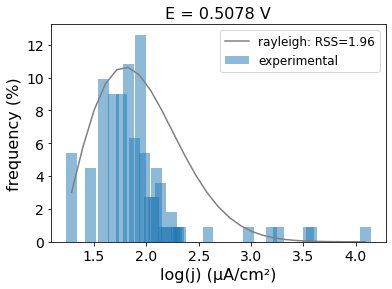

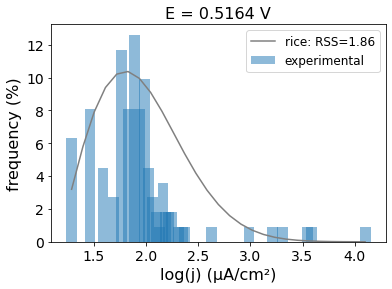

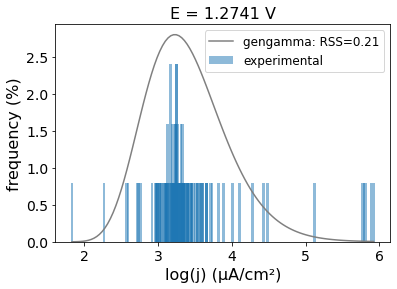

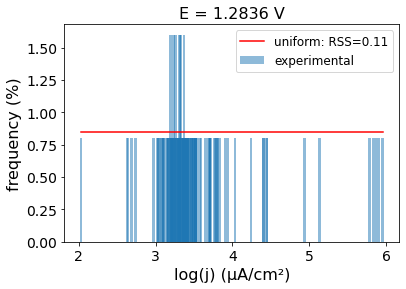

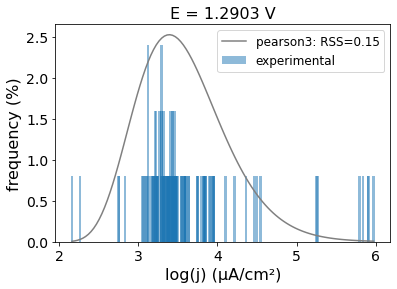

In [82]:
hist_sel_fit_curve_plot_uniform(j_005_100,E_005_100,lEs_005_100,lfs_005_100)

E=0.6446 V, gumbel_l, RSS=0.14
E=0.7617 V, uniform, RSS=0.83


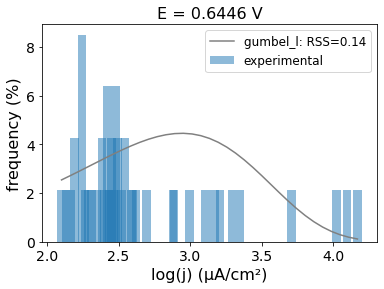

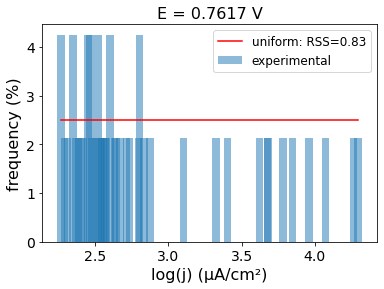

In [83]:
hist_sel_fit_curve_plot_uniform(j_005_50,E_005_50,lEs_005_50,lfs_005_50)

##### Plotting the histograms of log(j) fitted by the selected functions at selected low and high potentials (E equal to 0.5 V and 1.35 V, respectively). 

In [84]:
def hist_sel_fit_curve_plot2(j,E,sel_func_list): 
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E_tempo=E.loc[i]
        if sel_E_tempo[0] in pd.concat([E.iloc[3:6], E.iloc[-4:]]).values:
            sel_j=row.iloc[idx]
            sel_E=np.repeat(sel_E_tempo,sel_j.shape)
            if sel_j.shape[0] != 0:  
                fig, ax = plt.subplots()
            
                unique, counts = np.unique(np.log10(sel_j), return_counts=True) 
                jsort=np.sort(np.log10(sel_j))
                x=np.linspace(jsort[0],jsort[-1],len(unique)) 
            
                bin_edges = np.histogram_bin_edges(unique, bins=len(unique))
                ax.bar(unique, 100*counts/counts.sum(),width=np.diff(bin_edges),color="C0", alpha=0.5)

                dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2)) 
                dist.fit_transform(jsort, verbose=1) 
             
                parameters=[]
                for p in dist.model['params']:
                    parameters.append(p)
                
                print("E="+str(np.around(sel_E[0],2))+" V, "+dist.model['name']+", RSS="+str(np.around(dist.model['score'],2)))
       
                if dist.model["name"]=="t":
                    tmodel=t.pdf(x, *parameters)
                    ax.plot(x,100*tmodel/tmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="lognorm":
                    lognormmodel=lognorm.pdf(x, *parameters)
                    ax.plot(x, 100* lognormmodel/lognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="fisk":
                    fiskmodel=fisk.pdf(x, *parameters)
                    ax.plot(x, 100* fiskmodel/fiskmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="hypsecant":
                    hypsecantmodel= hypsecant.pdf(x, *parameters)
                    ax.plot(x, 100* hypsecantmodel/ hypsecantmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))  
                elif dist.model["name"]=="logistic":
                    logisticmodel=logistic.pdf(x, *parameters)
                    ax.plot(x, 100* logisticmodel/logisticmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="foldnorm":
                    foldnormmodel=foldnorm.pdf(x, *parameters)
                    ax.plot(x, 100* foldnormmodel/foldnormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))   
                elif dist.model["name"]=="betaprime":
                    betaprimemodel=betaprime.pdf(x, *parameters)
                    ax.plot(x, 100* betaprimemodel/betaprimemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="maxwell":
                    maxwellmodel=maxwell.pdf(x, *parameters)
                    ax.plot(x, 100* maxwellmodel/maxwellmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="weibull_max":
                    weibull_maxmodel=weibull_max.pdf(x, *parameters)
                    ax.plot(x, 100* weibull_maxmodel/weibull_maxmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                
                elif dist.model["name"]=="gumbel_l":
                    gumbel_lmodel=gumbel_l.pdf(x, *parameters)
                    ax.plot(x, 100* gumbel_lmodel/gumbel_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))      
                elif dist.model["name"]=="burr":
                    burrmodel=burr .pdf(x, *parameters)
                    ax.plot(x, 100* burrmodel/burrmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="exponweib":
                    exponweibmodel=exponweib.pdf(x, *parameters)
                    ax.plot(x, 100* exponweibmodel/exponweibmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="pearson3":
                    pearson3model=pearson3.pdf(x, *parameters)
                    ax.plot(x, 100* pearson3model/pearson3model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="fatiguelife":
                    fatiguelifemodel=fatiguelife.pdf(x, *parameters)
                    ax.plot(x, 100* fatiguelifemodel/fatiguelifemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="exponpow":
                    exponpowmodel=exponpow.pdf(x, *parameters)
                    ax.plot(x, 100* exponpowmodel/exponpowmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="mielke":
                    mielkemodel=mielke.pdf(x, *parameters)
                    ax.plot(x, 100* mielkemodel/mielkemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="gompertz":
                    gompertzmodel=gompertz.pdf(x, *parameters)
                    ax.plot(x, 100* gompertzmodel/gompertzmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))                                                                          
                elif dist.model["name"]=="recipinvgauss":
                    recipinvgaussmodel=recipinvgauss.pdf(x, *parameters)
                    ax.plot(x, 100* recipinvgaussmodel/recipinvgaussmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="f":
                    fmodel=f.pdf(x, *parameters)
                    ax.plot(x, 100* fmodel/fmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="tukeylambda":
                    tukeylambdamodel=tukeylambda.pdf(x, *parameters)
                    ax.plot(x, 100* tukeylambdamodel/tukeylambdamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="rice":
                    ricemodel=rice.pdf(x, *parameters)
                    ax.plot(x, 100* ricemodel/ricemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="powerlognorm":
                    powerlognormmodel=powerlognorm.pdf(x, *parameters)
                    ax.plot(x, 100* powerlognormmodel/powerlognormmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="johnsonsu":
                    johnsonsumodel=johnsonsu.pdf(x, *parameters)
                    ax.plot(x, 100* johnsonsumodel/johnsonsumodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                else:
                    continue
                
                ax.set_title("E = "+str(np.around(sel_E[0],2))+" V")
                ax.set_xlabel("log(j) (µA/cm²)")
                ax.set_ylabel("frequency (%)")
                ax.legend(fontsize=12,loc="best")
                ax.yaxis.label.set_size(16)
                ax.xaxis.label.set_size(16)
                ax.title.set_size(16)
                ax.tick_params(axis='both', which='major', labelsize=14)
                ax.set_xlim(1.2,6.7) # all hists in the same scales 
                ax.set_ylim(0,19) # all hists in the same scales

In [85]:
def hist_sel_fit_curve_plot2_uniform(j,E,sel_func_list): 
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E_tempo=E.loc[i]
        if sel_E_tempo[0] in pd.concat([E.iloc[3:6], E.iloc[-4:]]).values:
            sel_j=row.iloc[idx]
            sel_E=np.repeat(sel_E_tempo,sel_j.shape)
            if sel_j.shape[0] != 0: 
                fig, ax = plt.subplots()
            
                unique, counts = np.unique(np.log10(sel_j), return_counts=True) 
                jsort=np.sort(np.log10(sel_j))
                x=np.linspace(jsort[0],jsort[-1],len(unique)) 
            
                bin_edges = np.histogram_bin_edges(unique, bins=len(unique))
                ax.bar(unique, 100*counts/counts.sum(),width=np.diff(bin_edges),color="C0", alpha=0.5)

                if counts.max() <= 2 and sel_E[0] > 0.75: 
                    dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                    dist.fit_transform(jsort, verbose=1) 
            
                else:
                    dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) 
                    dist.fit_transform(jsort, verbose=1)  
             
                parameters=[]
                for p in dist.model['params']:
                    parameters.append(p)
                
                print("E="+str(np.around(sel_E[0],2))+" V, "+dist.model['name']+", RSS="+str(np.around(dist.model['score'],2)))
       
                if dist.model["name"]=="maxwell":
                    maxwellmodel=maxwell.pdf(x, *parameters)
                    ax.plot(x, 100* maxwellmodel/maxwellmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="loggamma":
                    loggammamodel=loggamma.pdf(x, *parameters)
                    ax.plot(x, 100* loggammamodel/loggammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="gumbel_l":
                    gumbel_lmodel=gumbel_l.pdf(x, *parameters)
                    ax.plot(x, 100* gumbel_lmodel/gumbel_lmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))      
                elif dist.model["name"]=="rayleigh":
                    rayleighmodel=rayleigh.pdf(x, *parameters)
                    ax.plot(x, 100* rayleighmodel/rayleighmodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))              
                elif dist.model["name"]=="gengamma":
                    gengammamodel=gengamma.pdf(x, *parameters)
                    ax.plot(x, 100* gengammamodel/gengammamodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="pearson3":
                    pearson3model=pearson3.pdf(x, *parameters)
                    ax.plot(x, 100* pearson3model/pearson3model.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))               
                elif dist.model["name"]=="rice":
                    ricemodel=rice.pdf(x, *parameters)
                    ax.plot(x, 100* ricemodel/ricemodel.sum(),"grey",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                elif dist.model["name"]=="uniform":
                    uniformmodel=uniform.pdf(x, *parameters)
                    ax.plot(x, 100* uniformmodel/uniformmodel.sum(),"red",label=str(dist.model['name'])+": RSS="+str(np.around(dist.model['score'],2)))             
                else:
                    continue
                    
                ax.set_title("E = "+str(np.around(sel_E[0],2))+" V")
                ax.set_xlabel("log(j) (µA/cm²)")
                ax.set_ylabel("frequency (%)")
                ax.legend(fontsize=12,loc="best")
                ax.yaxis.label.set_size(16)
                ax.xaxis.label.set_size(16)
                ax.title.set_size(16)
                ax.tick_params(axis='both', which='major', labelsize=14)
                ax.set_xlim(1.2,6.7) # all hists in the same scales
                ax.set_ylim(0,19) # all hists in the same scales

E=0.5 V, exponpow, RSS=1.01
E=0.5 V, gompertz, RSS=1.04
E=0.5 V, exponpow, RSS=0.84
E=1.35 V, hypsecant, RSS=2.0
E=1.35 V, hypsecant, RSS=2.46
E=1.35 V, hypsecant, RSS=2.08
E=1.35 V, hypsecant, RSS=2.19


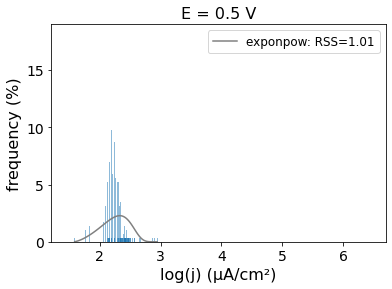

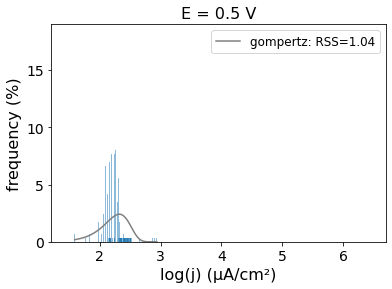

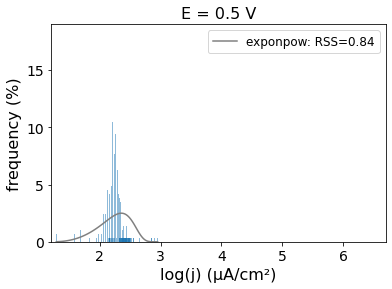

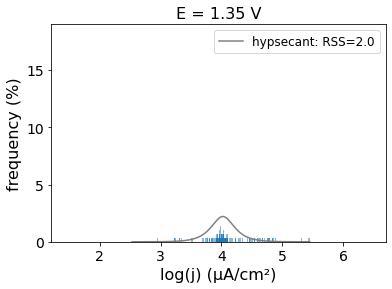

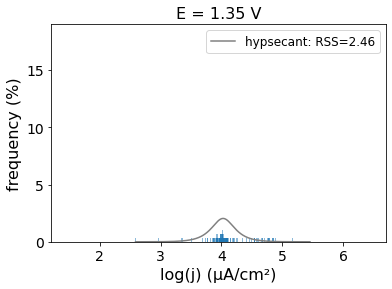

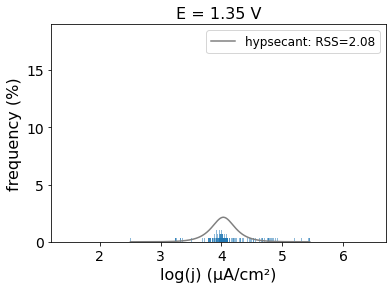

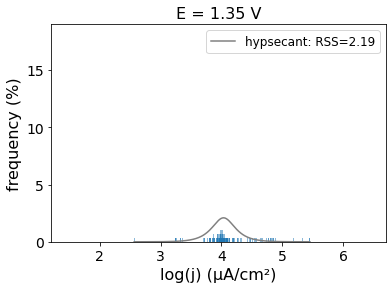

In [86]:
hist_sel_fit_curve_plot2(j_0005_100,E_0005_100,lfs_0005_100)

E=0.5 V, gumbel_l, RSS=7.41
E=0.5 V, gumbel_l, RSS=7.62
E=0.5 V, gumbel_l, RSS=7.6
E=1.35 V, fisk, RSS=3.21
E=1.35 V, fisk, RSS=3.41
E=1.35 V, fisk, RSS=3.45
E=1.35 V, fisk, RSS=3.33


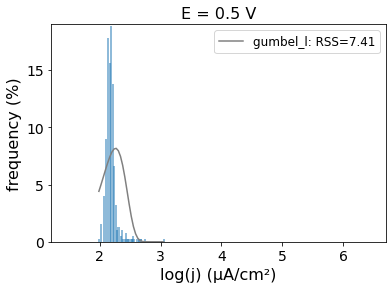

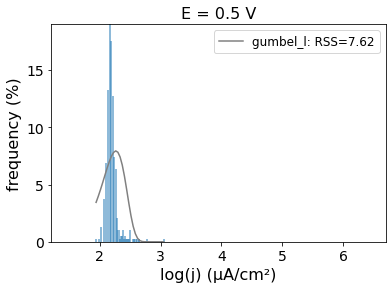

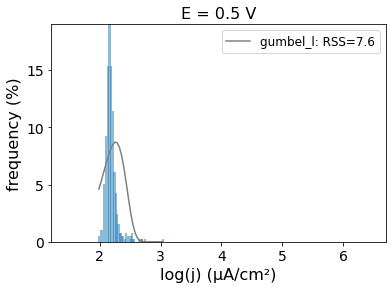

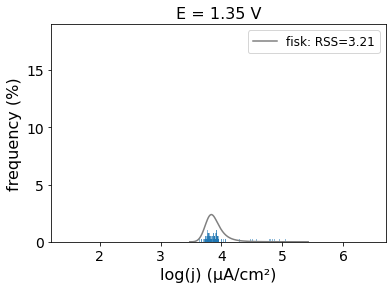

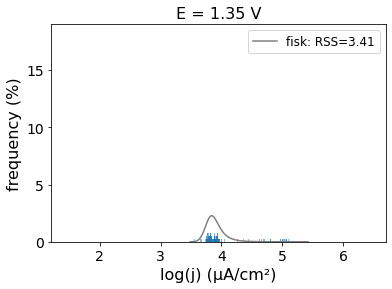

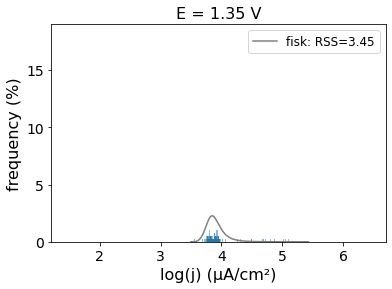

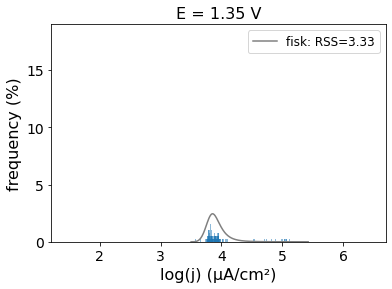

In [87]:
hist_sel_fit_curve_plot2(j_001_100,E_001_100,lfs_001_100)

E=0.5 V, maxwell, RSS=2.67
E=0.5 V, gumbel_l, RSS=7.94
E=0.5 V, maxwell, RSS=5.73
E=1.35 V, uniform, RSS=0.15
E=1.35 V, uniform, RSS=0.16
E=1.35 V, uniform, RSS=0.16
E=1.35 V, uniform, RSS=0.16


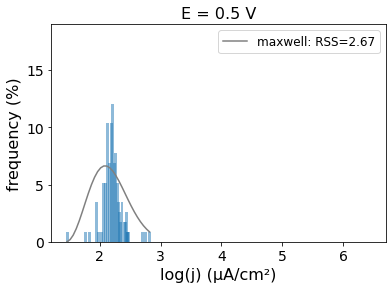

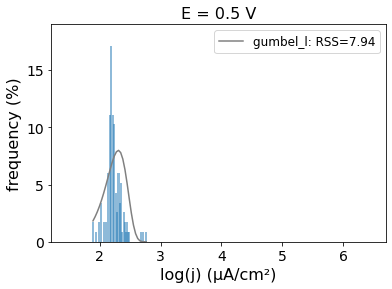

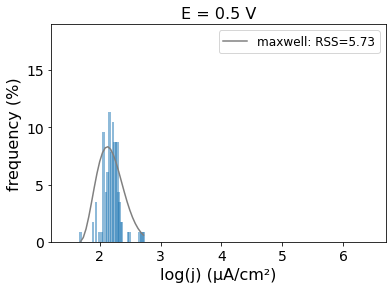

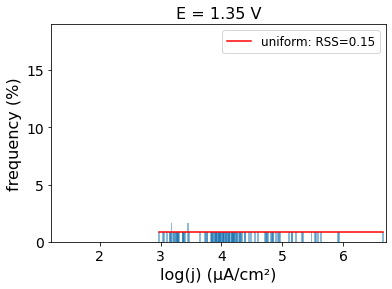

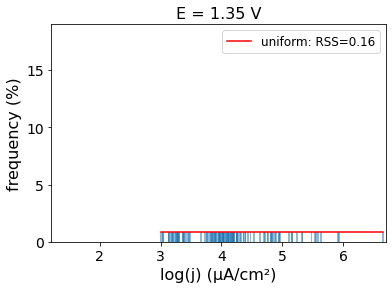

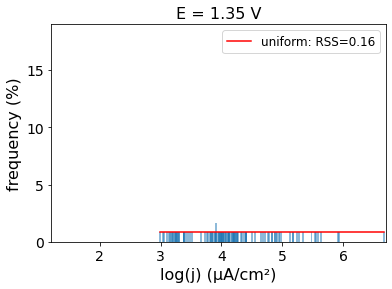

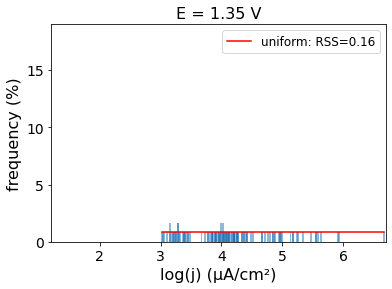

In [88]:
hist_sel_fit_curve_plot2_uniform(j_001_50,E_001_50,lfs_001_50)

E=0.5 V, maxwell, RSS=1.9
E=0.5 V, maxwell, RSS=1.78
E=0.5 V, maxwell, RSS=1.73
E=1.35 V, uniform, RSS=0.15
E=1.35 V, uniform, RSS=0.15
E=1.35 V, uniform, RSS=0.17
E=1.35 V, uniform, RSS=0.18


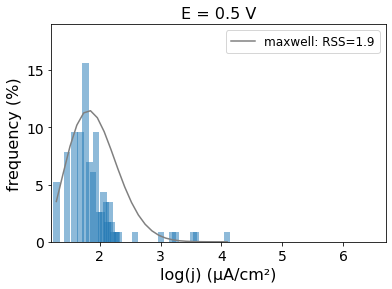

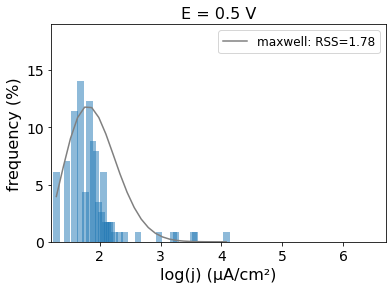

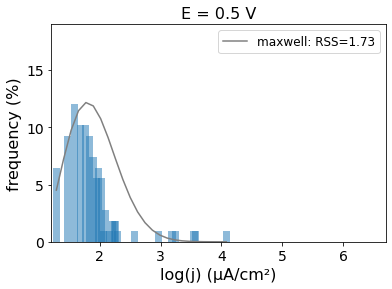

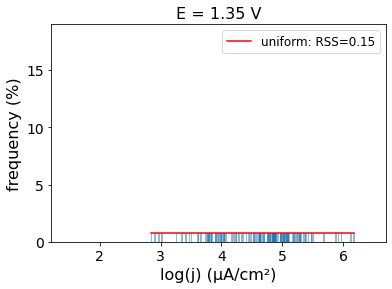

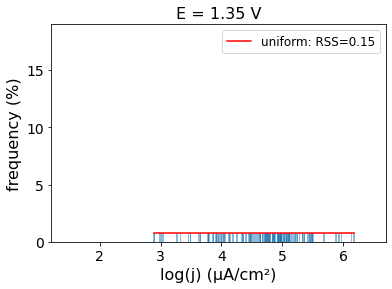

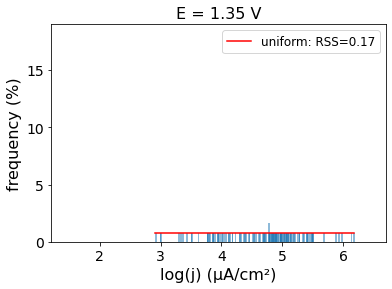

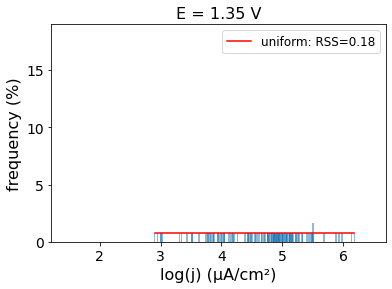

In [89]:
hist_sel_fit_curve_plot2_uniform(j_005_100,E_005_100,lfs_005_100)

E=0.5 V, gumbel_l, RSS=7.42
E=0.5 V, gumbel_l, RSS=11.59
E=0.5 V, gumbel_l, RSS=4.64
E=1.35 V, uniform, RSS=0.29
E=1.35 V, uniform, RSS=0.28
E=1.35 V, uniform, RSS=0.3
E=1.35 V, uniform, RSS=0.3


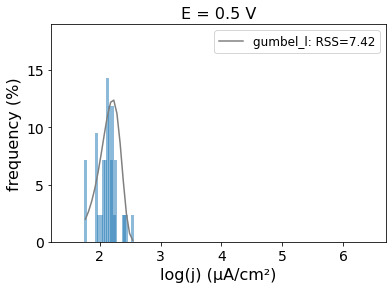

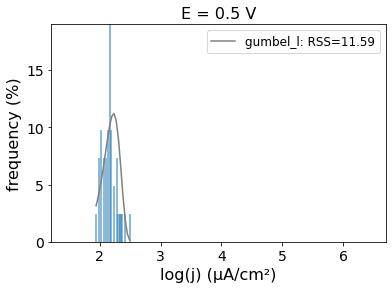

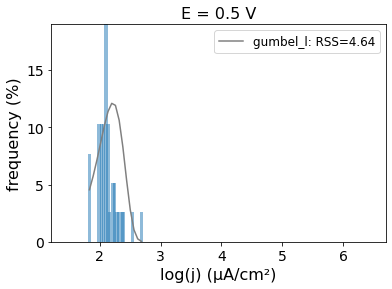

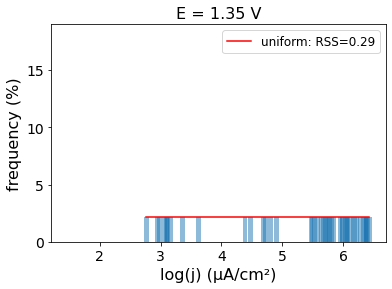

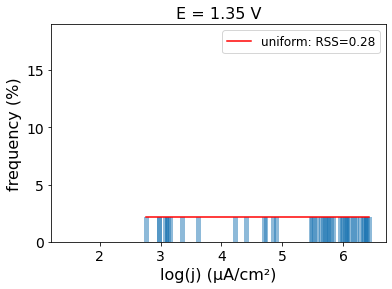

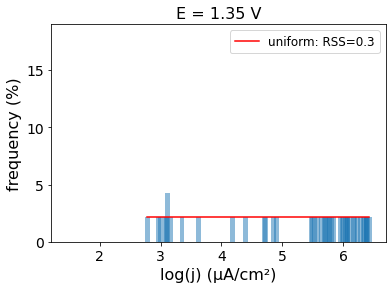

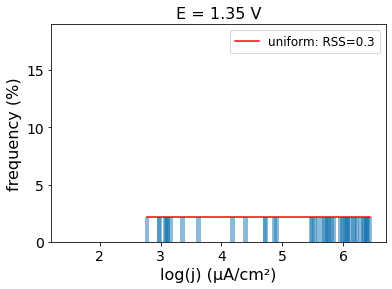

In [90]:
hist_sel_fit_curve_plot2_uniform(j_005_50,E_005_50,lfs_005_50)

## Modelled distributions of log(j) (µA/cm²) fitted by the selected best functions as a function of E (V)

In [91]:
def modelled_frequency_histogram_3D(j,E,sel_func_list,title=None):
    
    if j is j_0005_100:
        dist_color="grey"
    elif j is j_001_100:
        dist_color="yellow"
        
    fig = plt.figure()
    fig.set_size_inches(12, 30)
    ax = plt.axes(projection='3d')
    for i, row in j.iterrows():
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i]
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))
            x=np.linspace(jsort[0],jsort[-1],len(unique))      
            bin_edges = np.histogram_bin_edges(unique, bins=len(unique))  
            
            dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2))
            dist.fit_transform(jsort, verbose=1) 
            
            parameters=[] 
            for p in dist.model['params']:
                parameters.append(p)    
 
            if dist.model["name"]=="fisk":
                model=fisk.pdf(x, *parameters)
            elif dist.model["name"]=="hypsecant":
                model=hypsecant.pdf(x, *parameters)
            elif dist.model["name"]=="logistic":
                model=logistic.pdf(x, *parameters)           
            elif dist.model["name"]=="foldnorm":
                model=foldnorm.pdf(x, *parameters)
            elif dist.model["name"]=="betaprime":
                model=betaprime.pdf(x, *parameters)             
            elif dist.model["name"]=="weibull_max":
                model=weibull_max.pdf(x, *parameters)
            elif dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters)           
            elif dist.model["name"]=="t":
                model=t.pdf(x, *parameters)
            elif dist.model["name"]=="lognorm":
                model=lognorm.pdf(x, *parameters)             
            elif dist.model["name"]=="exponpow":
                model=exponpow.pdf(x, *parameters)           
            elif dist.model["name"]=="mielke":
                model=mielke.pdf(x, *parameters)
            elif dist.model["name"]=="burr":
                model=burr.pdf(x, *parameters)             
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)           
            elif dist.model["name"]=="fatiguelife":
                model=fatiguelife.pdf(x, *parameters)
            elif dist.model["name"]=="gompertz":
                model=gompertz.pdf(x, *parameters)
            elif dist.model["name"]=="recipinvgauss":
                model=recipinvgauss.pdf(x, *parameters)          
            elif dist.model["name"]=="f":
                model=f.pdf(x, *parameters)
            elif dist.model["name"]=="tukeylambda": 
                model=tukeylambda.pdf(x, *parameters)             
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)
            elif dist.model["name"]=="powerlognorm":
                model=powerlognorm.pdf(x, *parameters)           
            elif dist.model["name"]=="johnsonsu":
                model=johnsonsu.pdf(x, *parameters)
            elif dist.model["name"]=="exponweib":
                model=exponweib.pdf(x, *parameters)             
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)  
            else:
                continue
            
            ax.scatter(x, np.repeat(sel_E[0],len(unique)), 100*model/model.sum(), color=dist_color,marker='.',s=40,alpha=0.03)               
            ax.scatter(x[np.argmax(model)],sel_E[0],100*model.max()/model.sum(),marker='o',color="k",s=20,alpha=0.5)              
 
    ax.set_xlabel("log(j) (µA/cm²)",labelpad=8)
    ax.set_ylabel("E (V)",labelpad=-33)
    ax.set_zlabel("Frequency (%)",labelpad=-33)
    ax.set_title(title)  # optional argument
    ax.set_xlim(1,6.6)
    ax.set_ylim(0.5,1.36)
    ax.set_zlim(0,19)
    ax.tick_params(axis='x', labelsize=17,pad=1)
    ax.tick_params(axis='y', labelsize=18,pad=1)
    ax.tick_params(axis='z', labelsize=17,pad=7)
    ax.xaxis.label.set_size(24) 
    ax.yaxis.label.set_size(24) 
    ax.zaxis.label.set_size(24) 

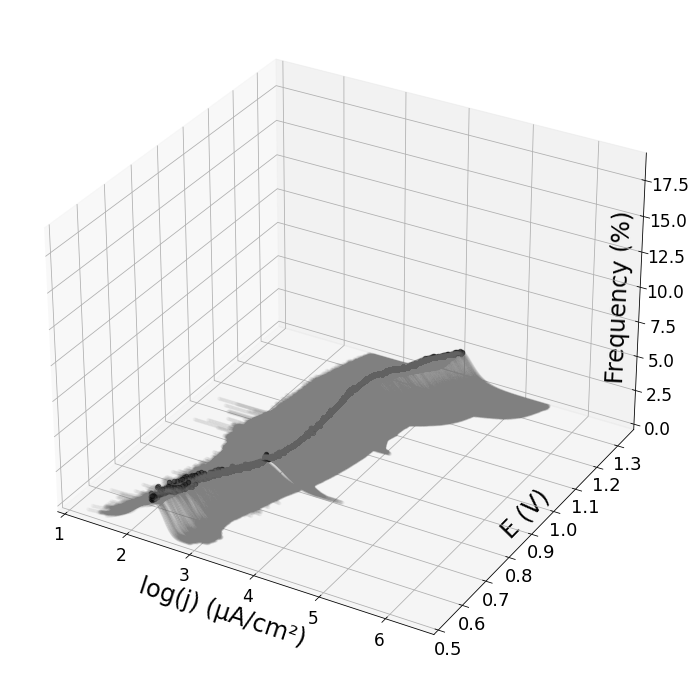

In [92]:
modelled_frequency_histogram_3D(j_0005_100,E_0005_100,lfs_0005_100)

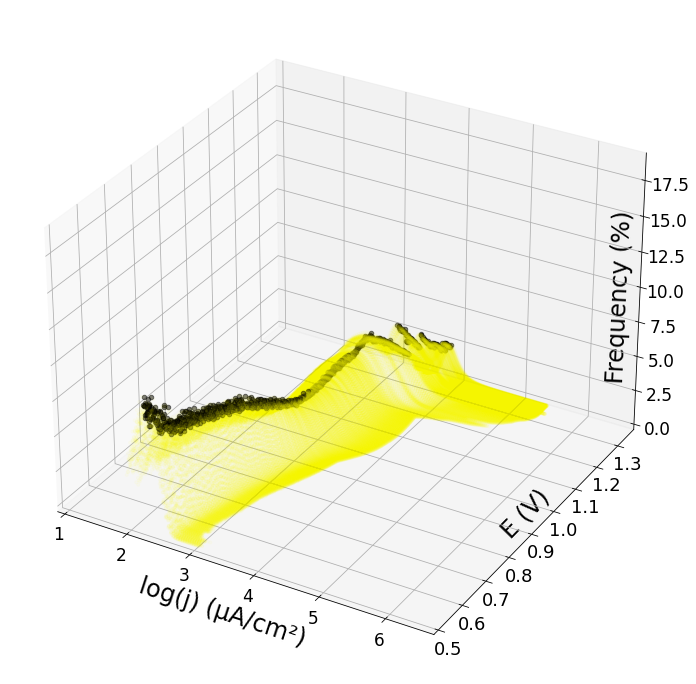

In [93]:
modelled_frequency_histogram_3D(j_001_100,E_001_100,lfs_001_100)

In [94]:
def modelled_frequency_histogram_3D_uniform(j,E,sel_func_list,title=None):
    
    if j is j_001_50:
        dist_color="orange"
        color_alpha=0.02
    elif j is j_005_100:
        dist_color="cyan"
        color_alpha=0.03
    elif j is j_005_50:
        dist_color="blue"
        color_alpha=0.03
        
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')

    fig = plt.figure()
    fig.set_size_inches(12, 30)
    ax = plt.axes(projection='3d')
    for i, row in j.iterrows():
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i]
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))
            x=np.linspace(jsort[0],jsort[-1],len(unique))      
            bin_edges = np.histogram_bin_edges(unique, bins=len(unique))  
            
            if counts.max() <= 2 and sel_E[0] > 0.75: 
                dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                dist.fit_transform(jsort, verbose=1) 
            
            else:
                dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) #['norm','t']
                dist.fit_transform(jsort, verbose=1) 
                
            parameters=[] 
            for p in dist.model['params']:
                parameters.append(p)  
                
            if dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters)           
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)           
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)  
            elif dist.model["name"]=="loggamma":
                model=loggamma.pdf(x, *parameters) 
            elif dist.model["name"]=="rayleigh":
                model=rayleigh.pdf(x, *parameters) 
            elif dist.model["name"]=="gengamma":
                model=gengamma.pdf(x, *parameters)  
   
            else:
                if dist.model["name"]=="uniform":
                    uniformmodel=uniform.pdf(x, *parameters) 
                    ax.scatter(x, np.repeat(sel_E[0],len(unique)), 100*uniformmodel/uniformmodel.sum(), color="red",marker='.',s=40,alpha=0.03)         
                else:
                    continue
                continue
           
            ax.scatter(x, np.repeat(sel_E[0],len(unique)), 100*model/model.sum(), color=dist_color,marker='.',s=40,alpha=color_alpha)               
            ax.scatter(x[np.argmax(model)],sel_E[0],100*model.max()/model.sum(),marker='o',color="k",s=20,alpha=0.7)              
 
    ax.set_xlabel("log(j) (µA/cm²)",labelpad=8)
    ax.set_ylabel("E (V)",labelpad=-33)
    ax.set_zlabel("Frequency (%)",labelpad=-33)
    ax.set_title(title)  # optional argument
    ax.set_xlim(1,6.6)
    ax.set_ylim(0.5,1.36)
    ax.set_zlim(0,19)
    ax.tick_params(axis='x', labelsize=17,pad=1)
    ax.tick_params(axis='y', labelsize=18,pad=1)
    ax.tick_params(axis='z', labelsize=17,pad=7)
    ax.xaxis.label.set_size(24) 
    ax.yaxis.label.set_size(24) 
    ax.zaxis.label.set_size(24) 

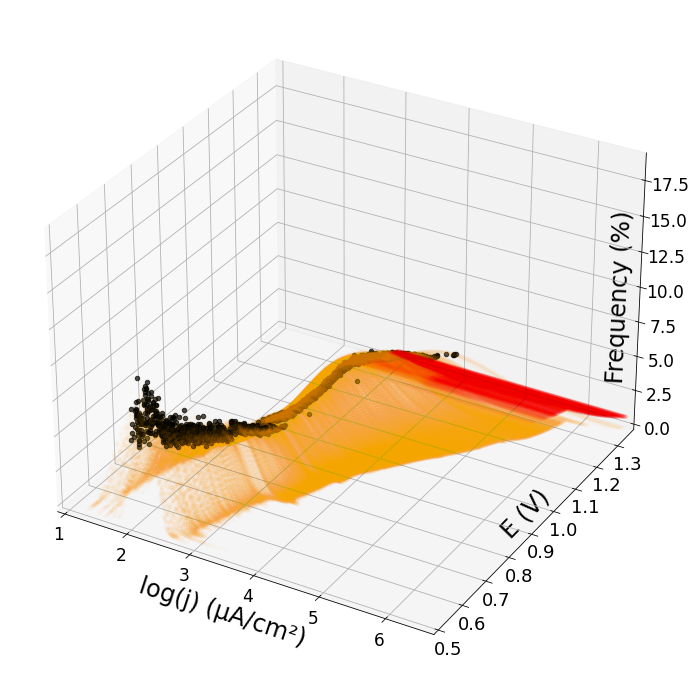

In [95]:
modelled_frequency_histogram_3D_uniform(j_001_50,E_001_50,lfs_001_50)

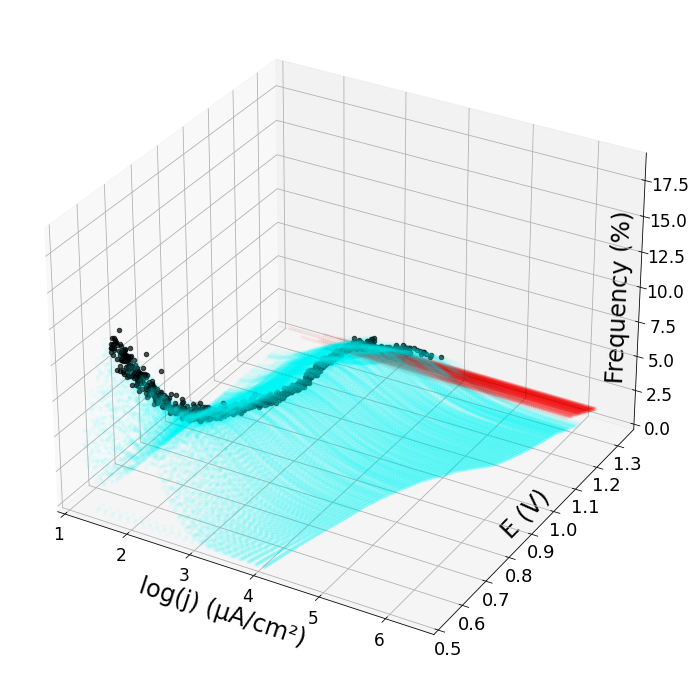

In [96]:
modelled_frequency_histogram_3D_uniform(j_005_100,E_005_100,lfs_005_100)

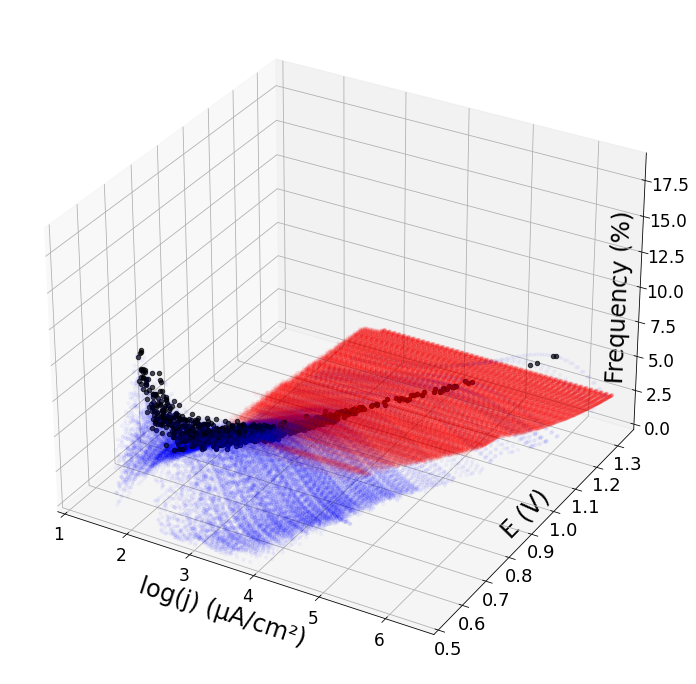

In [97]:
modelled_frequency_histogram_3D_uniform(j_005_50,E_005_50,lfs_005_50)

### Plotting the:
#### - RSS from the selected fitting functions 
#### - the variance of experimental log(j)
#### - RSS from fitting of log(j) distributions with the uniform function

##### Calculating the variance

In [98]:
import statistics

In [99]:
def variance(j,E):
    variance_l=[]
    for (i, row) in j.iterrows():
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            var=statistics.variance(sel_j)
            variance_l.append(var)

    variance=np.log10(variance_l) 
    return(variance)

In [100]:
variance_0005_100=variance(j_0005_100,E_0005_100)

In [101]:
variance_001_100=variance(j_001_100,E_001_100)

In [102]:
variance_001_50=variance(j_001_50,E_001_50)

In [103]:
variance_005_100=variance(j_005_100,E_005_100)

In [104]:
variance_005_50=variance(j_005_50,E_005_50)

##### Calculating the RSS from fitting with the uniform function

In [105]:
def RSSu(j,E):
    RSSu_l=[]
    for (i, row) in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0:

            jsort=np.sort(np.log10(sel_j))
        
            dist = distfit(distr=['uniform'],smooth=20,bins=20)
            dist.fit_transform(jsort, verbose=1) 

            RSSu_l.append(dist.model['score']) # uniform distr goodness of fit
    return(RSSu_l)

In [106]:
RSSu_0005_100=RSSu(j_0005_100,E_0005_100)

In [107]:
RSSu_001_100=RSSu(j_001_100,E_001_100)

In [108]:
RSSu_001_50=RSSu(j_001_50,E_001_50)

In [109]:
RSSu_005_100=RSSu(j_005_100,E_005_100)

In [110]:
RSSu_005_50=RSSu(j_005_50,E_005_50)

##### Building Pandas dataframes for plotting purposes

In [111]:
df_0005_100=pd.DataFrame({"RSS (normalised)":sel_RSS_0005_100,'variance':variance_0005_100,"is uniform?":sel_best_function_0005_100,'RSS (uniform distr)':RSSu_0005_100})

In [112]:
df_001_100=pd.DataFrame({"RSS (normalised)":sel_RSS_001_100,'variance':variance_001_100,"is uniform?":sel_best_function_001_100,'RSS (uniform distr)':RSSu_001_100})

In [113]:
df_001_50=pd.DataFrame({"RSS (normalised)":sel_RSS_001_50,'variance':variance_001_50,"is uniform?":sel_best_function_001_50,'RSS (uniform distr)':RSSu_001_50})

In [114]:
df_005_100=pd.DataFrame({"RSS (normalised)":sel_RSS_005_100,'variance':variance_005_100,"is uniform?":sel_best_function_005_100,'RSS (uniform distr)':RSSu_005_100})

In [115]:
df_005_50=pd.DataFrame({"RSS (normalised)":sel_RSS_005_50,'variance':variance_005_50,"is uniform?":sel_best_function_005_50,'RSS (uniform distr)':RSSu_005_50})

#### RSS from the selected fitting functions, as a function of E (V)

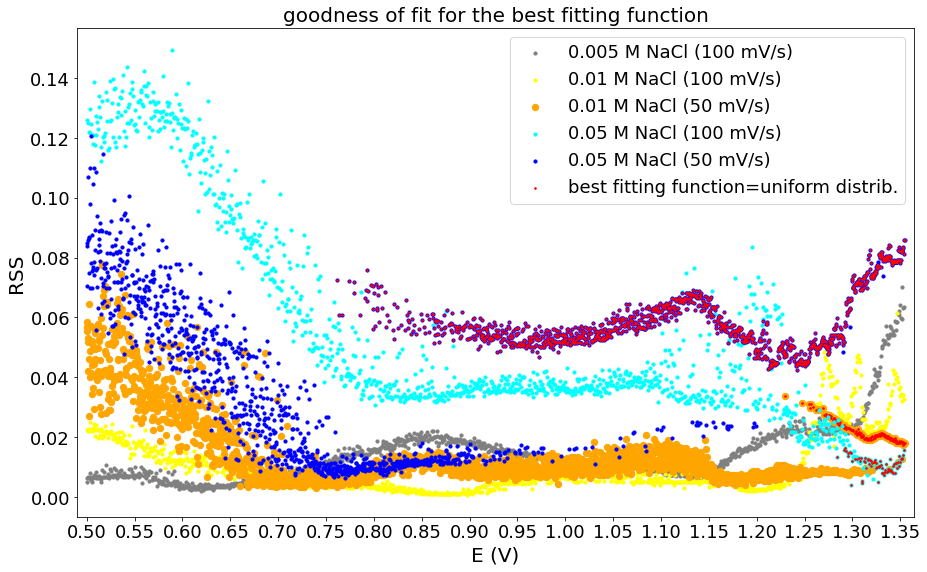

In [116]:
fig, ax = plt.subplots(figsize=(15,9))

ax.set_ylabel("RSS")
ax.set_xlabel("E (V)")

ax.tick_params(axis='both', which='major', labelsize=18)
ax.xaxis.label.set_size(20)
ax.yaxis.label.set_size(20)
ax.set_title("goodness of fit for the best fitting function",fontsize = 20)
ax.set_xticks(np.arange(0.5,1.3544115,0.05))
ax.set_xlim(0.5-0.01,1.3544115+0.01)

ax.scatter(E_0005_100,df_0005_100["RSS (normalised)"],marker="o",color="grey",s=10,label="0.005 M NaCl (100 mV/s)")
ax.scatter(E_001_100,df_001_100["RSS (normalised)"],marker="o",color="yellow",s=10,label="0.01 M NaCl (100 mV/s)")
ax.scatter(E_001_50,df_001_50["RSS (normalised)"],marker="o",facecolors='orange', edgecolors='orange',s=40,label="0.01 M NaCl (50 mV/s)")
ax.scatter(E_001_50[df_001_50["is uniform?"]=="uniform"],df_001_50["RSS (normalised)"][df_001_50["is uniform?"]=="uniform"],marker=".",s=10,color="red")
ax.scatter(E_005_100,df_005_100["RSS (normalised)"],marker="o",color="cyan",s=10,label="0.05 M NaCl (100 mV/s)")
ax.scatter(E_005_100[df_005_100["is uniform?"]=="uniform"],df_005_100["RSS (normalised)"][df_005_100["is uniform?"]=="uniform"],marker=".",s=10,color="red")
ax.scatter(E_005_50,df_005_50["RSS (normalised)"],marker="o",color="blue",s=10,label="0.05 M NaCl (50 mV/s)")
ax.scatter(E_005_50[df_005_50["is uniform?"]=="uniform"],df_005_50["RSS (normalised)"][df_005_50["is uniform?"]=="uniform"],marker=".",s=10,color="red",label="best fitting function=uniform distrib.")

ax.legend(fontsize=18)

#### Variance of experimental log(j), as a function of E (V)

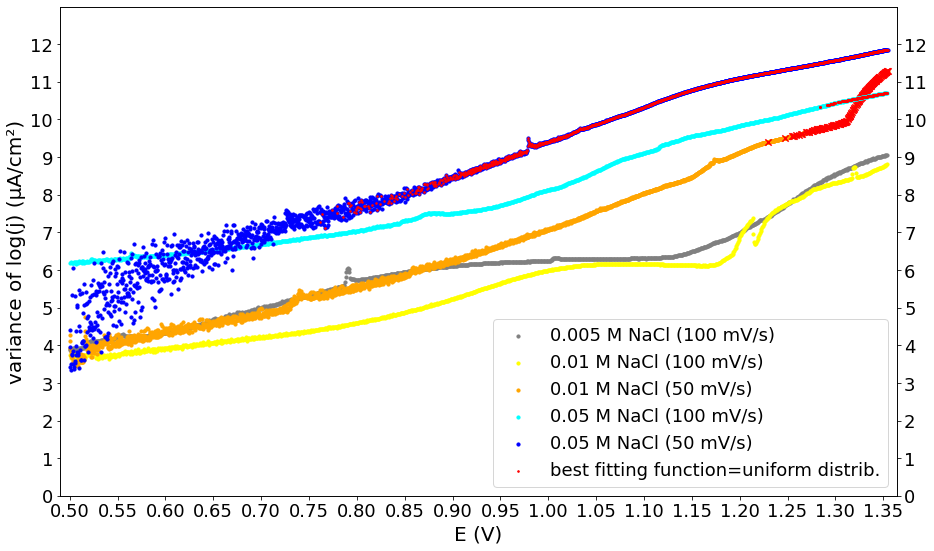

In [117]:
fig, ax = plt.subplots(figsize=(15,9))

ax.set_xlabel("E (V)")
ax.set_ylabel("variance of log(j) (µA/cm²)")

ax.tick_params(axis='both', which='major', labelsize=18)
ax.xaxis.label.set_size(20)
ax.yaxis.label.set_size(20)
ax.set_xticks(np.arange(0.5,1.3544115,0.05))
ax.set_xlim(0.5-0.01,1.3544115+0.01)

ax.scatter(E_0005_100,df_0005_100["variance"],marker="o",color="grey",s=10,label="0.005 M NaCl (100 mV/s)")
ax.scatter(E_001_100,df_001_100["variance"],marker="o",color="yellow",s=10,label="0.01 M NaCl (100 mV/s)")
ax.scatter(E_001_50,df_001_50["variance"],marker="o",facecolors='orange', edgecolors='orange',s=10,label="0.01 M NaCl (50 mV/s)")
ax.scatter(E_001_50[df_001_50["is uniform?"]=="uniform"],df_001_50["variance"][df_001_50["is uniform?"]=="uniform"],marker="x",s=40,color="red")
ax.scatter(E_005_100,df_005_100["variance"],marker="o",color="cyan",s=10,label="0.05 M NaCl (100 mV/s)")
ax.scatter(E_005_100[df_005_100["is uniform?"]=="uniform"],df_005_100["variance"][df_005_100["is uniform?"]=="uniform"],marker="x",s=5,color="red")
ax.scatter(E_005_50,df_005_50["variance"],marker="o",color="blue",s=10,label="0.05 M NaCl (50 mV/s)")
ax.scatter(E_005_50[df_005_50["is uniform?"]=="uniform"],df_005_50["variance"][df_005_50["is uniform?"]=="uniform"],marker=".",s=10,color="red",label="best fitting function=uniform distrib.")

ax.set_yticks(np.arange(0,13,1))
ax.set_ylim(0,13)

ax.legend(fontsize=18,loc='best')

ax2 = ax.twinx()
ax2.set_yticks(np.arange(0,13,1))
ax2.set_ylim(0,13)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.yaxis.label.set_size(20)

#### RSS from fitting the log(j) distributions with the uniform function, as a function of E (V)

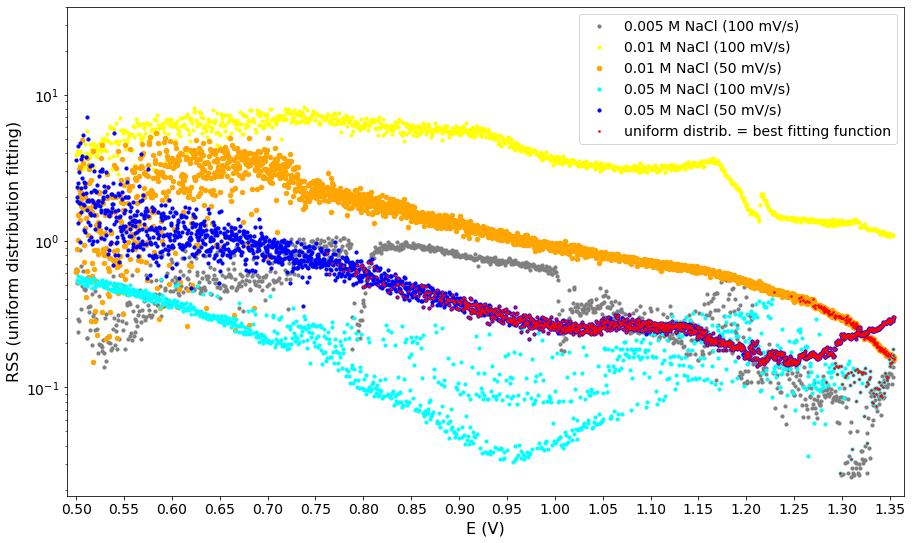

In [118]:
fig, ax = plt.subplots(figsize=(15,9))

ax.set_ylabel("RSS (uniform distribution fitting)")
ax.set_xlabel("E (V)")

ax.tick_params(axis='both', which='major', labelsize=14)
ax.xaxis.label.set_size(16)
ax.yaxis.label.set_size(16)
ax.set_xticks(np.arange(0.5,1.3544115,0.05))
ax.set_xlim(0.5-0.01,1.3544115+0.01)

ax.scatter(E_0005_100,df_0005_100["RSS (uniform distr)"],marker="o",color="grey",s=10,label="0.005 M NaCl (100 mV/s)")
ax.scatter(E_001_100,df_001_100["RSS (uniform distr)"],marker="o",color="yellow",s=10,label="0.01 M NaCl (100 mV/s)")
ax.scatter(E_001_50,df_001_50["RSS (uniform distr)"],marker="o",facecolors='orange', edgecolors='orange',s=20,label="0.01 M NaCl (50 mV/s)")
ax.scatter(E_001_50[df_001_50["is uniform?"]=="uniform"],df_001_50["RSS (uniform distr)"][df_001_50["is uniform?"]=="uniform"],marker=".",s=10,color="red")
ax.scatter(E_005_100,df_005_100["RSS (uniform distr)"],marker="o",color="cyan",s=10,label="0.05 M NaCl (100 mV/s)")
ax.scatter(E_005_100[df_005_100["is uniform?"]=="uniform"],df_005_100["RSS (uniform distr)"][df_005_100["is uniform?"]=="uniform"],marker=".",s=10,color="red")
ax.scatter(E_005_50,df_005_50["RSS (uniform distr)"],marker="o",color="blue",s=10,label="0.05 M NaCl (50 mV/s)")
ax.scatter(E_005_50[df_005_50["is uniform?"]=="uniform"],df_005_50["RSS (uniform distr)"][df_005_50["is uniform?"]=="uniform"],marker=".",s=10,color="red",label="uniform distrib. = best fitting function")

ax.set_yscale('log')
ax.set_ylim(-0.8,40)
ax.legend(fontsize=14,loc="upper right")

### Experimental j (μA/cm²) Vs E (V) curves

In [119]:
def mean_residuals(j): # calculating the j mean and residuals
    mean=j.mean(axis=1)  
    res=j.subtract(mean, axis = 0)
    res=res.abs()
    sum_res=res.sum(axis=0)
    sum_res.sort_values(inplace=True)
    return(mean,sum_res)

In [120]:
m_0005_100,sum_res_0005_100=mean_residuals(j_0005_100)

In [121]:
m_001_100,sum_res_001_100=mean_residuals(j_001_100)

In [122]:
m_001_50,sum_res_001_50=mean_residuals(j_001_50)

In [123]:
m_005_100,sum_res_005_100=mean_residuals(j_005_100)

In [124]:
m_005_50,sum_res_005_50=mean_residuals(j_005_50)

In [125]:
def exp_curves_plot(j,E,m,sum_res,df,title):
    color = cm.rainbow(np.linspace(0, 1, j.shape[1]))
    if j is j_001_50:
        color_alpha=0.05
    if j is j_005_100:
        color_alpha=0.05
    if j is j_005_50:
        color_alpha=0.02

    fig, ax = plt.subplots(figsize=(18, 12))
    for i,c in zip(sum_res.index,color):
        ax.scatter(E,j[i], color=c,marker='.',s=1)
        
    ax.plot(E,m, color="k",linewidth=1,label="mean")
    ax.legend(loc ="upper left",prop={'size': 16})
    ax.set_yscale('log')
    ax.set_ylabel("j (µA/cm²)")
    ax.set_xlabel("E (V)")
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.xaxis.label.set_size(16)
    ax.yaxis.label.set_size(16)
    ax.set_title(title,fontsize = 16)    
    ax.set_xticks(np.arange(0.5,1.3544115,0.05)) # 
    ax.set_xlim(0.5-0.01,1.3544115+0.01) # 
    ax.set_ylim(10, 4800000) 

# plotting vertical lines at potentials where the uniform distribution was the selected fitting function
    xcoords = E["E (V)"][df["is uniform?"]=="uniform"]
    for xc in xcoords:
        plt.axvline(x=xc,color="black",alpha=color_alpha)  

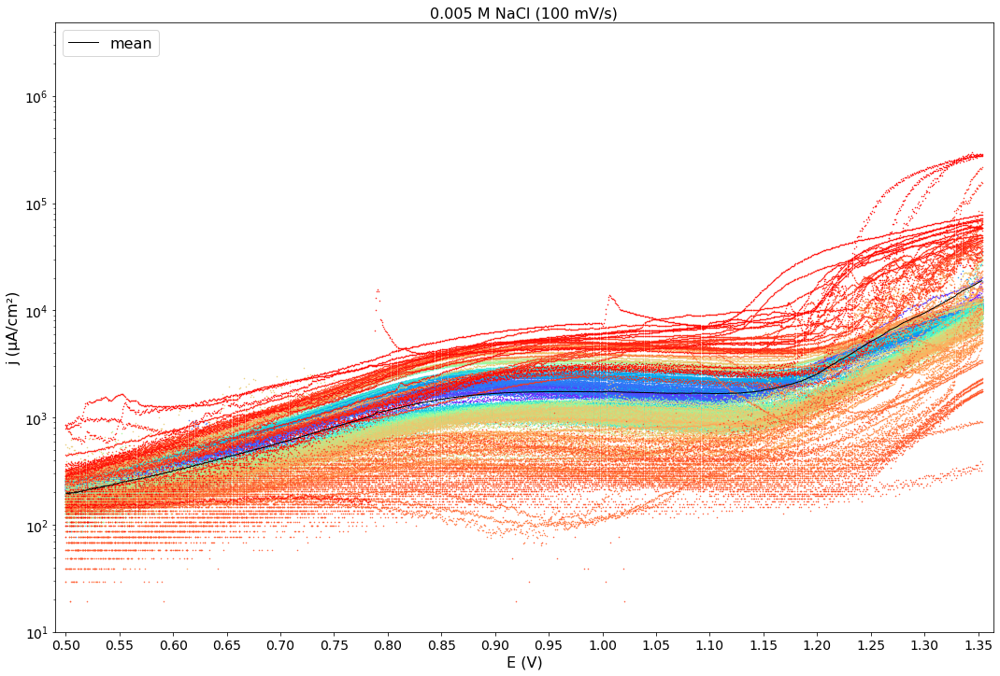

In [126]:
exp_curves_plot(j_0005_100,E_0005_100,m_0005_100,sum_res_0005_100,df_0005_100,"0.005 M NaCl (100 mV/s)")

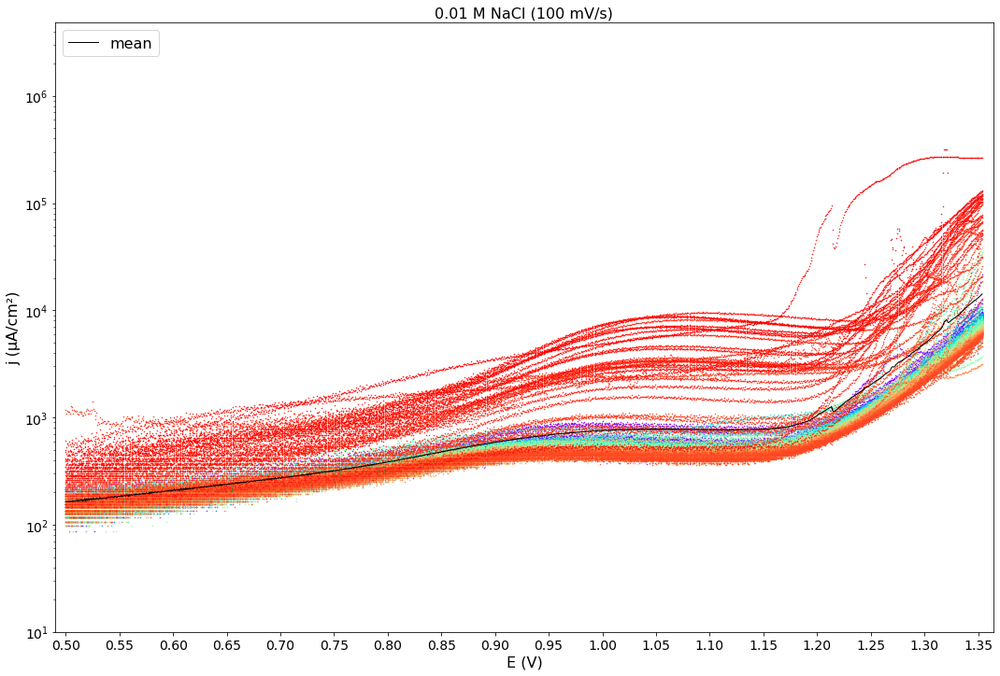

In [127]:
exp_curves_plot(j_001_100,E_001_100,m_001_100,sum_res_001_100,df_001_100,"0.01 M NaCl (100 mV/s)")

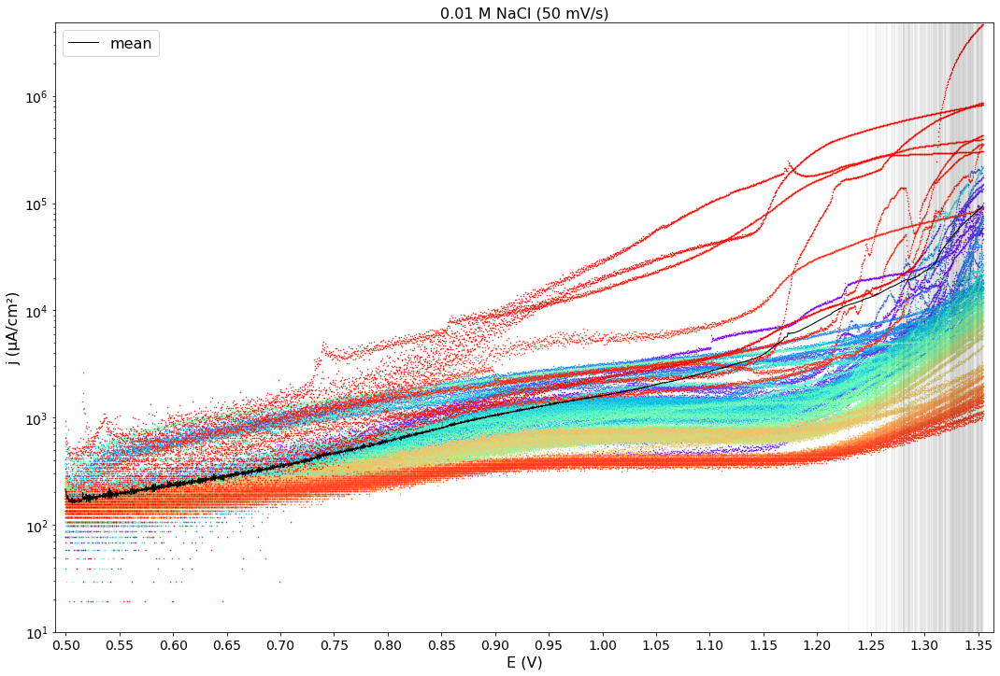

In [128]:
exp_curves_plot(j_001_50,E_001_50,m_001_50,sum_res_001_50,df_001_50,"0.01 M NaCl (50 mV/s)")

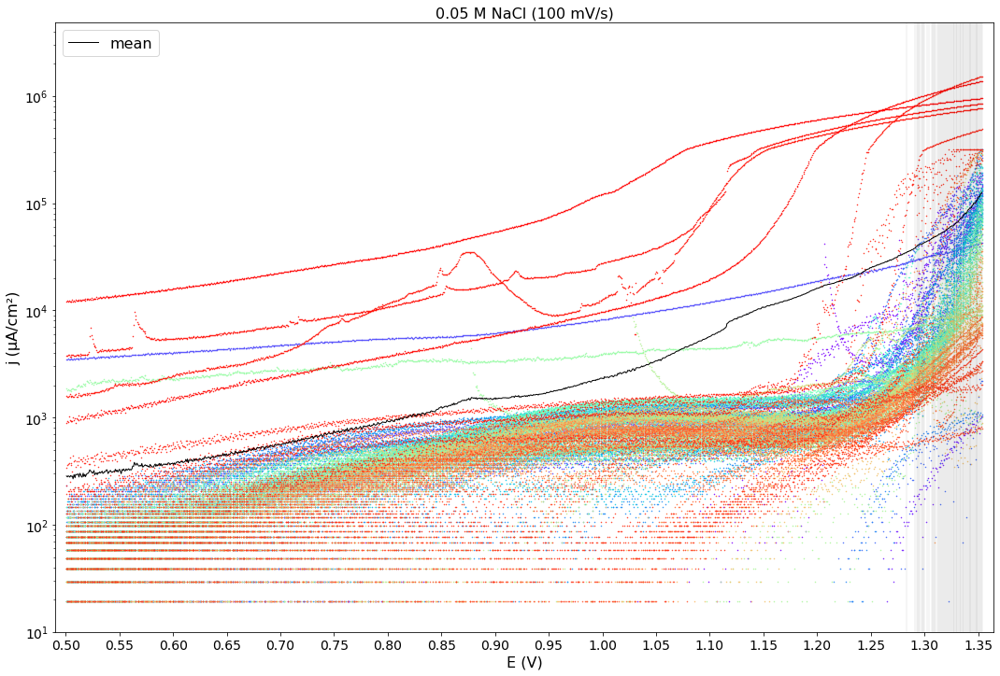

In [129]:
exp_curves_plot(j_005_100,E_005_100,m_005_100,sum_res_005_100,df_005_100,"0.05 M NaCl (100 mV/s)")

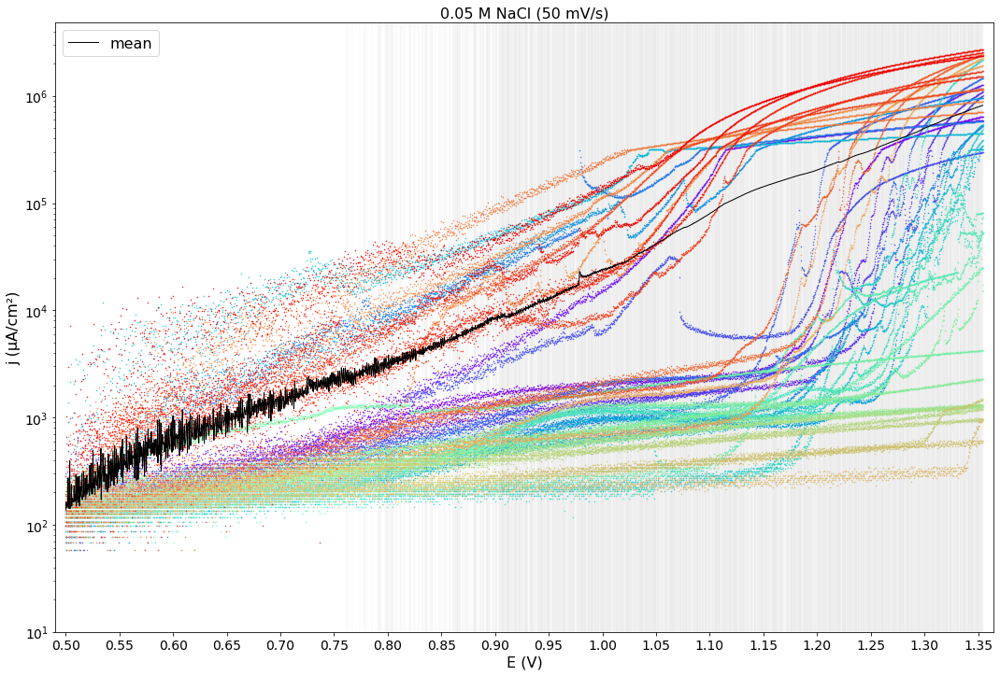

In [130]:
exp_curves_plot(j_005_50,E_005_50,m_005_50,sum_res_005_50,df_005_50,"0.05 M NaCl (50 mV/s)")

### 2D colourmap representations of the modelled distributions of log(j) (µA/cm²), as a function of E (V) 

#### Frequency proportional to the colourmaps individually calculated for each E

In [131]:
def colour_map_2D(j,E,sel_func_list):
    fig, ax = plt.subplots(figsize=(18, 12))
    for i,row in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))      
            x=np.linspace(jsort[0],jsort[-1],len(unique))    
        
            dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2)) #['norm','t']
            dist.fit_transform(jsort, verbose=1) 
            
            parameters=[]          
            for p in dist.model['params']:
                parameters.append(p)  
            
            if dist.model["name"]=="weibull_max":
                model=weibull_max.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)           
            elif dist.model["name"]=="t":
                model=t.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)          
            elif dist.model["name"]=="lognorm":
                model=lognorm.pdf(x, *parameters) 
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)           
            elif dist.model["name"]=="exponpow":
                model=exponpow.pdf(x, *parameters) 
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)          
            elif dist.model["name"]=="mielke":
                model=mielke.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)         
            elif dist.model["name"]=="burr":
                model=burr.pdf(x, *parameters) 
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)                     
            elif dist.model["name"]=="fatiguelife":
                model=fatiguelife.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)           
            elif dist.model["name"]=="gompertz":
                model=gompertz.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)          
            elif dist.model["name"]=="recipinvgauss":
                model=recipinvgauss.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)          
            elif dist.model["name"]=="f":
                model=f.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)            
            elif dist.model["name"]=="tukeylambda": 
                model=tukeylambda.pdf(x, *parameters)   
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)          
            elif dist.model["name"]=="powerlognorm":
                model=powerlognorm.pdf(x, *parameters) 
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)           
            elif dist.model["name"]=="johnsonsu":
                model=johnsonsu.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)           
            elif dist.model["name"]=="exponweib":
                model=exponweib.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)     
            elif dist.model["name"]=="fisk":
                model=fisk.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)    
            elif dist.model["name"]=="hypsecant":
                model=hypsecant.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)     
            elif dist.model["name"]=="logistic":
                model=logistic.pdf(x, *parameters) 
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)     
            elif dist.model["name"]=="foldnorm":
                model=foldnorm.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)    
            elif dist.model["name"]=="betaprime":
                model=betaprime.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)    
            elif dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)     
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            else:
                continue
                
    ax.set_ylabel("j (µA/cm²)")
    ax.set_xlabel("E (V)")
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.set_xticks(np.arange(0.5,1.3544115,0.05))
    ax.set_xlim(0.5-0.01,1.3544115+0.01) 
    ax.set_ylim(1, 6.68)  # new
    ax.set_yticklabels(["10\u00b9","10\u00b2","10\u00b3","10\u2074","10\u2075","10\u2076"])

In [132]:
def colour_map_2D_uniform(j,E,sel_func_list):
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')
    fig, ax = plt.subplots(figsize=(18, 12))
    for i,row in j.iterrows():
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))      
            x=np.linspace(jsort[0],jsort[-1],len(unique)) 
          
            if counts.max() <= 2 and sel_E.all() > 0.75:
                dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                dist.fit_transform(jsort, verbose=1)
                
            else: 
                dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) #['norm','t']
                dist.fit_transform(jsort, verbose=1) 
                
            parameters=[]          
            for p in dist.model['params']:
                parameters.append(p)   
                
            if dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)     
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="rayleigh":
                model= rayleigh.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="loggamma":
                model=loggamma.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=='gengamma':
                model=gengamma.pdf(x, *parameters)
                P_t=np.concatenate(preprocessing.normalize([100*model/model.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=200,linewidth=2)
            elif dist.model["name"]=="uniform":
                uniformmodel=uniform.pdf(x, *parameters) # uniform: NO mode
                P_t=np.concatenate(preprocessing.normalize([100*uniformmodel/uniformmodel.sum()]))
                ax.scatter(np.repeat(sel_E[0],len(unique)),x,c=P_t,marker="|",s=150,linewidth=1)                 
            else:
                continue
                           
    ax.set_ylabel("j (µA/cm²)")
    ax.set_xlabel("E (V)")
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.set_xticks(np.arange(0.5,1.3544115,0.05))
    ax.set_xlim(0.5-0.01,1.3544115+0.01) 
    ax.set_ylim(1, 6.68)  # new
    ax.set_yticklabels(["10\u00b9","10\u00b2","10\u00b3","10\u2074","10\u2075","10\u2076"])

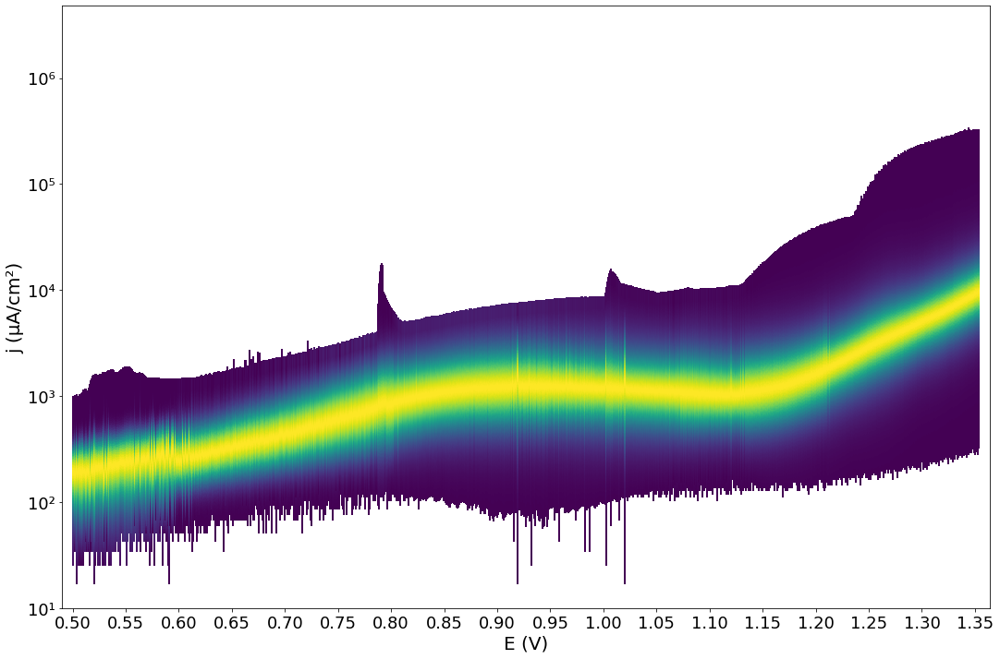

In [133]:
colour_map_2D(j_0005_100,E_0005_100,lfs_0005_100)

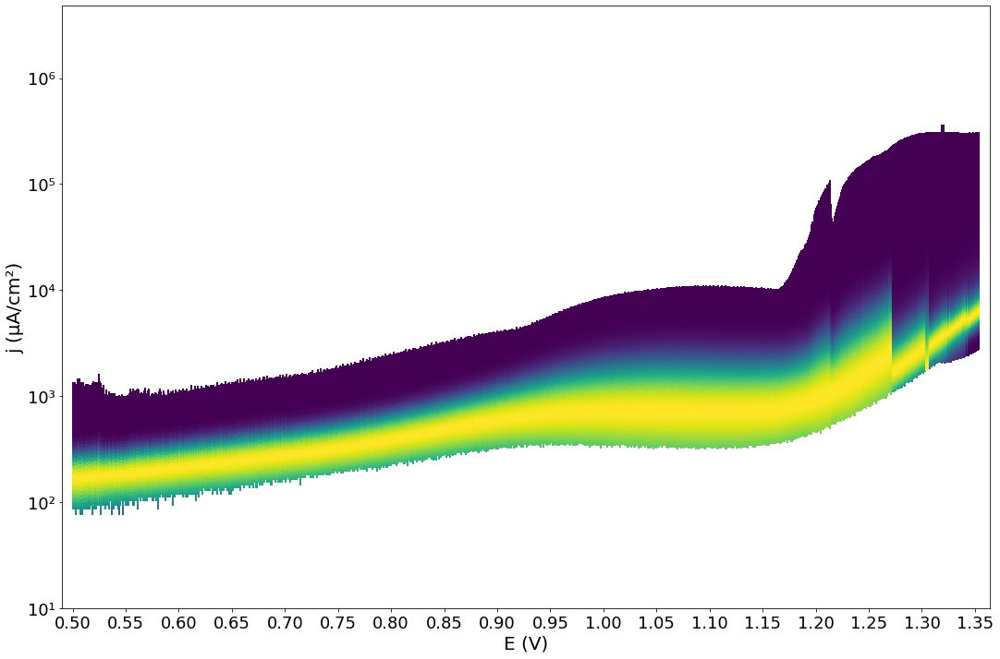

In [134]:
colour_map_2D(j_001_100,E_001_100,lfs_001_100)

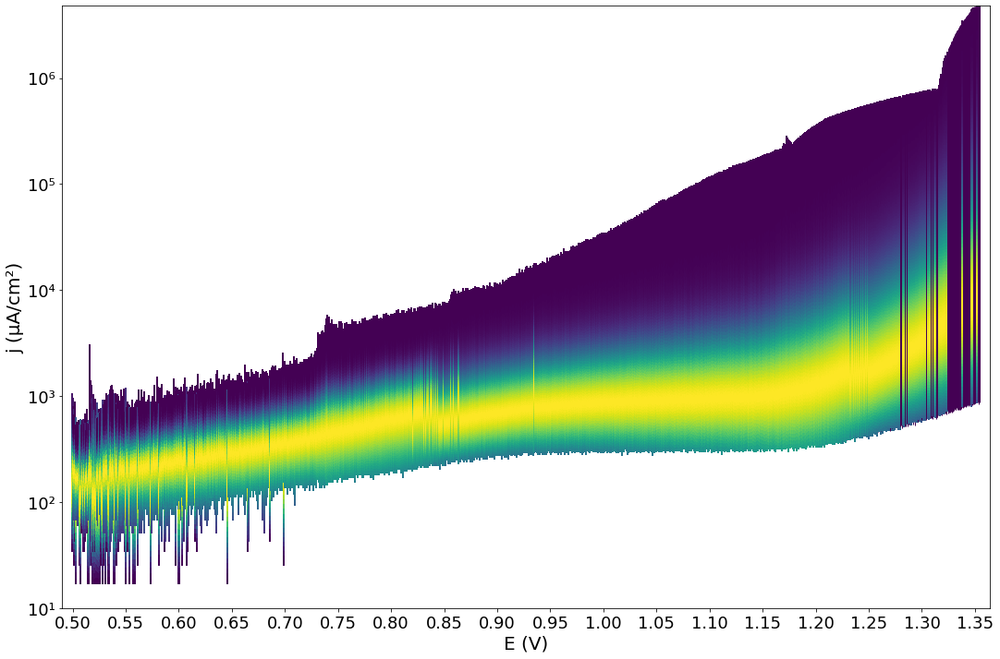

In [135]:
colour_map_2D_uniform(j_001_50,E_001_50,lfs_001_50)

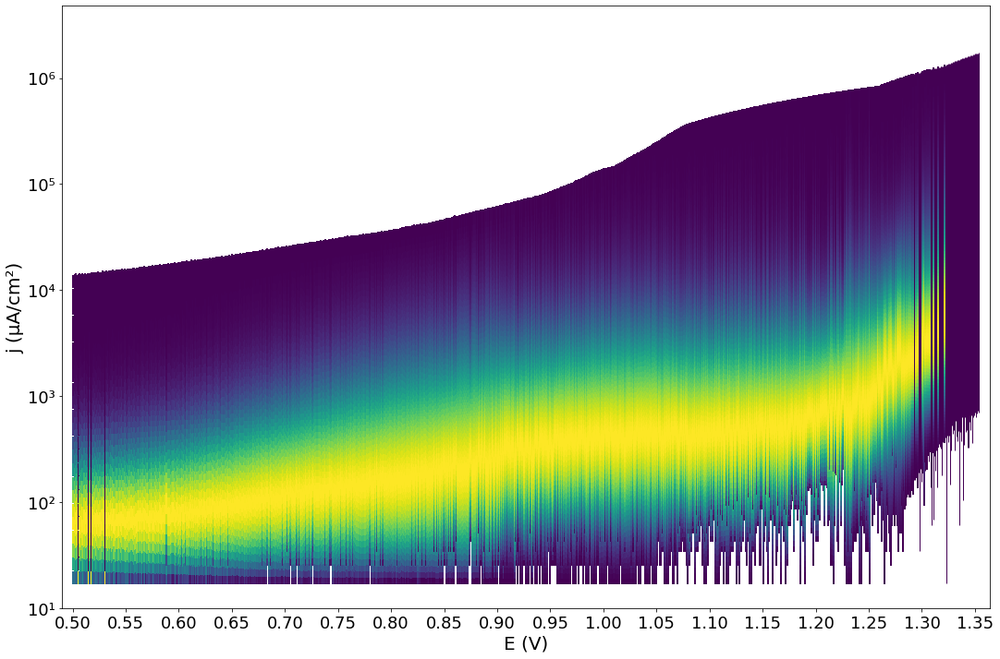

In [136]:
colour_map_2D_uniform(j_005_100,E_005_100,lfs_005_100)

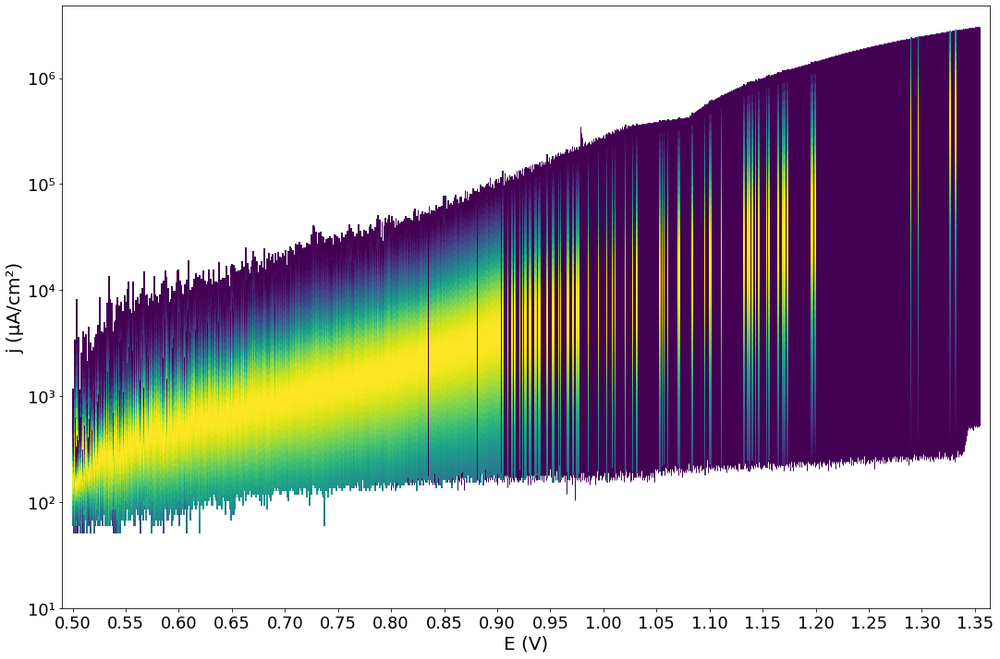

In [137]:
colour_map_2D_uniform(j_005_50,E_005_50,lfs_005_50)

#### Probability surfaces with the frequency indicated by the colourbar (same colourmap for the entire E range)

##### Getting flattened arrays for building the colourbar

In [138]:
def whole_arrays(j,E,sel_func_list):
    E_ar=[]
    j_ar=[]
    P_ar=[]
    color_bar=[]
    
    for i,row in j.iterrows():
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))      
            x=np.linspace(jsort[0],jsort[-1],len(unique))      
        
            dist = distfit(distr=sel_func_list,smooth=20,bins=round(len(unique)/2)) 
            dist.fit_transform(jsort, verbose=1) 
        
            parameters=[]          
            for p in dist.model['params']:
                parameters.append(p)  

            if dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum()) 
            elif dist.model["name"]=="f":
                model=f.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="tukeylambda": 
                model=tukeylambda.pdf(x, *parameters)   
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())                     
            elif dist.model["name"]=="powerlognorm":
                model=powerlognorm.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="johnsonsu":
                model=johnsonsu.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="exponweib":
                model=exponweib.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum()) 
            elif dist.model["name"]=="exponpow":
                model=exponpow.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="mielke":
                model=mielke.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="burr":
                model=burr.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())                      
            elif dist.model["name"]=="fatiguelife":
                model=fatiguelife.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="gompertz":
                model=gompertz.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="recipinvgauss":
                model=recipinvgauss.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum()) 
            elif dist.model["name"]=="fisk":
                model=fisk.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="hypsecant":
                model=hypsecant.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="logistic":
                model=logistic.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="foldnorm":
                model=foldnorm.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="betaprime":
                model=betaprime.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="weibull_max":
                model=weibull_max.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())                      
            elif dist.model["name"]=="t":
                model=t.pdf(x, *parameters)
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="lognorm":
                model=lognorm.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())  
            else:
                continue
    
    E_ar=np.concatenate(E_ar, axis=0)
    j_ar=np.concatenate(j_ar, axis=0)
    P_ar=np.concatenate(P_ar, axis=0) # probability
    P_ar_nor=np.concatenate(preprocessing.normalize([P_ar])) # normalised probability

    color_bar=np.concatenate(color_bar, axis=0) 
    
    return(E_ar,j_ar,P_ar_nor,color_bar)

In [139]:
def whole_arrays_uniform(j,E,sel_func_list):
    E_ar=[]
    j_ar=[]
    P_ar=[]
    color_bar=[]
    
    sel_func_list_tempo=sel_func_list.copy()
    sel_func_list_tempo.remove('uniform')
    for i,row in j.iterrows(): 
        idx=np.where(~np.isnan(row)) 
        sel_E=E.loc[i] 
        sel_j=row.iloc[idx]
        if sel_j.shape[0] != 0: 
            unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
            jsort=np.sort(np.log10(sel_j))      
            x=np.linspace(jsort[0],jsort[-1],len(unique))      
        
            if counts.max() <= 2 and sel_E.all() > 0.75:
                dist = distfit(distr=["uniform"],smooth=20,bins=20)   
                dist.fit_transform(jsort, verbose=1) 
                
            else: 
                dist = distfit(distr=sel_func_list_tempo,smooth=20,bins=round(len(unique)/2)) 
                dist.fit_transform(jsort, verbose=1) 
                
            parameters=[]          
            for p in dist.model['params']:
                parameters.append(p)  

            if dist.model["name"]=="gumbel_l":
                model=gumbel_l.pdf(x, *parameters) 
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="pearson3":
                model=pearson3.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())            
            elif dist.model["name"]=="loggamma":
                model=loggamma.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="maxwell":
                model=maxwell.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="rayleigh":
                model=rayleigh.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="rice":
                model=rice.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum()) 
            elif dist.model["name"]=="gengamma":
                model=gengamma.pdf(x, *parameters)  
                E_ar.append(np.repeat(sel_E[0],len(unique)))
                j_ar.append(x)
                P_ar.append(100*model/model.sum())
                color_bar.append(100*model/model.sum())
            elif dist.model["name"]=="uniform":
                uniformmodel=uniform.pdf(x, *parameters) 
                color_bar.append(100*uniformmodel/uniformmodel.sum())
            else:
                continue
    
    E_ar=np.concatenate(E_ar, axis=0)
    j_ar=np.concatenate(j_ar, axis=0)
    P_ar=np.concatenate(P_ar, axis=0) # probability 
    P_ar_nor=np.concatenate(preprocessing.normalize([P_ar])) # normalised probability

    color_bar=np.concatenate(color_bar, axis=0)
    
    return(E_ar,j_ar,P_ar_nor,color_bar)

In [140]:
E_ar_0005_100,j_ar_0005_100,P_ar_nor_0005_100,color_bar_0005_100=whole_arrays(j_0005_100,E_0005_100,lfs_0005_100) 

In [141]:
E_ar_001_100,j_ar_001_100,P_ar_nor_001_100,color_bar_001_100=whole_arrays(j_001_100,E_001_100,lfs_001_100) 

In [142]:
E_ar_001_50,j_ar_001_50,P_ar_nor_001_50,color_bar_001_50=whole_arrays_uniform(j_001_50,E_001_50,lfs_001_50)

In [143]:
E_ar_005_100,j_ar_005_100,P_ar_nor_005_100,color_bar_005_100=whole_arrays_uniform(j_005_100,E_005_100,lfs_005_100)

In [144]:
E_ar_005_50,j_ar_005_50,P_ar_nor_005_50,color_bar_005_50=whole_arrays_uniform(j_005_50,E_005_50,lfs_005_50)

In [145]:
from matplotlib import cm
viridis = cm.get_cmap('viridis', 12) # common colourmap

In [146]:
def colour_map_2D_colorbar(E_ar,j_ar,P_ar_nor,color_bar,title,j=None,E=None): # in case of uniform distr, provide j,E
    fig, ax = plt.subplots() 
    fig.set_size_inches(22.05, 12)
    
    try:
        if j is j_001_50:
            linewidth_uni=1
        elif j is j_005_100:
            linewidth_uni=1.5
        elif j is j_005_50:
            linewidth_uni=0.9
        for i, row in j.iterrows(): # getting uniform distribution lines
            idx=np.where(~np.isnan(row)) 
            sel_E=E.loc[i] 
            sel_j=row.iloc[idx]
            if sel_j.shape[0] != 0: 
                unique, counts = np.unique(np.log10(sel_j), return_counts=True)         
                jsort=np.sort(np.log10(sel_j))         
                if counts.max() <= 2 and sel_E.all() > 0.75:
                    ax.plot(np.repeat(sel_E,2),[jsort[-1],jsort[0]],c=viridis(0),linewidth=linewidth_uni)
    except:
        pass
    
    if title == "0.005 M NaCl (100 mV/s)":
        linewidth=1.5
        size=10
    elif title == "0.01 M NaCl (100 mV/s)":
        linewidth=1.5
        size=30
    elif title == "0.01 M NaCl (50 mV/s)":
        linewidth=1
        size=100
    elif title == "0.05 M NaCl (100 mV/s)":
        linewidth=2
        size=200
    elif title == "0.05 M NaCl (50 mV/s)":
        linewidth=1
        size=200
    ax.scatter(E_ar,j_ar,c=P_ar_nor,marker="|",s=size,linewidth=linewidth) 
    p=ax.scatter(np.repeat(0,len(color_bar)),np.repeat(0,len(color_bar)),c=color_bar) # creating fake point for colorbar purposes
    clb=fig.colorbar(p,pad=0.01)
    clb.ax.set_title('Probability (%)',fontsize=20)
    clb.ax.tick_params(labelsize=18) 

    ax.set_ylabel("j (µA/cm²)")
    ax.set_xlabel("E (V)")
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.set_xticks(np.arange(0.5,1.3544115,0.05))
    ax.set_xlim(0.5-0.01,1.3544115+0.01) 
    ax.set_ylim(1, 6.68)  # new
    ax.set_yticklabels(["10\u00b9","10\u00b2","10\u00b3","10\u2074","10\u2075","10\u2076"])
    ax.set_title(title,fontsize = 20)

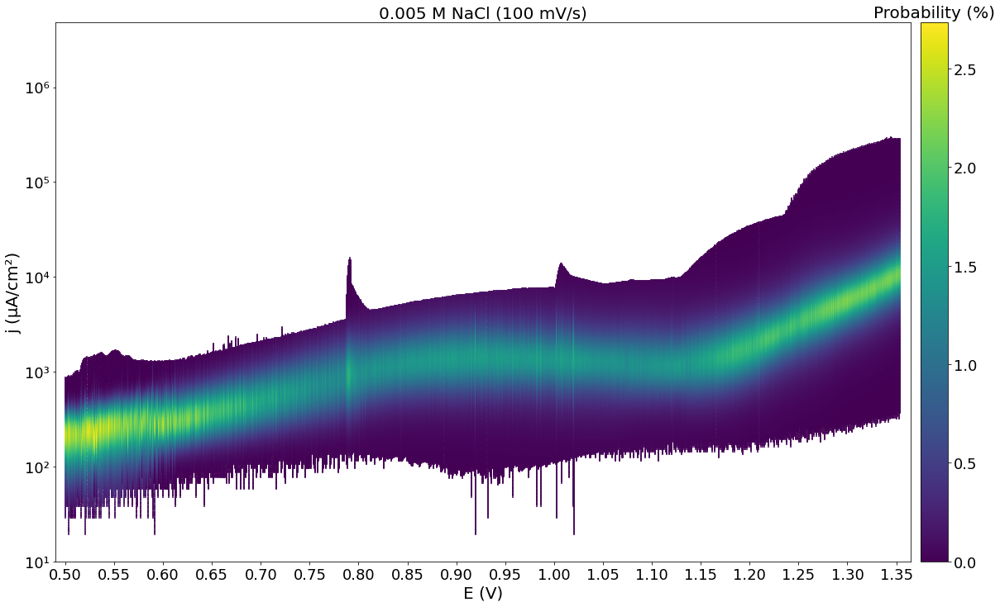

In [147]:
colour_map_2D_colorbar(E_ar_0005_100,j_ar_0005_100,P_ar_nor_0005_100,color_bar_0005_100,"0.005 M NaCl (100 mV/s)")

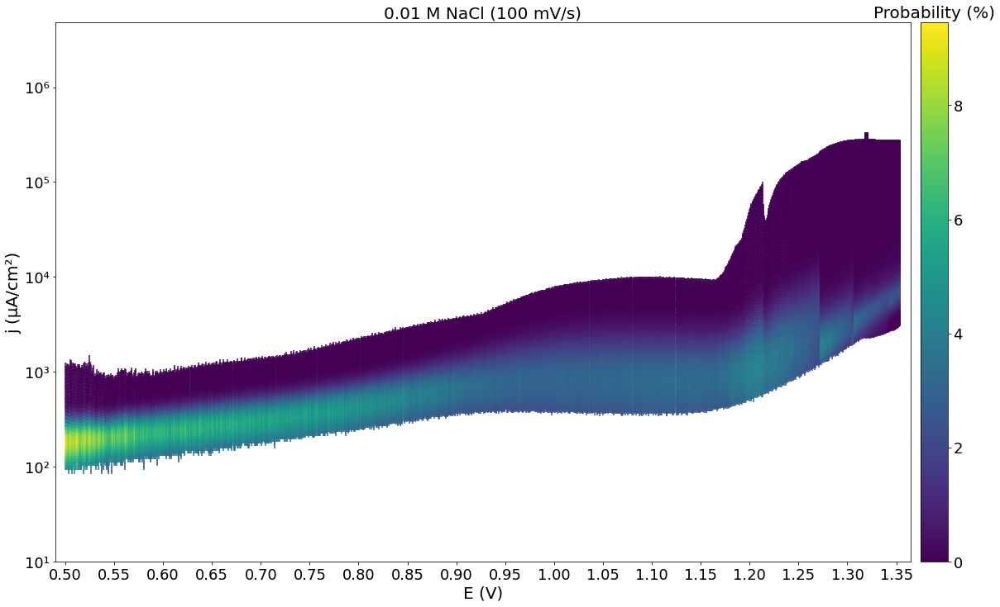

In [148]:
colour_map_2D_colorbar(E_ar_001_100,j_ar_001_100,P_ar_nor_001_100,color_bar_001_100,"0.01 M NaCl (100 mV/s)")

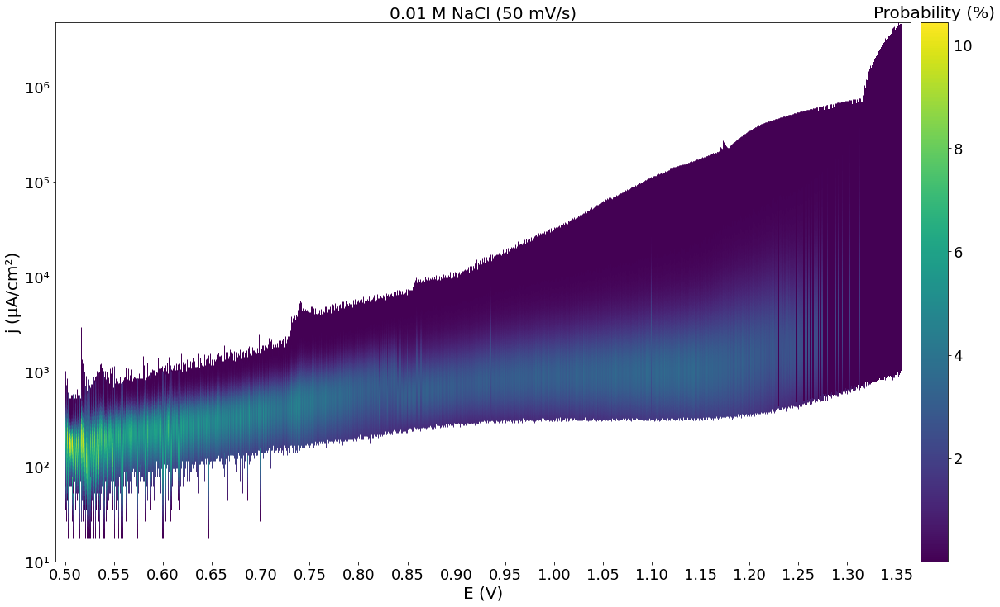

In [149]:
colour_map_2D_colorbar(E_ar_001_50,j_ar_001_50,P_ar_nor_001_50,color_bar_001_50,"0.01 M NaCl (50 mV/s)",j_001_50,E_001_50)

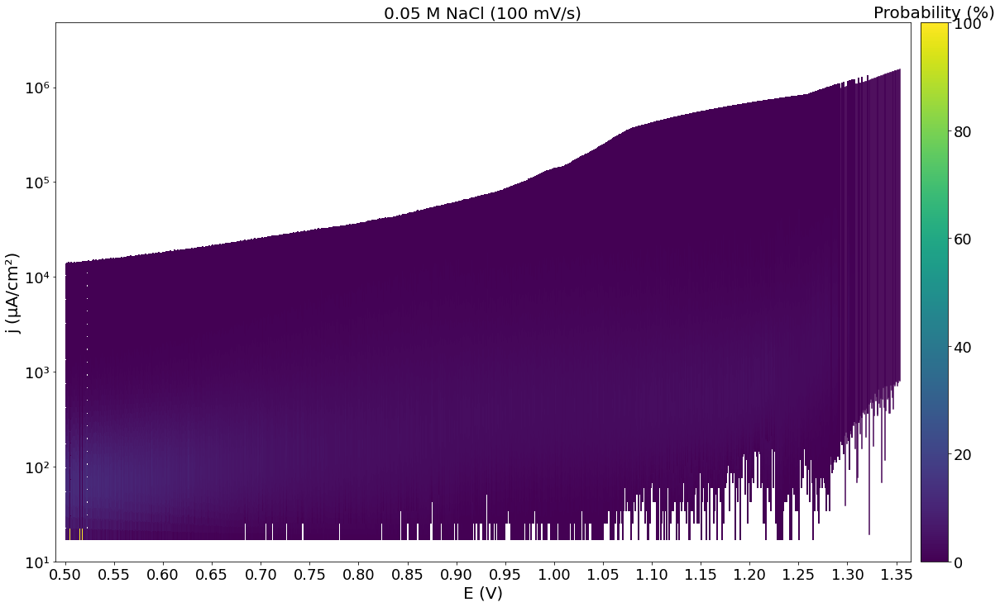

In [150]:
colour_map_2D_colorbar(E_ar_005_100,j_ar_005_100,P_ar_nor_005_100,color_bar_005_100,"0.05 M NaCl (100 mV/s)",j_005_100,E_005_100)

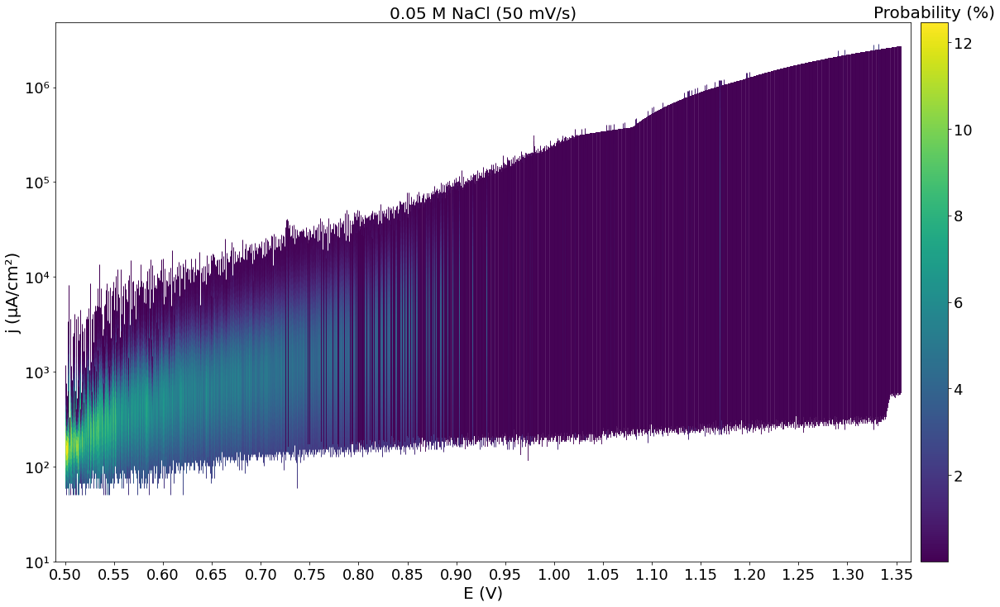

In [151]:
colour_map_2D_colorbar(E_ar_005_50,j_ar_005_50,P_ar_nor_005_50,color_bar_005_50,"0.05 M NaCl (50 mV/s)",j_005_50,E_005_50)